In [1]:
# -*- coding: utf-8 -*-
"""
Created on Thu Jun 30 13:54:02 2016

@author: anna
"""
import sys
sys.path.append('/usr/local/lib/python2.7/dist-packages/')

import time
import os
import re
import traceback
import pandas as pd
import mmap
import itertools
import numpy as np
import datetime
from os import listdir
from os.path import isfile, join
import sys, getopt
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline  
import logging
logging.getLogger("paramiko").setLevel(logging.WARNING)
from sar import PART_CPU, PART_MEM, PART_SWP, PART_IO, \
    PATTERN_CPU, PATTERN_MEM, PATTERN_SWP, PATTERN_IO, PATTERN_RESTART, \
    FIELDS_CPU, FIELD_PAIRS_CPU, FIELDS_MEM, FIELD_PAIRS_MEM, FIELDS_SWP, \
    FIELD_PAIRS_SWP, FIELDS_IO, FIELD_PAIRS_IO
import IPython
from IPython.display import display, HTML



# Required data to access the remote hosts and store the results of analysis
# Fill in!!

In [2]:
#Username for remote hosts
#Example "annac"
user=""
#Pasword for remote hosts
password=""

#Path to store sar data /home/<user>/tmp/ - is preferable
path="/home/annac/tmp/"#/Users/annachystiakova/Documents/Capacity/sar_analysis/sar_data/"
#Path for subsidiary data of hosts and classes /home/<user>/ - is preferable
source_path="/home/annac/"

Load sysstat data from remote hosts

In [3]:
import paramiko
# The function to parse the input script arguments
def parse_args(argv):
    user = ''
    password = ''
    host = ''
    param = ''
    minsize=''
    try:
        opts, args = getopt.getopt(argv,"u:p:h:v:s:",["user=","password=", "host=", "param=", "size="])
    except getopt.GetoptError:
        print 'argparse_my.py -u <user> -p <password> -h <host>'
        sys.exit(2)
    for opt, arg in opts:
        if opt == '-N':
            print 'argparse_my.py -u <user> -p <password> -h <host>'
            sys.exit()
        elif opt in ("-u", "--user"):
            user = arg
        elif opt in ("-p", "--password"):
            password = arg
        elif opt in ("-h", "--host"):
            host = arg
        elif opt in ("-v", "--param"):
            param = arg
        elif opt in ("-s", "--size"):
            minsize = arg
    return ([user, password, host, param, minsize])

#Copy sar data from remote host
def get_host_data (host, user, password):
    #Create the directory to store data
    if not os.path.exists('/home/'+user+'/tmp'):
        os.makedirs('/home/'+user+'/tmp')
    if not os.path.exists('/home/'+user+'/tmp/'+host):
        os.makedirs('/home/'+user+'/tmp/'+host)
    host=host
    user = user
    password = password
    files_stat=['sar']
    k=1
    paramiko.util.log_to_file('ssh.log') # sets up logging
    client = paramiko.SSHClient()
    client.set_missing_host_key_policy(paramiko.AutoAddPolicy())
    client.connect(host+'.etadirect.com', username=user, password=password)
    cmd='uname'
    stdin, stdout, stderr = client.exec_command(cmd)
    out=[x.replace('\n','') for x in stdout]
    print ("OS is:", out)
    if out[0]!=u'Linux':
        return 0
    cmd='ls /var/log/sa/'
    stdin, stdout, stderr = client.exec_command(cmd)
    sars=[x.replace('\n','') for x in stdout if 'sar' in x]
    #print ("Response was:", sars)
    time.sleep(1)
    #print ('Done')

        #Copy file from remote host to local
    port=22
    transport = paramiko.Transport((host+'.etadirect.com', port))
    transport.connect(username = user, password = password)
    sftp = paramiko.SFTPClient.from_transport(transport)
    # Download
    filepath = '/var/log/sa/'
    localpath = '/home/'+user+'/tmp/'+host+'/'
    for sar in sars:
        sftp.get(filepath+sar, localpath+sar)
    client.close()


Get required data from sar

In [4]:
def _split_file(self, data=''):
    '''
    Splits SAR output or SAR output file (in ASCII format) in order to
    extract info we need for it, in the format we want.
        :param data: Input data instead of file
        :type data: str.
        :return: ``List``-style of SAR file sections separated by
            the type of info they contain (SAR file sections) without
            parsing what is exactly what at this point
    '''

    # Filename passed checks through __init__
    if ((self and os.access(self, os.R_OK))
        or data != ''):

        fhandle = None

        if (data == ''):
            try:
                fhandle = os.open(self, os.O_RDONLY)
            except OSError:
                print(("Couldn't open file %s" % (self.__filename)))
                fhandle = None

        if (fhandle or data != ''):

            datalength = 0
            dataprot = mmap.PROT_READ

            if (data != ''):
                fhandle = -1
                datalength = len(data)
                dataprot = mmap.PROT_READ | mmap.PROT_WRITE

            try:
                sarmap = mmap.mmap(
                    fhandle, length=datalength, prot=dataprot
                )
                if (data != ''):
                    sarmap.write(data)
                    sarmap.flush()
                    sarmap.seek(0, os.SEEK_SET)

            except (TypeError, IndexError):
                if (data == ''):
                    os.close(fhandle)
                traceback.print_exc()
                # sys.exit(-1)
                return False

            # Here we'll store chunks of SAR file, unparsed
            searchunks = []
            oldchunkpos = 0

            dlpos = sarmap.find(b"\n\n", 0)
            size = 0

            if (data == ''):
                # We can do mmap.size() only on read-only mmaps
                size = sarmap.size()
            else:
                # Otherwise, if data was passed to us,
                # we measure its length
                len(data)

            # oldchunkpos = dlpos

            while (dlpos > -1):  # mmap.find() returns -1 on failure.

                tempchunk = sarmap.read(dlpos - oldchunkpos)
                searchunks.append(tempchunk.strip())

                # We remember position, add 2 for 2 DD's
                # (newspaces in production). We have to remember
                # relative value
                oldchunkpos += (dlpos - oldchunkpos) + 2

                # We position to new place, to be behind \n\n
                # we've looked for.
                try:
                    sarmap.seek(2, os.SEEK_CUR)
                except ValueError:
                    print(("Out of bounds (%s)!\n" % (sarmap.tell())))
                # Now we repeat find.
                dlpos = sarmap.find(b"\n\n")

            # If it wasn't the end of file, we want last piece of it
            if (oldchunkpos < size):
                tempchunk = sarmap[(oldchunkpos):]
                searchunks.append(tempchunk.strip())

            sarmap.close()

        if (fhandle != -1):
            os.close(fhandle)

        if (searchunks):
            return searchunks
        else:
            return False

    return False


def get_values(s, di):
    df = {}
    if s is None:
        return df
    s = s.split()
    if s[0] == 'Average:':
        df['time'] = s[0]
        for k, v in di.items():
            df[k] = s[(int(v) - 1)]
    else:
        df['time'] = ' '.join([':'.join([s[0].split(':')[0], s[0].split(':')[1], "00"]), s[1]])

        for k, v in di.items():
            pattern_re = re.compile(k)
            if (pattern_re.search(s[v])):
                df[k] = np.nan
            else:
                df[k] = s[v]

    return (df)


def data_ind(part_parts, FIELDS_CPU):
    return_dict = {}
    counter = 0
    for piece in part_parts:
        for colname in FIELDS_CPU:
            pattern_re = re.compile(colname)
            if (pattern_re.search(piece)) and piece == colname.replace("\\", ""):
                return_dict[colname.replace("%", "").replace("\\", "")] = counter
                # print(piece)
                break
        counter += 1
    return return_dict


def get_data(S):
    cpu_pattern = re.compile('.*CPU.*(usr|user).*nice.*sys.*')
    mem_pattern = re.compile(PATTERN_MEM)
    swp_pattern = re.compile(PATTERN_SWP)
    io_pattern = re.compile(PATTERN_IO)
    #PATTERN_IO_P = ['DEV', '^tps', '^rd_sec\\/s', '^wr_sec\\/s', 'avgrq-sz', 'avgqu-sz', 'await', 'svctm', '\\%util']
    PATTERN_IO_P = '.*tps.*rd_sec\/s.*wr_sec\/s.*avgrq-sz.*avgqu-sz.*await.*svctm.*\%util.*'
    io_pattern_p=re.compile(PATTERN_IO_P)
    restart_pattern = re.compile(PATTERN_RESTART)
    iface_pattern = re.compile('.*IFACE.*rxerr.*txerr.*coll.*rxdrop.*txdrop.*txcarr.*rxfram.*rxfifo.*txfifo.*')
    di = {}
    dm = {}
    df = {}
    io = {}
    iop={}
    FIELDS_MEM= ['kbmemfree', 'kbmemused', '\\%memused', 'kbbuffers', 'kbcached', 'kbcommit','\\%commit']
    FIELDS_CPU = ['CPU', '\\%usr', '\\%nice', '\\%sys', '\\%iowait', '\\%idle']
    FIELDS_IFACE = ['IFACE', 'rxerr/s', 'txerr/s', 'coll/s', 'rxdrop/s', 'txdrop/s', 'txcarr/s', 'rxfram/s', 'rxfifo/s',
                    'txfifo/s']
    FIELDS_IOPS = ['tps', 'rtps', 'wtps', 'bread/s', 'bwrtn/s']
    FIELDS_IOPS_PERC = ['DEV', 'tps', 'rd_sec/s', 'wr_sec/s', 'avgrq-sz', 'avgqu-sz', 'await', 'svctm','\\%util']

    CPU = list()
    MEM = list()
    IF = list()
    IO = list()
    IOP = list()
    for k in range(len(S)):

        D = (S[k].decode().split('\n'))
        part = D[0]
        if (cpu_pattern.search(part)):
            if len(di) == 0:
                part_parts = part.split()
                di = data_ind(part_parts, FIELDS_CPU)
            CPUn = []
            for dd in D:
                CPUn.append(get_values(dd, di))
            # CPUn=list(map(get_values, D, itertools.repeat(di)))
            CPU.extend(CPUn)
        elif (mem_pattern.search(part)):
            if len(dm) == 0:
                part_parts = part.split()
                dm = data_ind(part_parts, FIELDS_MEM)
            MEMn = []
            for dd in D:
                MEMn.append(get_values(dd, dm))
            MEM.extend(MEMn)
        elif (iface_pattern.search(part)):
            if len(df) == 0:
                part_parts = part.split()
                df = data_ind(part_parts, FIELDS_IFACE)
            IFn = []
            for dd in D:
                IFn.append(get_values(dd, df))
            IF.extend(IFn)
        elif (io_pattern.search(part)):
            if len(io) == 0:
                part_parts = part.split()
                io = data_ind(part_parts, FIELDS_IOPS)
            IOn = []
            for dd in D:
                IOn.append(get_values(dd, io))
            IO.extend(IOn)
        elif (io_pattern_p.search(part)):
            if len(iop) == 0:
                part_parts = part.split()
                iop = data_ind(part_parts, FIELDS_IOPS_PERC)
            IOPn = []
            for dd in D:
                IOPn.append(get_values(dd, iop))
            IOP.extend(IOPn)

    return (CPU, MEM, IF, IO, IOP)

def modification_date(filename):
    t = os.path.getmtime(filename)
    return datetime.datetime.fromtimestamp(t)

def get_resource_tables(mypath):
    onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
    pattern_res = re.compile('sar\\d{2}')
    DFR = pd.DataFrame()
    DMR = pd.DataFrame()
    IFR = pd.DataFrame()
    IOR = pd.DataFrame()
    IOPR = pd.DataFrame()
    dr=re.compile('(\d+-\d+-\d+)')
    for o in onlyfiles:
        if (o.replace("sar", "")).isdigit():
            sarfile = join(mypath, o)
            with open(sarfile, 'r') as f:
                first_line=f.readline()
            dd=dr.findall(first_line)    
            if len(dd)==1:
                dd=str(dd[0])
            else:
                raise ValueError("Cannot define the date in line  ", s)
            S = _split_file(sarfile)
            FF, MEM, IF, IO, IOP = get_data(S)
            DF = pd.DataFrame(FF)
            DM = pd.DataFrame(MEM)
            IF = pd.DataFrame(IF)
            IO = pd.DataFrame(IO)
            IOP = pd.DataFrame(IOP)
            d = datetime.date.today()
                            
            DF.time = DF.time.apply(lambda x: ' '.join([dd, x]))
            DM.time = DM.time.apply(lambda x: ' '.join([dd, x]))
            IF.time = IF.time.apply(lambda x: ' '.join([dd, x]))
            IO.time = IO.time.apply(lambda x: ' '.join([dd, x]))
            IOP.time = IOP.time.apply(lambda x: ' '.join([dd, x]))
            
            DF = DF.dropna()
            DM = DM.dropna()
            IF = IF.dropna()
            IO = IO.dropna()
            IOP = IOP.dropna()

            DFR = DFR.append(DF, ignore_index=True)
            DMR = DMR.append(DM, ignore_index=True)
            IFR = IFR.append(IF, ignore_index=True)
            IOR = IOR.append(IO, ignore_index=True)
            IOPR = IOPR.append(IOP, ignore_index=True)

    import time
    start = time.time()

    DFR['idle'] = DFR['idle'].apply(float)
    DFR['used_cpu'] = 100-DFR['idle']
    
    l = 'Average:'
    DFR_Average = DFR[DFR.time.apply(lambda v: True if l in v else False)]#= DFR.loc[DFR.index.map(lambda v: True if l in v else False)]
    DFR = DFR[DFR.time.apply(lambda v: False if l in v else True)]

    DMR['memused'] = DMR['memused'].apply(float)
    DMR_Average = DMR[DMR.time.apply(lambda v: True if l in v else False)]
    DMR = DMR[DMR.time.apply(lambda v: False if l in v else True)]

    IFR['rxerr/s'] = IFR['rxerr/s'].apply(float)
    IFR_Average = IFR[IFR.time.apply(lambda v: True if l in v else False)]
    IFR = IFR[IFR.time.apply(lambda v: False if l in v else True)]
    IFR.columns =['Network_interface','CollisionN','Received_dropped_packets','Bad_packets','FIFO_overrun_errors', 'Frame_alignment_errors', 'time','Carrier_errors', 'Transmitted_dropped_packets', 'Errors_transmit_packets', 'FIFO_overrun_errors']


    IOR['tps'] = IOR['tps'].apply(float)
    IOR_Average = IOR[IOR.time.apply(lambda v: True if l in v else False)]
    IOR = IOR[IOR.time.apply(lambda v: False if l in v else True)]

    IOPR = IOPR[IOPR.time.apply(lambda v: False if l in v else True)]

    DFR.to_csv(mypath + "/cpu_data.csv", index=False)
    DMR.to_csv(mypath + "/mem_data.csv", index=False)
    IFR.to_csv(mypath + "/net_errors_data.csv", index=False)
    IOR.to_csv(mypath + "/io_data.csv", index=False)
    IOPR.to_csv(mypath + "/io_perc_data.csv", index=False)




# Capacity estimation. Forecast

In [13]:

'''The function is desighned to analyse the resourse 
    utilization based on clusterization and linear models of trend.
    Use the R function to detect last period of homogeneous structure
'''

import rpy2.interactive as r
import rpy2.interactive.packages # this can take few seconds
rlib = r.packages.packages
r.packages.importr("utils")
#rlib.utils.install_packages("devtools")
from rpy2.robjects.packages import importr
devtools=importr('devtools')
devtools.install_github(repo="BreakoutDetection", username="twitter")
import sklearn
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
import matplotlib
import matplotlib.pyplot as plt

""" median filtering """
def get_median_filtered(signal, threshold=3):
    """
    signal: is numpy array-like
    returns: signal, numpy array
    """
    difference = np.abs(signal - np.median(signal))
    #print(np.median(signal))
    #print(np.unique(difference))
    median_difference = np.median(difference)
    #s = [0 if median_difference == 0 else dd / float(median_difference) for dd in difference]
    s = [dd / float(median_difference) for dd in difference]

    mask = [ss > threshold for ss in s]
    #print(np.unique(mask))
    if np.median(signal)==0:
        signal = [np.average(signal) if mask[i] else signal[i] for i in range(len(signal))]
    else:
        signal = [np.median(signal) if mask[i] else signal[i] for i in range(len(signal))]
    return signal

def get_avg_filtered(signal, threshold=3):
    """
    signal: is numpy array-like
    returns: signal, numpy array
    """
    difference = np.abs(signal - np.median(signal))
    median_difference = np.average(difference)
    s = [0 if median_difference == 0 else dd / float(median_difference) for dd in difference]
    mask = [ss > threshold for ss in s]
    signal = [np.average(signal) if mask[i] else signal[i] for i in range(len(signal))]
    return signal


def get_util(test, index, plot_clust, min_clust_size=0.1):
    #print(min_clust_size)
    clust_n=7
    if len(set(test)) < clust_n:
        print('Len of unique data less than number of clusters')
        test_h = test
        inds = range(len(test_h))
    else:
        km = KMeans(clust_n)
        #print("Get utilized")
        x=StandardScaler().fit_transform(np.array(test).reshape(-1,1))
        km.fit(np.array(x).reshape(len(x), 1), clust_n)
        clust = km.predict(np.array(x).reshape(len(test), 1))
        #print("Sihoette distance for "+str(clust_n)+" clusters is")
        #print(sklearn.metrics.silhouette_score(np.array(x).reshape(len(x), 1), clust))
        val = [np.argmax(km.cluster_centers_)]
        inds = [int(x) for x in range(len(clust)) if clust[x] in val]
        test_h = [test[i] for i in inds]#test[inds]
        clust_cent = km.cluster_centers_

        # while len(test_h) < min_clust_size * len(test):
        #    if len(np.unique(clust_cent[0])) == 1  and (np.unique(clust_cent[0])[0] == 0 or np.unique(clust_cent[0])[0] < 0):
        #        test_h = test
        #        inds = range(len(test_h))
        #        break
        #    clust_cent[val] = 0
        #    val.append(np.argmax(clust_cent))
        #    inds = [int(x) for x in range(len(clust)) if clust[x] in val]
        #    test_h = [test[i] for i in inds] 
        while len(test_h) < min_clust_size * len(test):
            #print('Length of last cluster is '+str(len(test_h)))
            #print("High load data length "+str(len(test_h)))
            #print(type(np.ravel(clust_cent)))
            #print(np.ravel(clust_cent))
            #print(((np.ravel(clust_cent))<=0).all())
            #print(len(test_h))
            if ((np.ravel(clust_cent))<=0).all():
                test_h = test
                inds = range(len(test_h))
                break
            clust_cent[val] = 0
            val.append(np.argmax(clust_cent))
            inds = [int(x) for x in range(len(clust)) if clust[x] in val]
            test_h = [test[i] for i in inds] 
            # print(len(test_h))
    if plot_clust:
        plt.figure()
        plt.scatter(index,test)
        #plt.plot(test)
        plt.scatter(x=[index[i] for i in inds], y=test_h, color='red')
        plt.show()
        plt.clf()
    
    test_h = get_median_filtered(test_h)
    #print(test_h)
    #print("Max is")
    #print(max(test_h))
    return max(test_h)
 
def last_period_forecast(data, min_size, min_clust_size=0.1):
    #print(min_clust_size)
    BreakoutDetection = importr('BreakoutDetection')
    base = importr('base')
    data2 = [x for x in data]
    data3 = data2
    points = []
    #print("Length of input data "+str(len(data3)))
    #print("min size"+str(min_size))
    while len(data3) > min_size:
        breaks = BreakoutDetection.breakout(base.as_numeric(data3), min_size)
        #print("Length of data is "+str(len(data3)))
        #print(breaks[0])
        if int(np.asarray(breaks[0])[0]) == 0:
            if len(points)==0:
                points=[0]
            break
        if len(points) > 0:
            points.append(int(np.asarray(breaks[0])[0]) + points[len(points) - 1])
        else:
            points = [int(np.asarray(breaks[0])[0])]
        data3 = data3[int(np.asarray(breaks[0])[0]):]

    #print(points)
    #print(len(data))
    test = data[points[len(points) - 1]:]
    i = 1
    while len(test) < min_size:
        test = data[points[len(points) - i]:]
        i=i+1
        
    clust_n=6

    if len(set(test))<clust_n:
        test_h=test
        inds=range(len(test_h))
    else:
        km = KMeans(clust_n)
        #print("Forecast")
        x=StandardScaler().fit_transform(test.reshape(-1,1))
        km.fit(np.array(x).reshape(len(x), 1), clust_n)
        clust = km.predict(np.array(x).reshape(len(x), 1))
        #print(km.cluster_centers_)
        val = [np.argmax(km.cluster_centers_)]
        # print(val)
        inds = [int(x) for x in range(len(clust)) if clust[x] in val]
        test_h = [test[i] for i in inds]  # test[inds]
        clust_cent = km.cluster_centers_
        
        #print(len(test_h))

        while len(test_h) < min_clust_size * len(test):
            #if any(np.ravel(clust_cent))<=0:
            if ((np.ravel(clust_cent))<=0).all():
                test_h = test
                inds = range(len(test_h))
                break
            clust_cent[val] = 0
            val.append(np.argmax(clust_cent))
            inds = [int(x) for x in range(len(clust)) if clust[x] in val]
            test_h = test[inds]
            # print(len(test_h))
        #print(len(test_h))
    test_h = get_median_filtered(test_h)
    #test_h=get_avg_filtered(test_h)
    #print("Test H is calculated")

    lr1 = LinearRegression()
    # if param == 'used_cpu':
    #    test_h = [np.float16(x) for x in test_h]
    #print('Last index of high cluster '+str(inds[len(inds)-1]))
    #print('Test length '+str(len(test)))
    if(inds[len(inds)-1]<0.5*len(test)):
        test_h=test
        inds=range(len(test))
        #print('Test_h is changes to Test')
    
    #print(inds)
    #print(test_h)
    #print(len(test))
    lr1.fit(np.array(inds).reshape(len(inds), 1), np.array(test_h).reshape(len(test_h), 1))
    # predict for 1 week L =2016
    X = np.array(range(max(inds), (max(inds) + 1008)))
    res = lr1.predict(X.reshape(len(X), 1))
    res = [x for x in res.ravel()]
    
    lr2 = LinearRegression()
    data_ind=range(len(test))
    lr2.fit(np.array(data_ind).reshape(len(data_ind), 1), np.array(test).reshape(len(test), 1))
    X = np.array(range(max(data_ind), (max(data_ind) + 1008)))
    pred_data = lr2.predict(X.reshape(len(X), 1))
    pred_data = [x for x in pred_data.ravel()]
    
    res=[max(res[i],pred_data[i]) for i in range(len(res))]

    return res, np.std(test_h), points[len(points) - 1]


def forecast_on_sar(host, user, min_size=566, start=0, end=0,plot_clust=True):
    #ID = pd.DataFrame({'kbmemused': "mem_data", "used_cpu": "cpu_data", "bread/s": "io_data",
    #                   "bwrtn/s": "io_data"}, index=range(1))
    ID = pd.DataFrame({'kbmemused': "mem_data", "used_cpu": "cpu_data", "bread/s": "io_data",
                       "bwrtn/s": "io_data"}, index=range(1))
    npl = 221
    my_dpi = 80
    #fig1 = plt.figure()
    fig1 = plt.figure(0, figsize=(2000 / my_dpi, 900 / my_dpi), dpi=my_dpi)
    ncores=0
    ram=0
    D=pd.DataFrame()
    # for input_data in ID:
    for param in ID.columns:
        #print(param)
        input_data = ID[param][0]
        mem = pd.read_csv(path+host+"/" + input_data + ".csv", index_col=False)
        if start>0:
            mem=mem[mem.time>start]
        if end>0:
            mem=mem[mem.time<end]
        #print(mem.head())
        #print(input_data)
        if input_data=="cpu_data":
            ncores=(len(pd.unique(mem['CPU']))-1)
            mem2=mem[mem['CPU']!="all"]
            mem2.index = pd.DatetimeIndex(mem2.time)
            mem2 = mem2.sort_index()
            dm=mem2.groupby(mem2.index)[param].sum()
            data = dm.values
            min_clust_size=0.01
            util = get_util([x for x in data], dm.index, plot_clust, min_clust_size)
            mem=mem[mem['CPU']=="all"]

            #print("CPU Cores " + str(ncores))
        elif input_data=="mem_data":
            ram=np.float32(mem['kbmemused'].values[0]+mem['kbmemfree'].values[0])
            
            mem['real_kbfree']=mem['kbmemfree']+mem['kbcached']
            mem['real_used']=[(ram-x) for x in mem['real_kbfree']]
            mem.to_csv(path+host+"/memory_calculated.csv")
            param='real_used'
            mem.index = pd.DatetimeIndex(mem.time)
            mem = mem.sort_index()
            dm = mem[param]
            data = dm.values
            util = get_util([x for x in data], dm.index, plot_clust)
            ram=np.ceil(ram/1024/1024)
            D = D.append(pd.DataFrame({"Resource": input_data, "Capacity": ram, "Param":param, "Used": np.ceil(util/1024/1024), "Details":"All data in GB"}, index=[host]))
            #param='kbmemused'
            param='real_used'
            dm = mem[param]
            #dm.index = pd.DatetimeIndex(dm.time)
            dm = dm.sort_index()
            data = dm.values
            min_clust_size=0.1
            util = get_util([x for x in data], dm.index, plot_clust, min_clust_size)

            #print("RAM " + str(ram))
        else:
            mem.index = pd.DatetimeIndex(mem.time)
            mem = mem.sort_index()
            dm = mem[param]
            #dm = dm.sort_index()
            data = dm.values
            min_clust_size=0.01
            util = get_util([x for x in data], dm.index, plot_clust, min_clust_size)
            
        res, stand_dev, point = last_period_forecast(data, min_size, min_clust_size=min_clust_size)
        #print("Utilized "+ str(util))
        #print("forecast_done")
        #print(dm.index)
        
        

    
        res = [np.median(data) if res[i]<min(data) else res[i] for i in range(len(res))]
        
        pred = (pd.Series(res, index=pd.date_range(str(dm.index[dm.shape[0] - 1]), periods=1008, freq='10min')))
        pred.index = pd.to_datetime(pred.index, unit='s')
        RES = pd.concat([dm, pred], axis=0)
        #Lin_model = (pd.Series(pred_data, index=pd.date_range(str(dm.index[dm.shape[0] - 1]), periods=1008, freq='10min')))

        #print("plot_forecast")
        fig1.add_subplot(npl)
        plt.plot(dm.index, dm.values, lw=1, label="Input data", color='blue')
        plt.plot(pred.index, pred.values, lw=2, label="Forecast", color='red', ls='--')
        plt.plot(pred.index, pred.values + 3 * stand_dev, lw=2, label="Forecast with confidence interval",
                 color='orange', ls='--')
        plt.plot(dm.index, [util]*len(dm.index), lw=3, label='Margin', color='red')
        #plt.plot(Lin_model.index, Lin_model.values, lw=2, label="Model of all TS data",
        #         color='green', ls='--')
        plt.fill_between(RES.index[point:len(dm.index) - 1], max(RES), min(RES), \
                         facecolor='yellow', alpha=0.5, \
                         label="last period with uniform structure")
        resource=param
        if resource=='real_used':
            resource='used memory'
        plt.title("Forecast of " + resource + " based on sar", fontsize=18)
        plt.legend(loc='upper left',prop={'size':10})
        #print("done")
        npl = npl + 1
        if input_data == "cpu_data":
            #print("Cores %")
            #print(np.float64(ncores)/100)
            D=D.append(pd.DataFrame({"Resource":input_data, "Capacity":ncores,"Param":param,"Used":(str(util)+" %"), "Details":"Used in %. All data ncores*100%"}, index=[host]))
        elif input_data=="mem_data":
            D = D.append(pd.DataFrame({"Resource": input_data, "Capacity": ram, "Param":param,"Used": util/1024/1024, "Details":"All data in GB"}, index=[host]))

    #plt.show(block=False)
    plt.show()
    fig1.show()
    fig1.savefig(path+host+"/Forecast_"+host.replace(".","_")+"_min_period_"+str(min_size), dpi=300)
    #''/home/'+user+'/tmp/'+host + "/Forecast_"+host.replace(".","_")+"_min_period_"+str(min_size), dpi=300)
    fig1.clf()
    return (D)
    



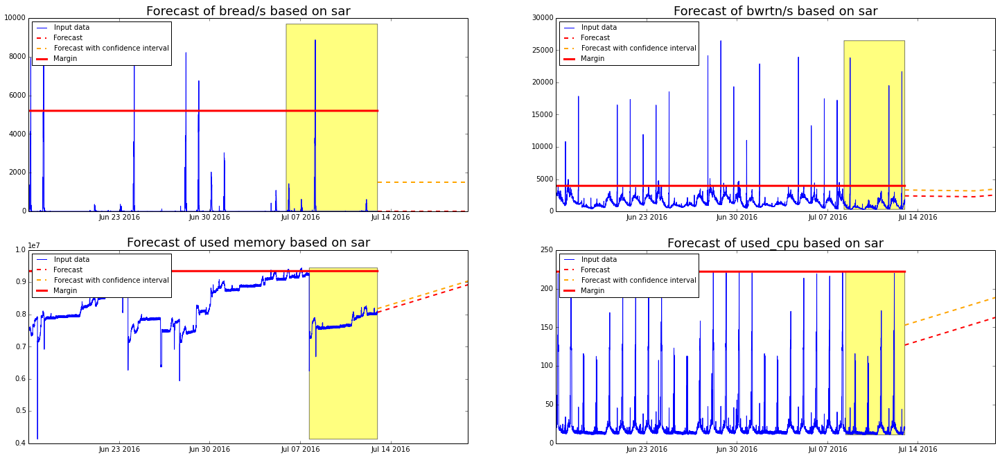

In [14]:
host='app101.eta.prod.ed1'
D=forecast_on_sar(host, user, start="2016-06-16 00:00:00 AM", plot_clust=False)

Plotting data for clusters

In [9]:
def get_resource_data(group_serv):
    D=pd.DataFrame()
    for G in data.Group.unique():
        if group_serv in G:
            print(G)
            df=pd.DataFrame()
            fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 5))
            ax0, ax1= axes.flat

            d=DFR_RAM[DFR_RAM.Group==G]
            #print(d)
            D=D.append(d)
            X, Y=d.shape
            ind = np.arange(X)
            width = 0.5
            #d=d[['server','Used', 'Available']]
            p1 = ax0.bar(ind, d.Used.values,  color='red', label='Used_memory_Gb')
            p2 = ax0.bar(ind, d.Available.values, color='green', bottom=d.Used.values, label='Available')
            ax0.set_xticks(range(d.shape[0]))
            ax0.set_xticklabels([str(x) for x in d.server.values], rotation=90)
            ax0.set_title(G+" Memory usage Gb")
            ax0.get_legend()
            ax0.set_xlabel("KB")
            df=df.append(pd.DataFrame({"Group":G, "Number":d.shape[0],"Resource":"Memory","Sum_used":d.Used.sum(),"Sum_capacity":d.Capacity.sum() }, index=['RAM']))


            d=DFR_CPU[DFR_CPU.Group==G]
            D=D.append(d)
            X, Y=d.shape
            ind = np.arange(X)
            width = 0.5
            #d=d[['server','Used', 'Available']]
            d['Used']=np.float16(d['Used'].str.replace(" %", ""))
            p1 = ax1.bar(ind, d.Used.values,  color='red', label='Used_CPU_%')
            p2 = ax1.bar(ind, d.Available.values, color='green', bottom=d.Used.values, label='Available')
            ax1.set_xticks(range(d.shape[0]))
            ax1.set_xticklabels([str(x) for x in d.server.values], rotation=90)
            ax1.set_title(G+" CPU usage %")
            ax1.set_xlabel("%")

            #fig.text(G)
            fig.set_label(G)
            fig.show

            df=df.append(pd.DataFrame({"Group":G, "Number":d.shape[0], "Resource":"CPU","Sum_used":d.Used.sum(),"Sum_capacity":100*d.Capacity.sum() }, index=['CPU']), ignore_index=True)
            display(df)
            print("Summary CPU ")
            print("Used "+str(d.Used.sum()/d.Capacity.sum())+" %")
            print("Summary RAM ")
            print("Used "+str(100*np.float16(df['Sum_used'][df.Resource=='Memory'].values/df.Sum_capacity[df.Resource=='Memory'].values)[0])+" %")
    return D

In [10]:
data=pd.read_csv(source_path+"SG5_hosts.csv")
data1=pd.read_csv(source_path+"POD16_2hosts.csv")
data.columns=['Group','server']
data1.columns=['Group','server']
data=data.append(data1)
data=data.reset_index()
data=data[['Group', 'server']]
gr=""
for i in data.index:
    if type(data['Group'].values[i])==float and np.isnan(data['Group'].values[i]):
        data['Group'][i]=gr
    else:
        gr=data['Group'][i]
data.columns=['group','server']



Analyse the data online

be101.pc.prod.ed1
Len of unique data less than number of clusters


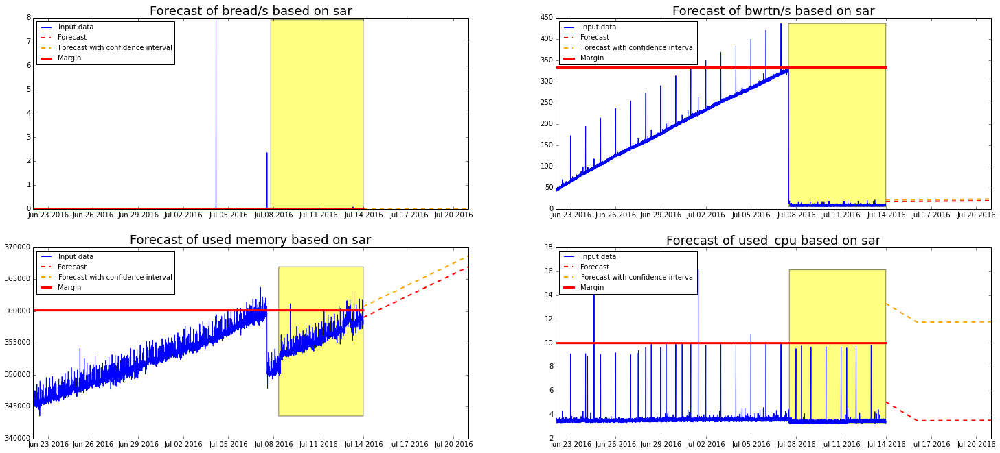

be102.pc.prod.ed1
Len of unique data less than number of clusters


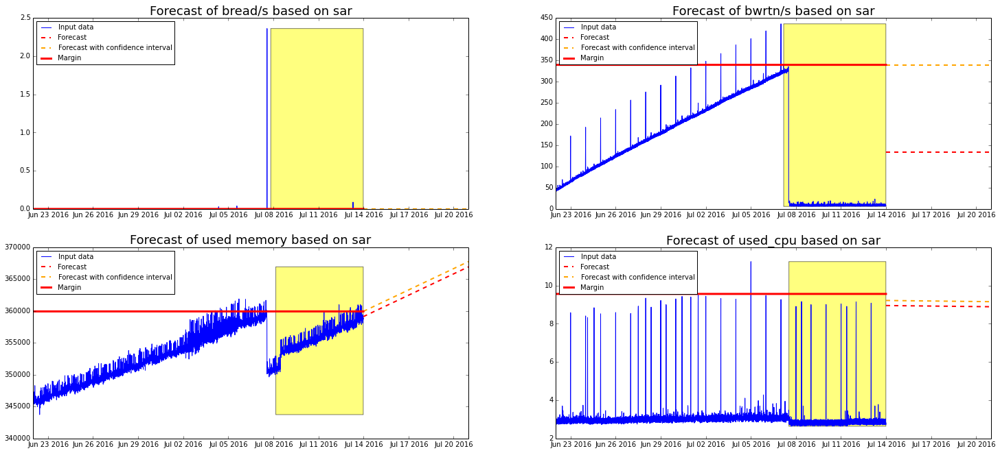

db101.pc.prod.ed1
Len of unique data less than number of clusters


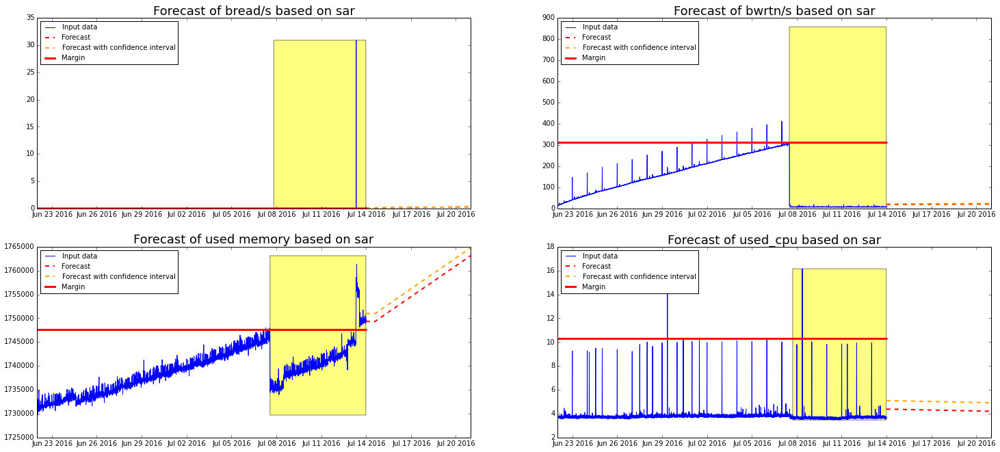

db102.pc.prod.ed1
Len of unique data less than number of clusters


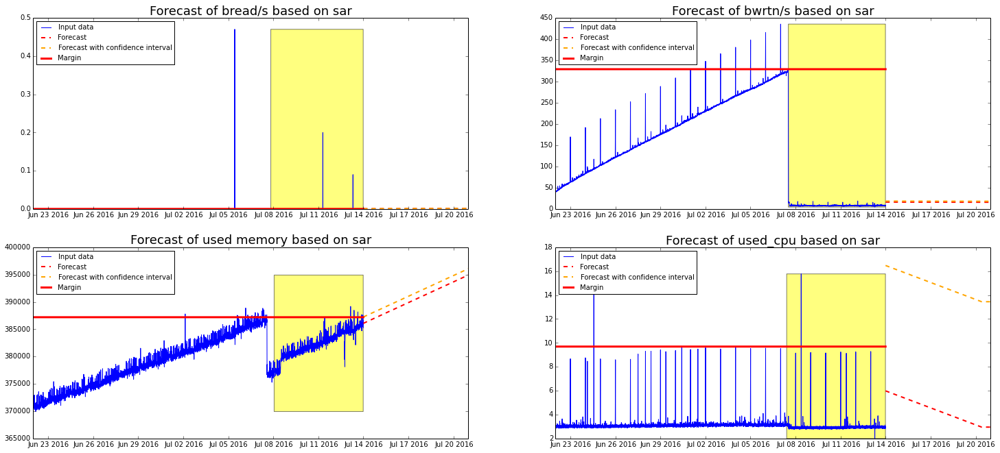

fe101.pc.prod.ed1
Len of unique data less than number of clusters


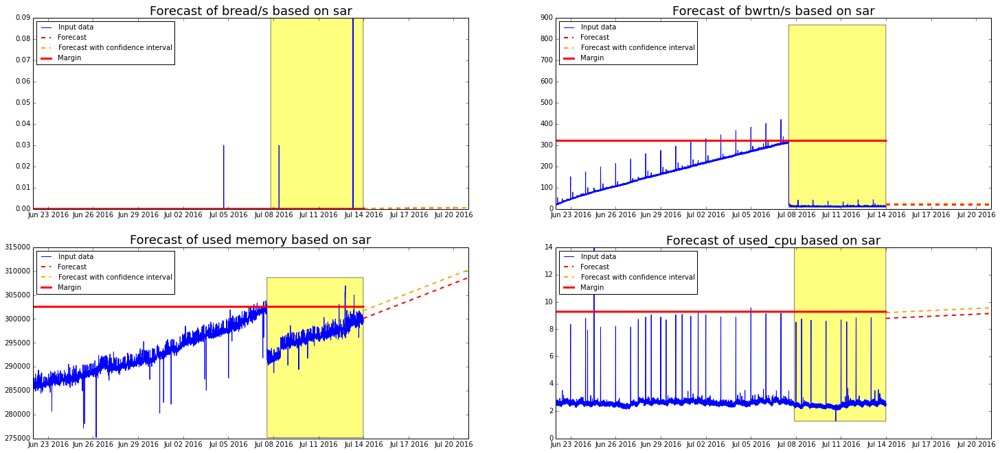

fe102.pc.prod.ed1
Len of unique data less than number of clusters


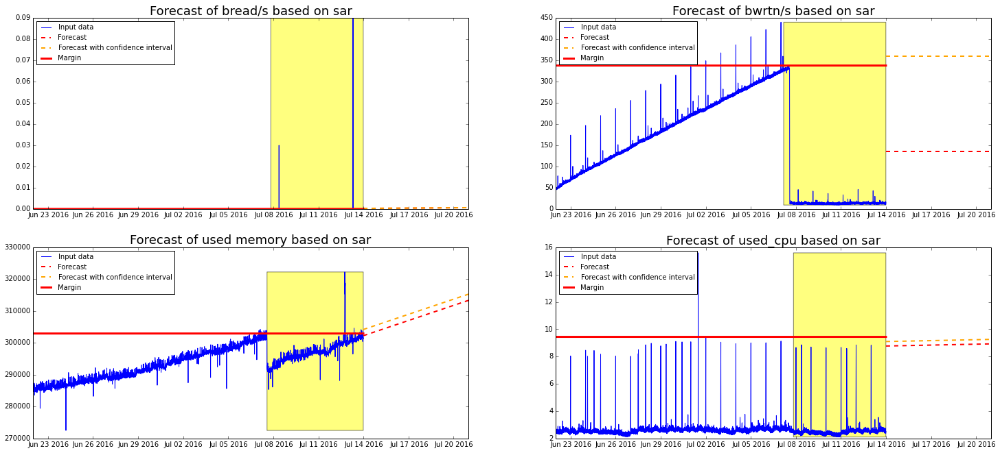

red004.lp.prod.ed1


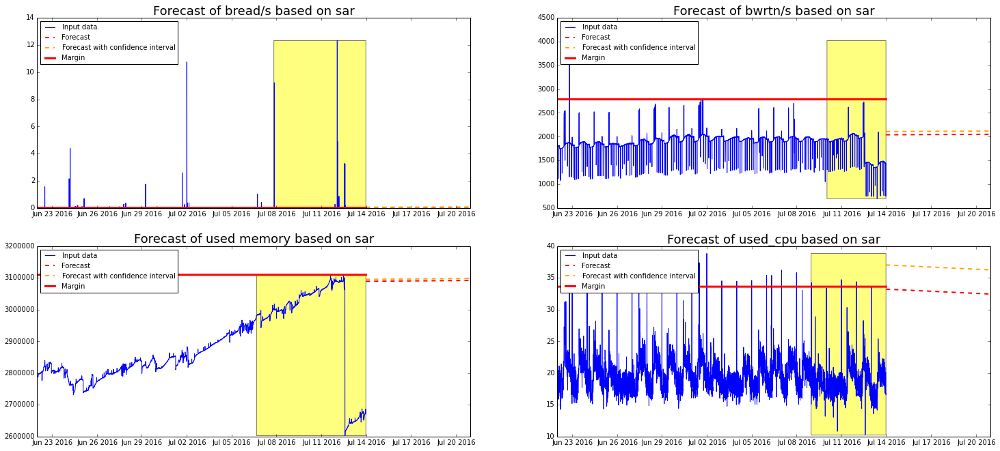

red005.lp.prod.ed1
Len of unique data less than number of clusters


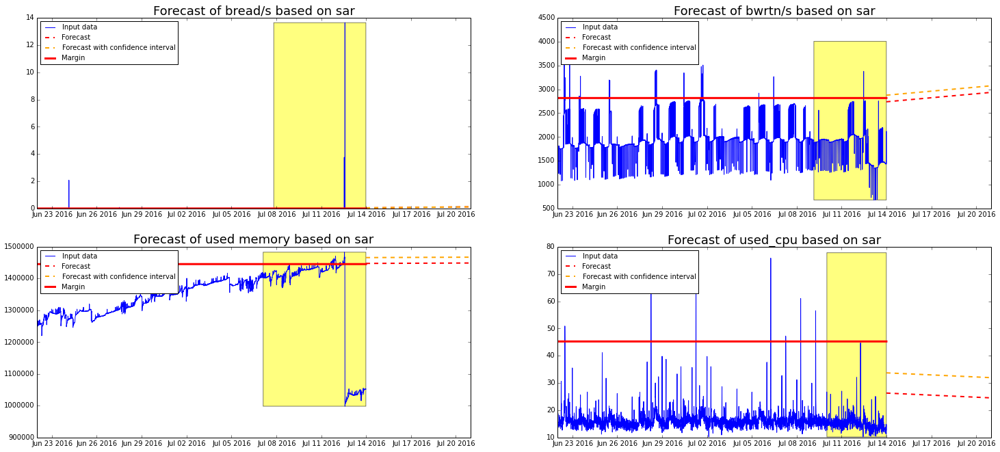

red006.lp.prod.ed1


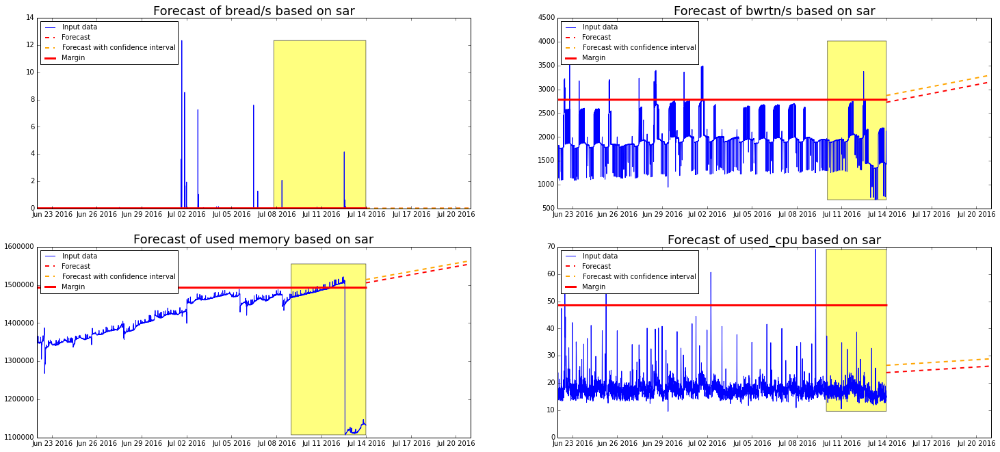

red002.lp.prod.ed1
red003.lp.prod.ed1
Len of unique data less than number of clusters


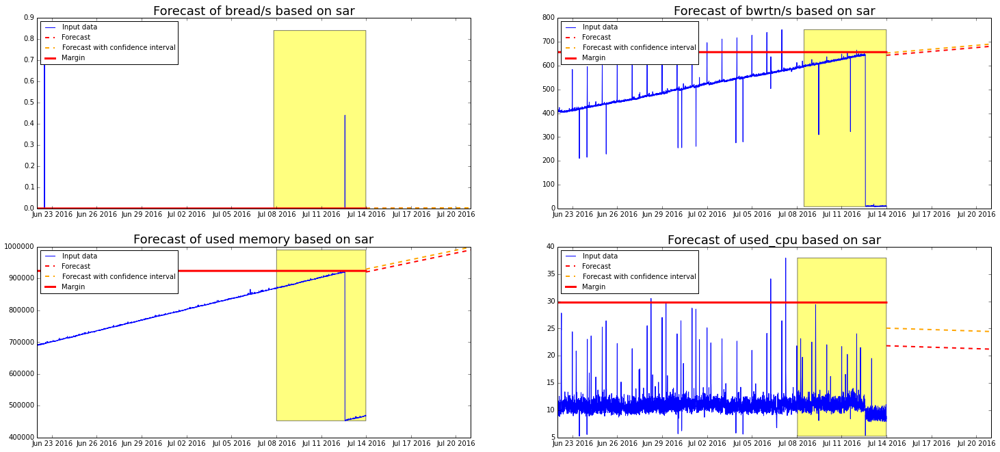

web001.lp.prod.ed1


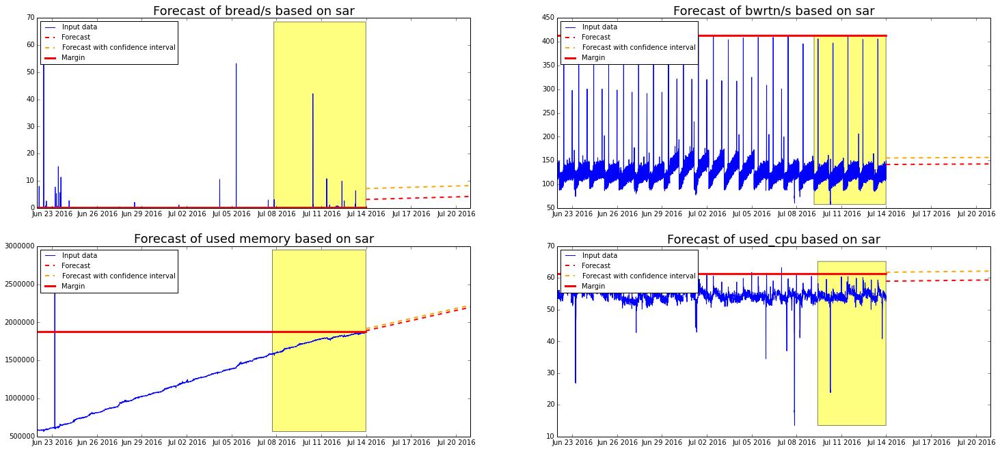

web002.lp.prod.ed1


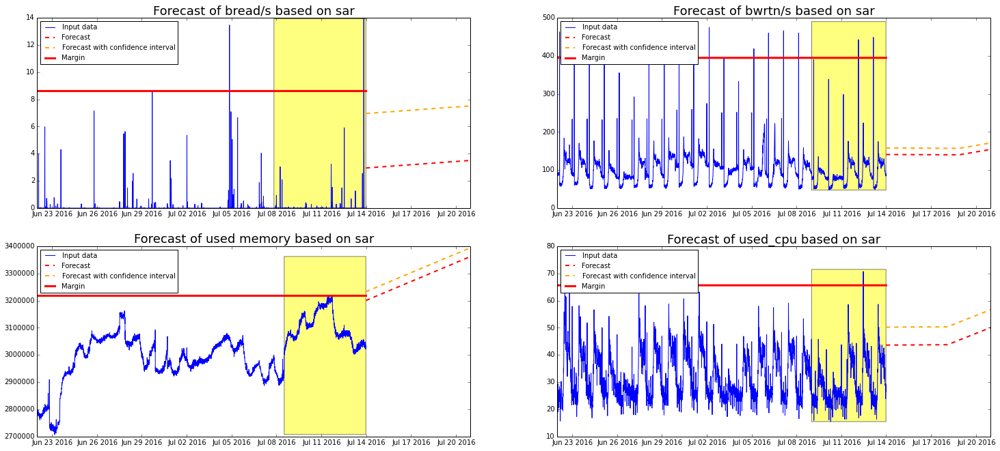

web003.lp.prod.ed1


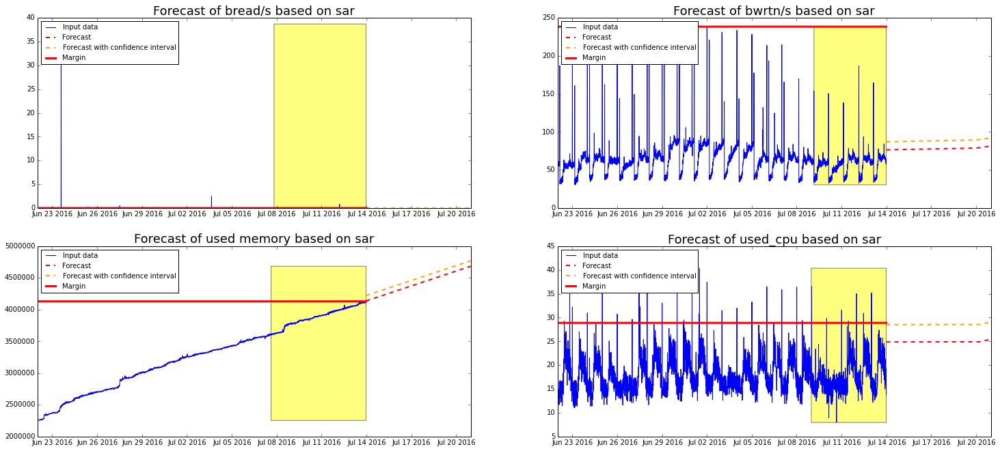

web004.lp.prod.ed1


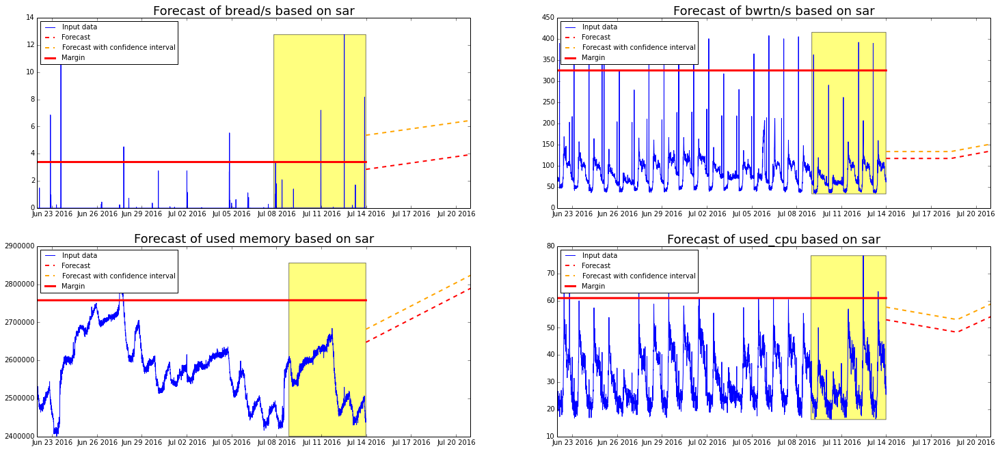

web005.lp.prod.ed1


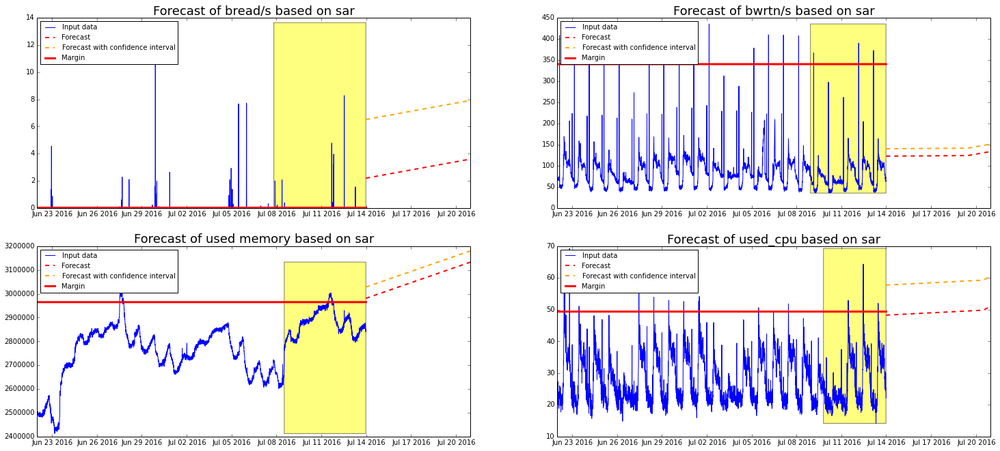

fe001.sc.prod.ed1
fe002.sc.prod.ed1
fe003.sc.prod.ed1
fe004.sc.prod.ed1
fe005.sc.prod.ed1
fe006.sc.prod.ed1
fe007.sc.prod.ed1
fe008.sc.prod.ed1
red101.sc.prod.ed1
Len of unique data less than number of clusters


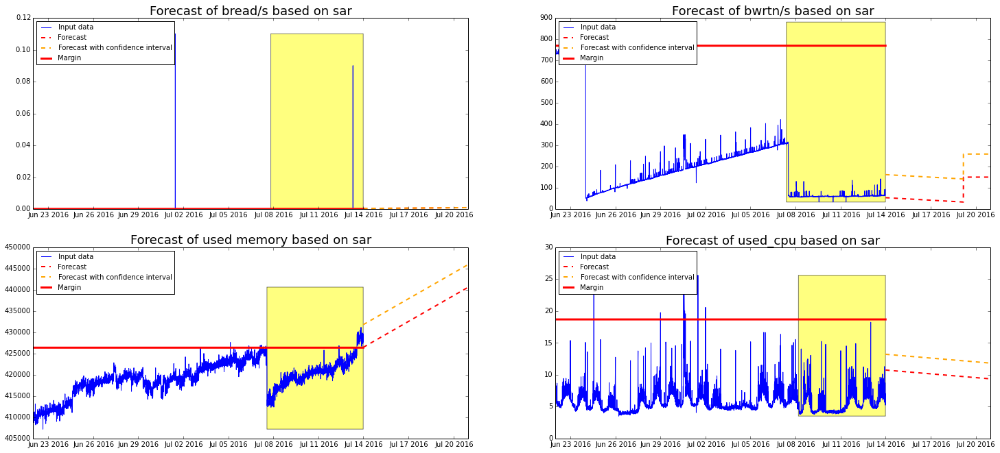

red102.sc.prod.ed1
Len of unique data less than number of clusters


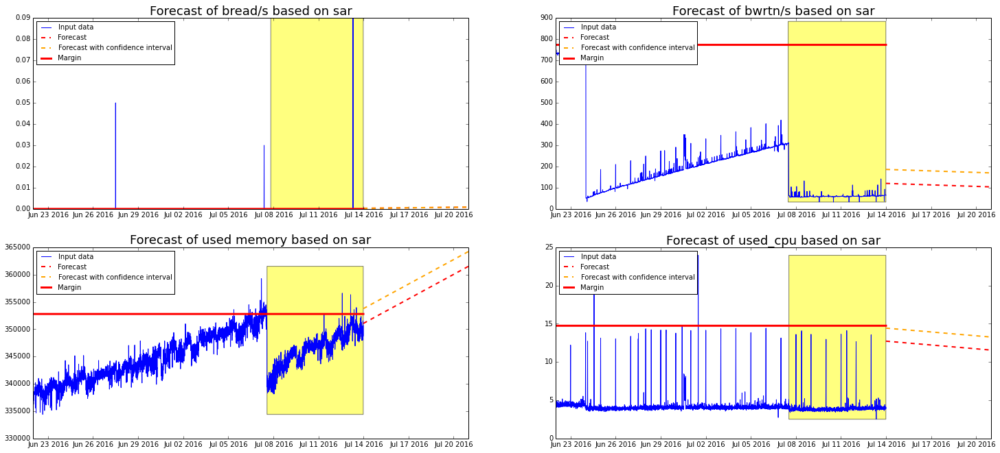

red103.sc.prod.ed1
Len of unique data less than number of clusters


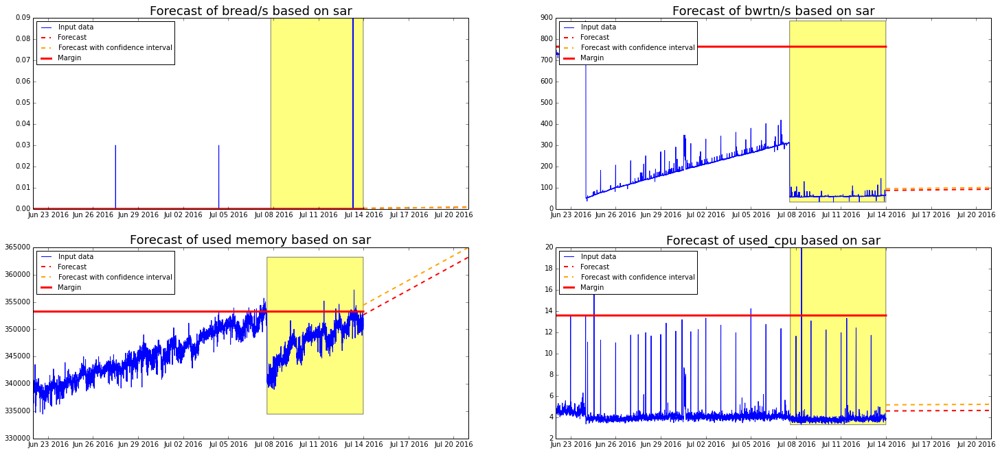

be101.fsa.prod.ed1
Len of unique data less than number of clusters


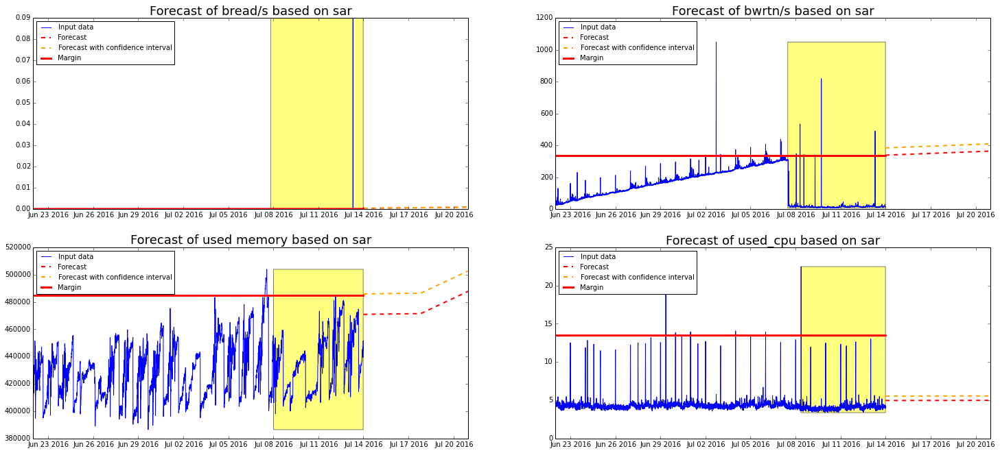

be102.fsa.prod.ed1
Len of unique data less than number of clusters


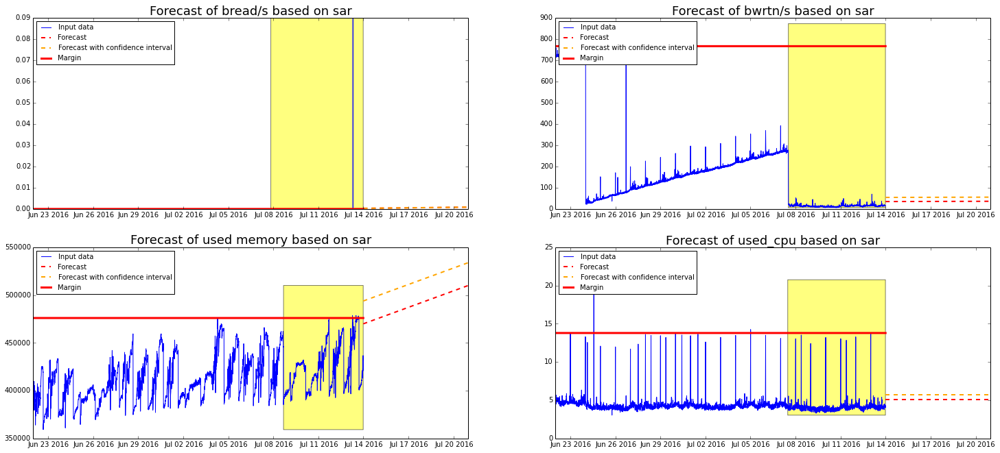

be103.fsa.prod.ed1
Len of unique data less than number of clusters


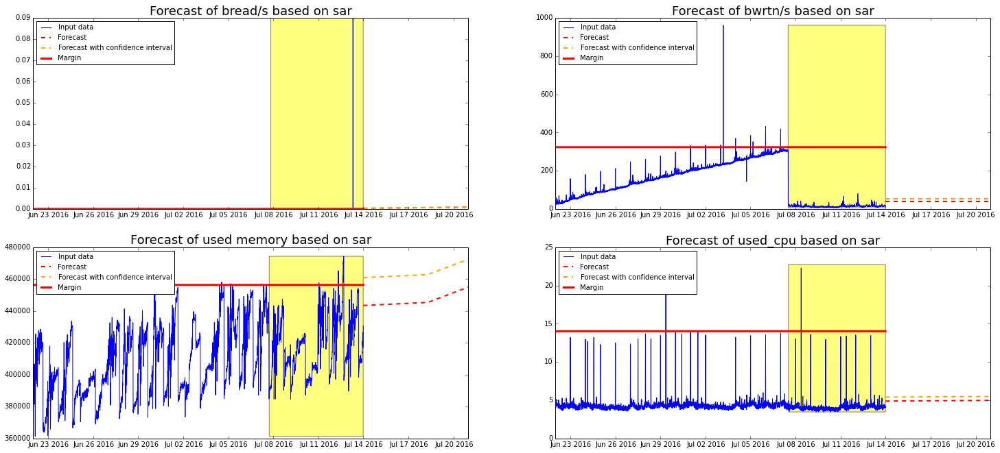

be104.fsa.prod.ed1
Len of unique data less than number of clusters


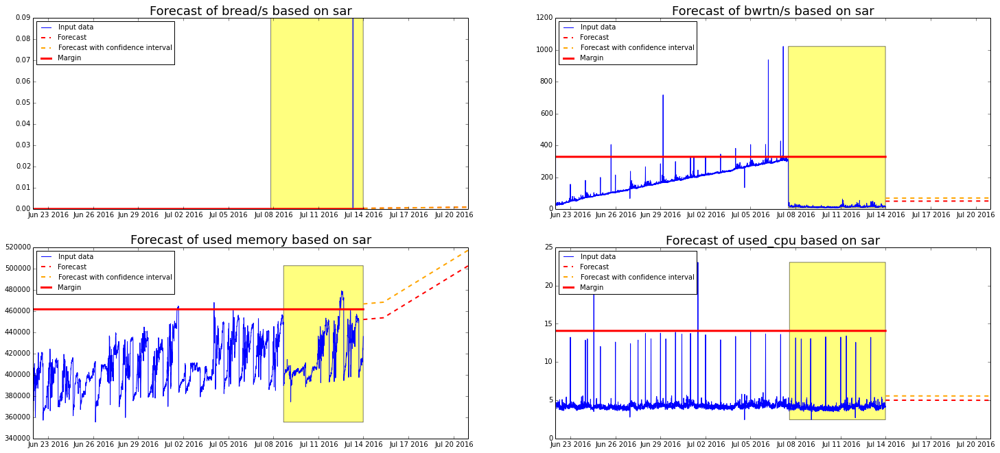

be101.rgt.prod.ed1


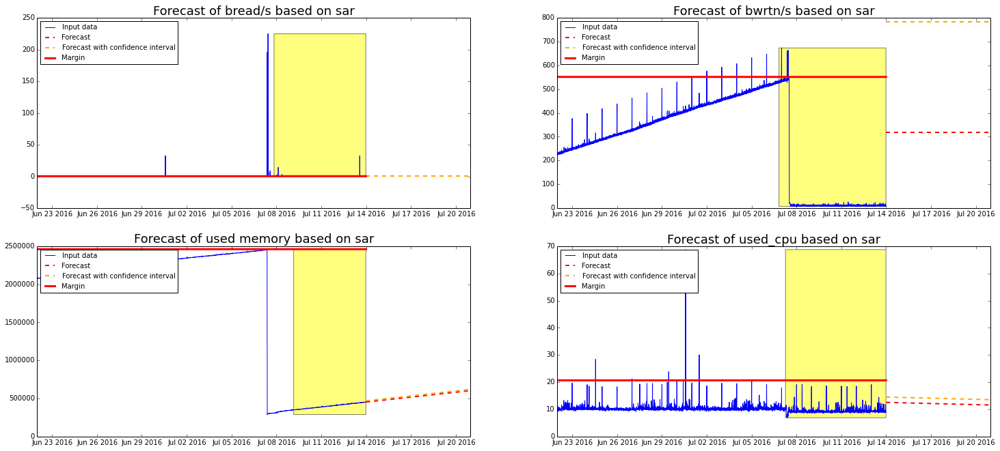

be102.rgt.prod.ed1
Len of unique data less than number of clusters


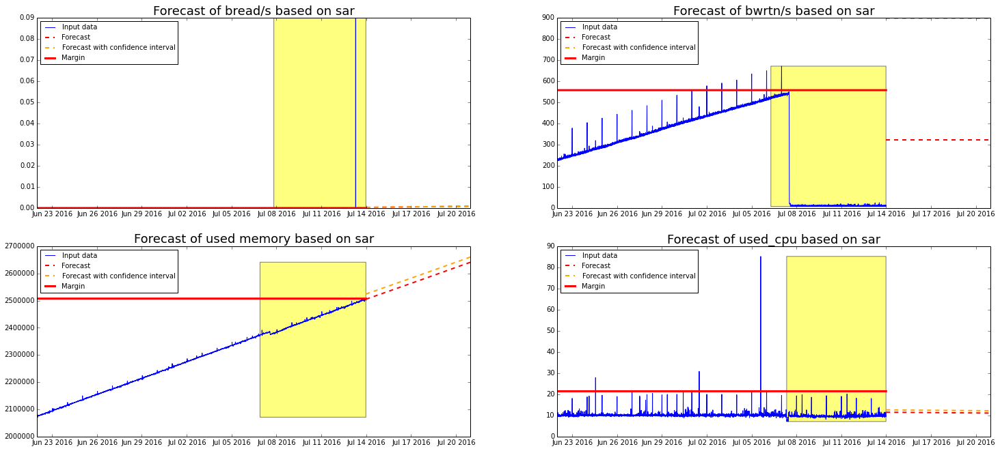

be103.rgt.prod.ed1
Len of unique data less than number of clusters


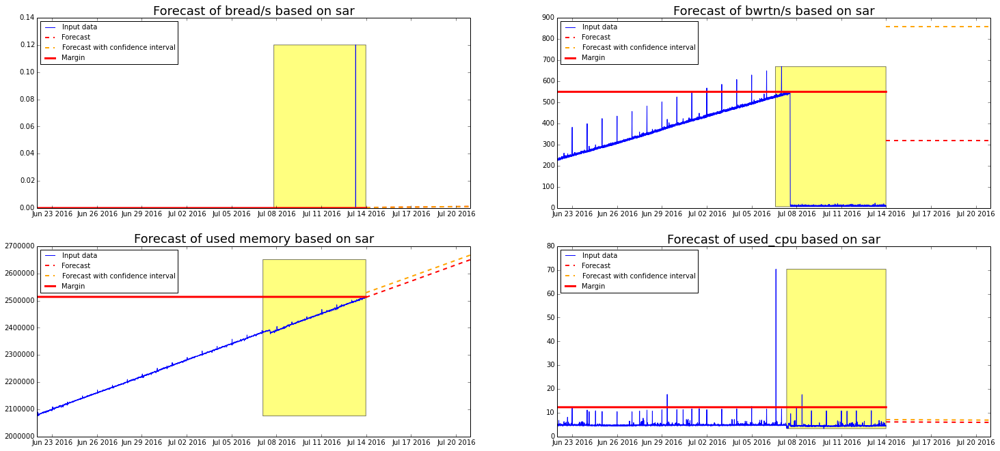

be104.rgt.prod.ed1
Len of unique data less than number of clusters


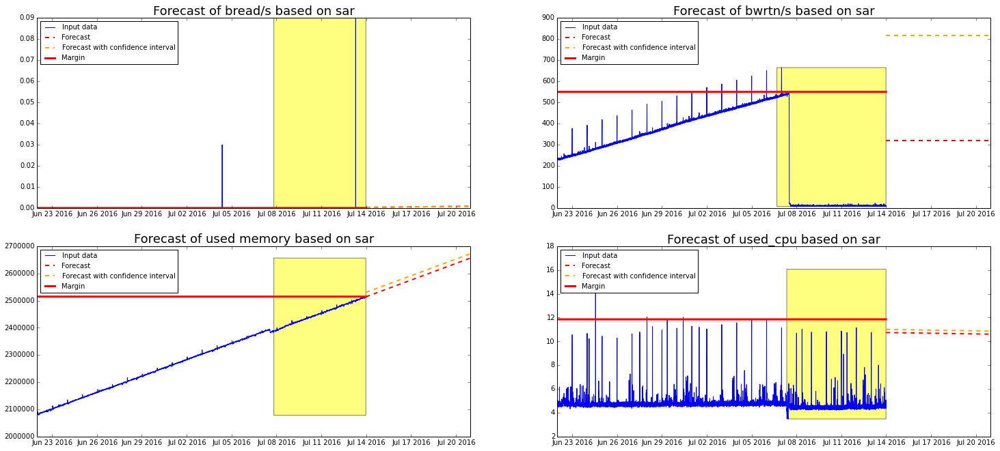

be105.rgt.prod.ed1
Len of unique data less than number of clusters


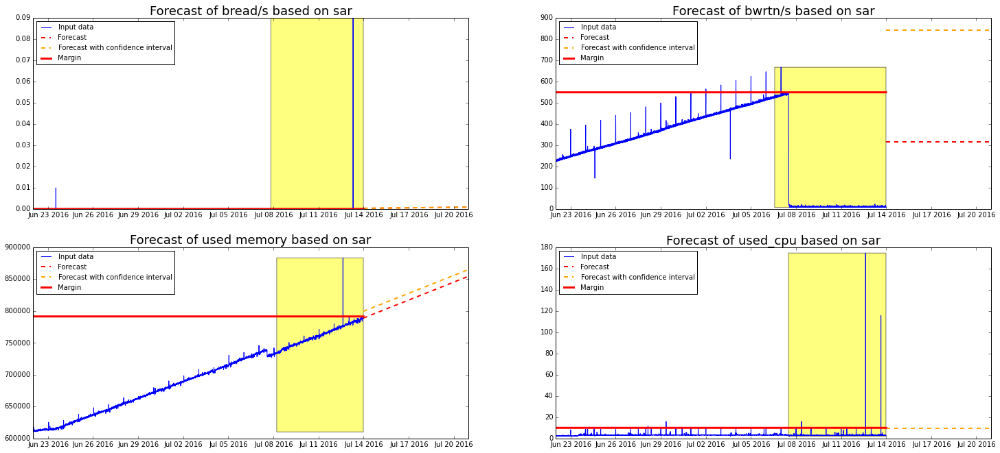

be106.rgt.prod.ed1
Len of unique data less than number of clusters


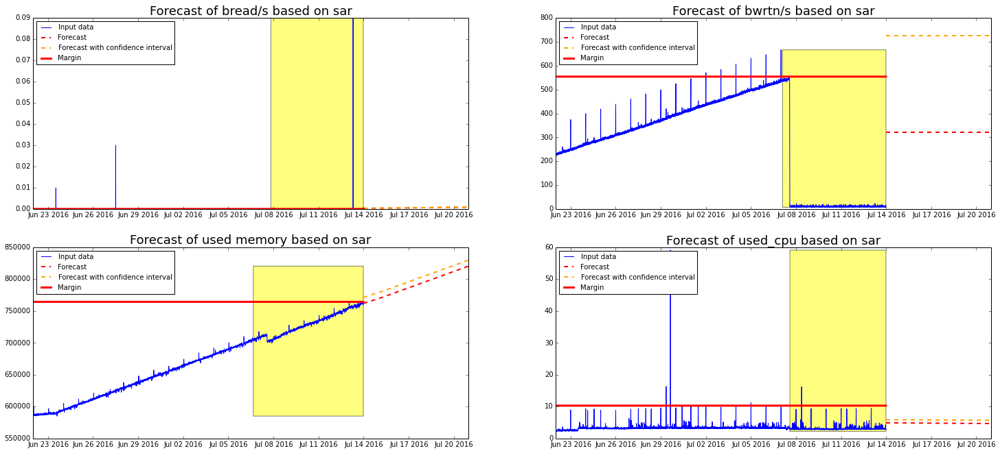

be107.rgt.prod.ed1
Len of unique data less than number of clusters


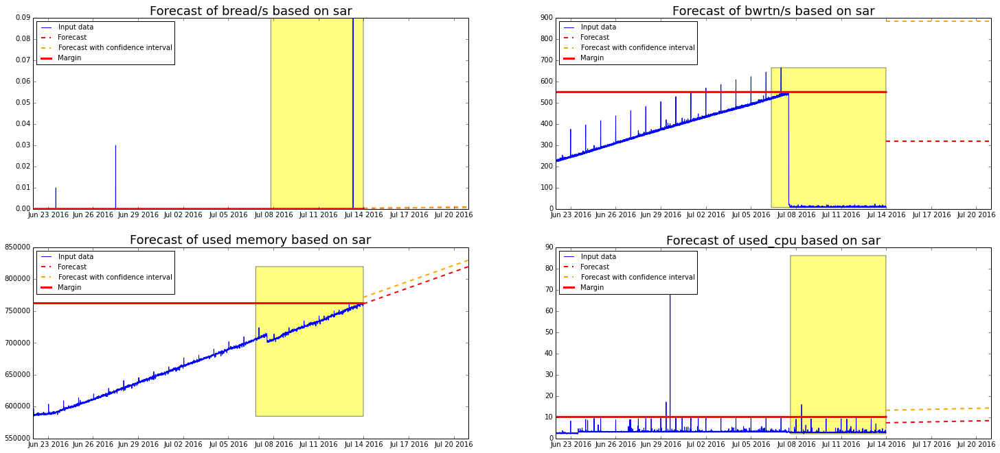

be108.rgt.prod.ed1
Len of unique data less than number of clusters


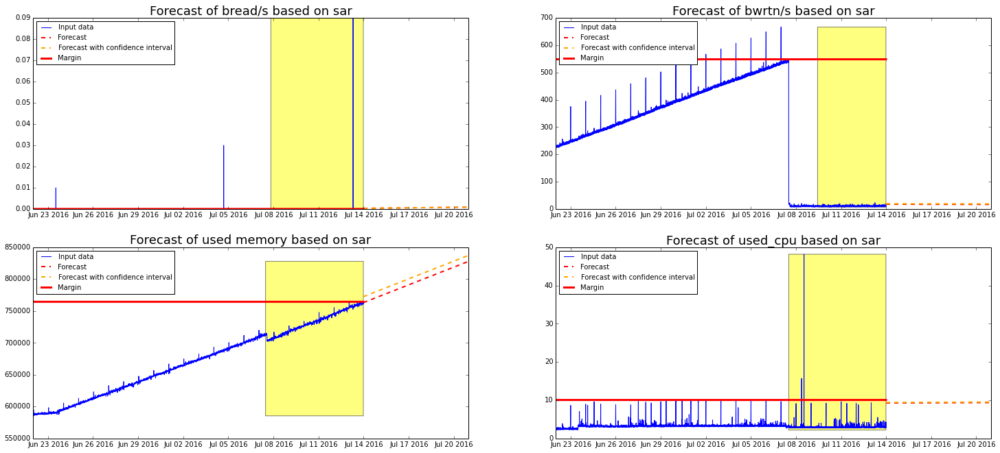

ha101.rgt.prod.ed1
Len of unique data less than number of clusters


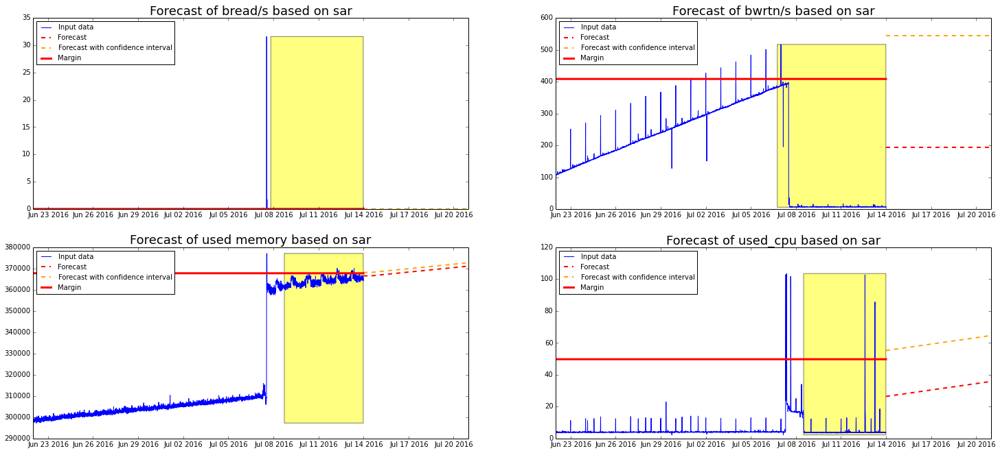

ha102.rgt.prod.ed1


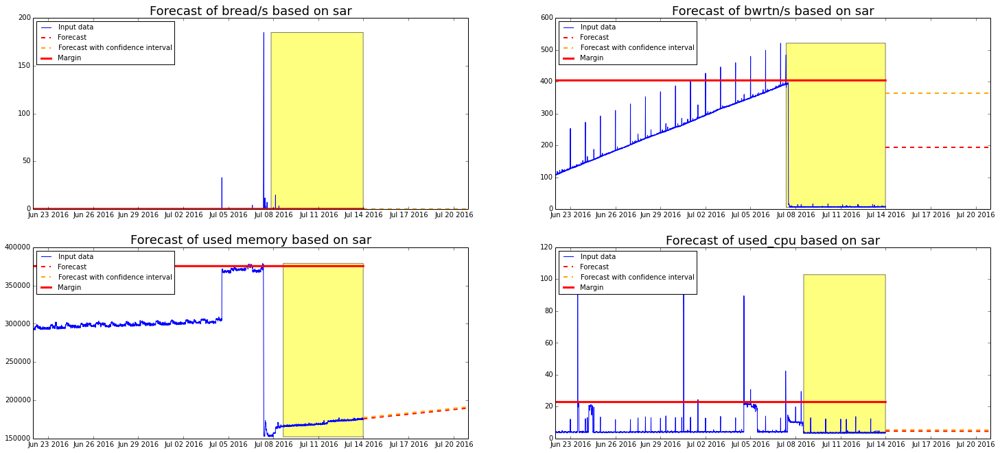

be101.sl.prod.ed1


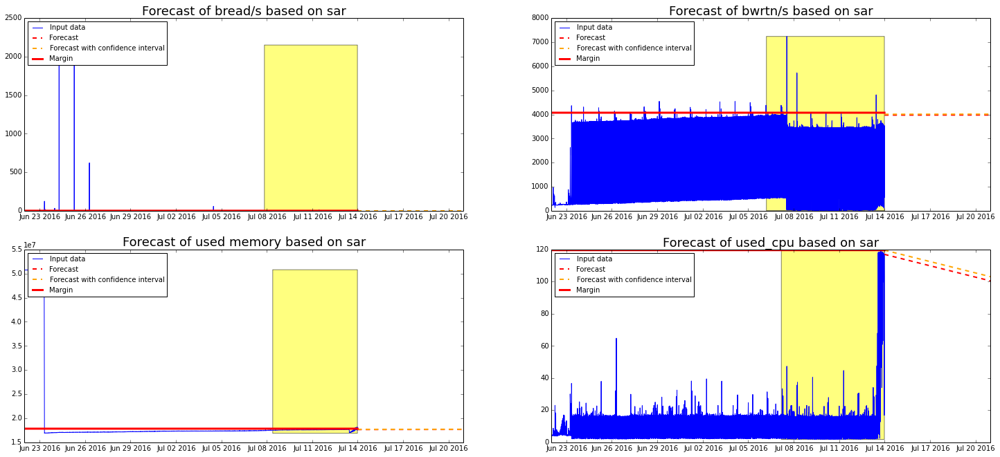

be102.sl.prod.ed1


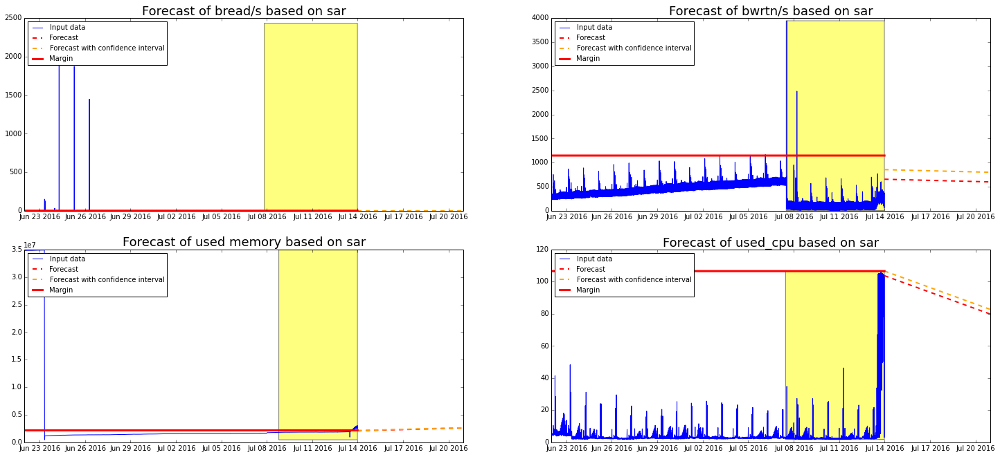

be103.sl.prod.ed1


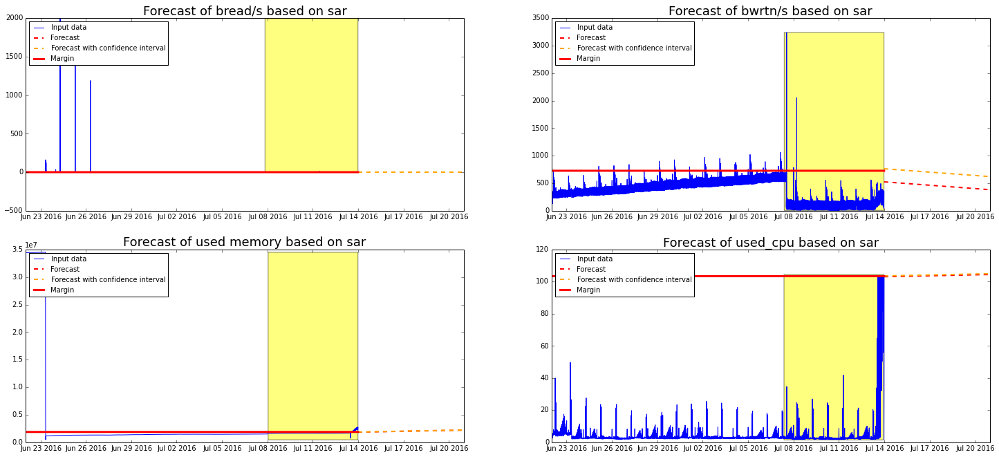

be101.sl.prod.ed2


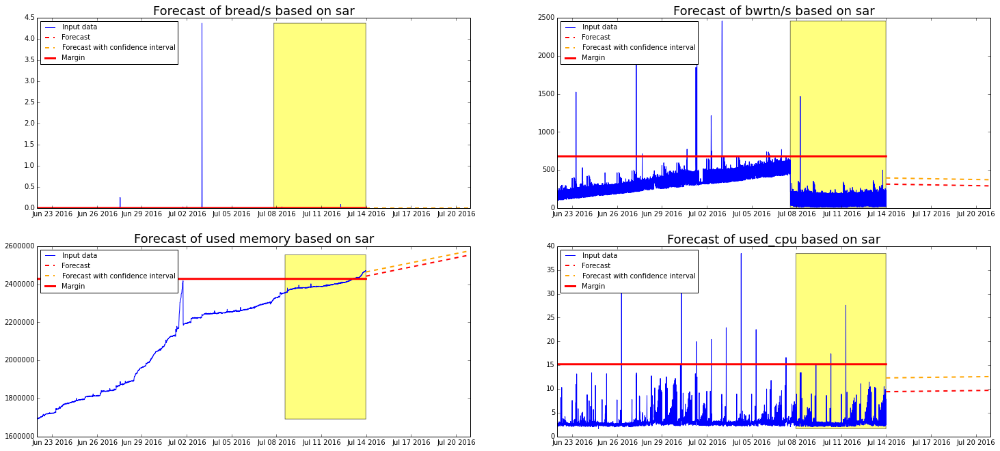

be102.sl.prod.ed2
Len of unique data less than number of clusters


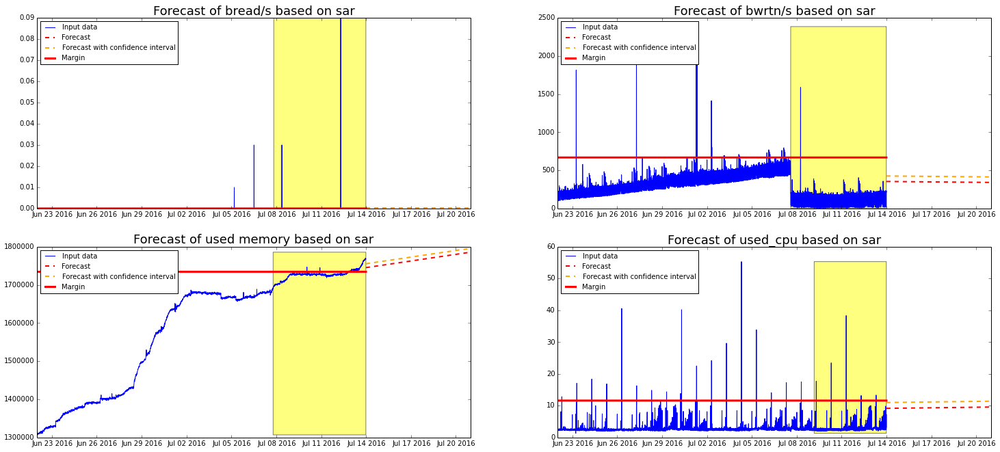

be103.sl.prod.ed2


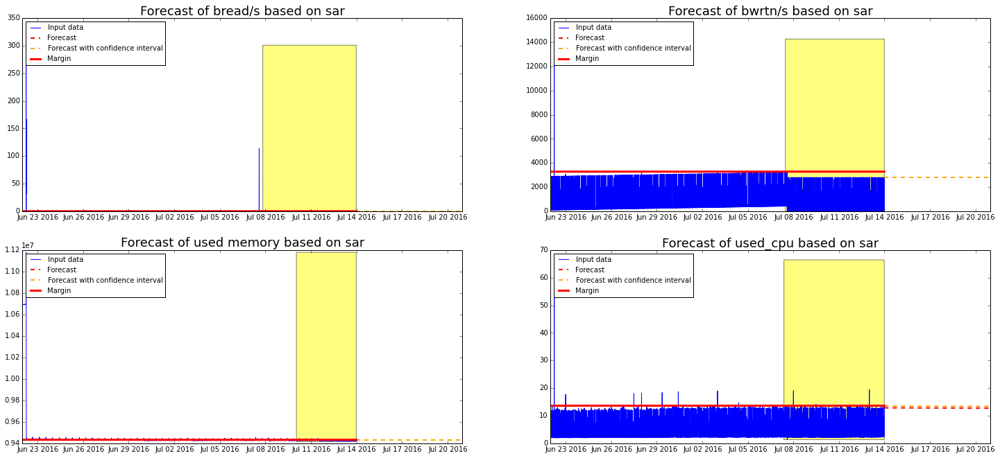

be101.sl.prod.ed5


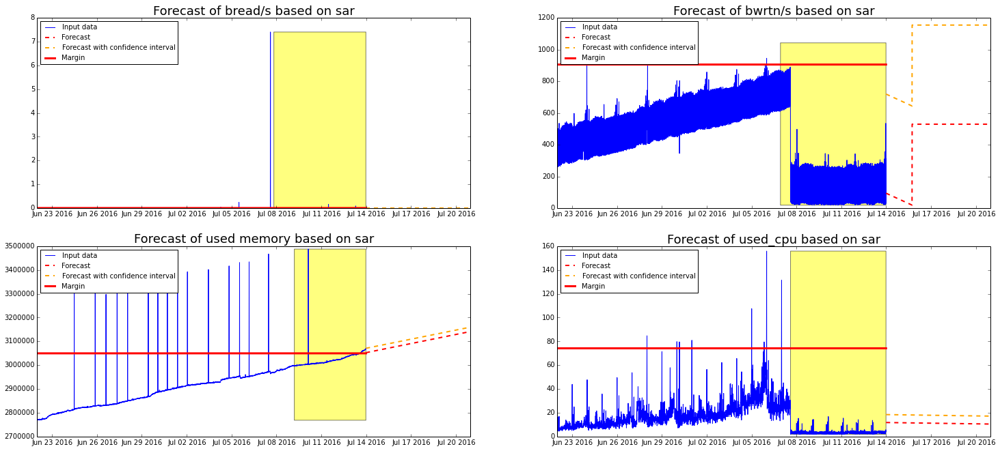

be102.sl.prod.ed5


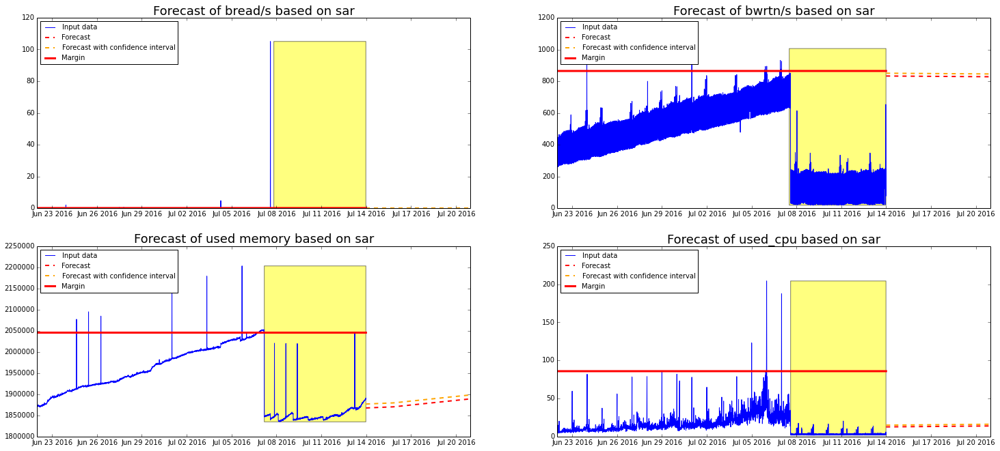

be103.sl.prod.ed5


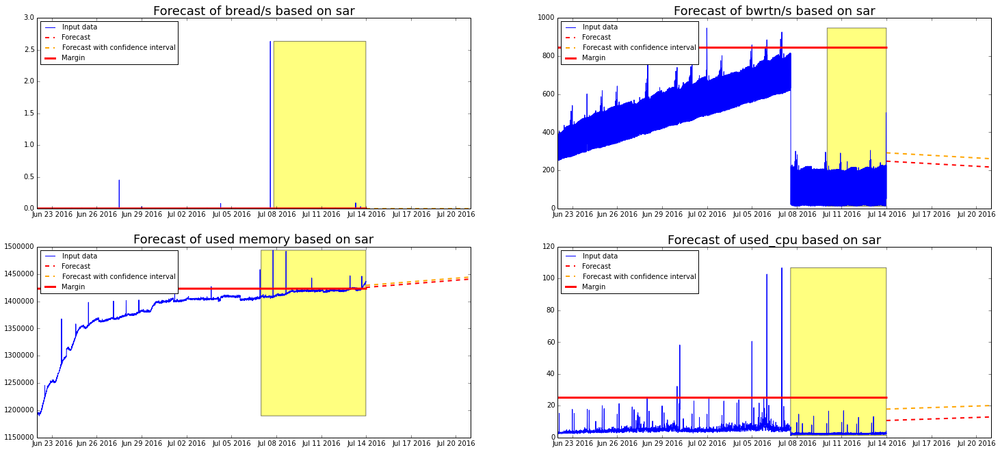

db101.sl.prod.ed1


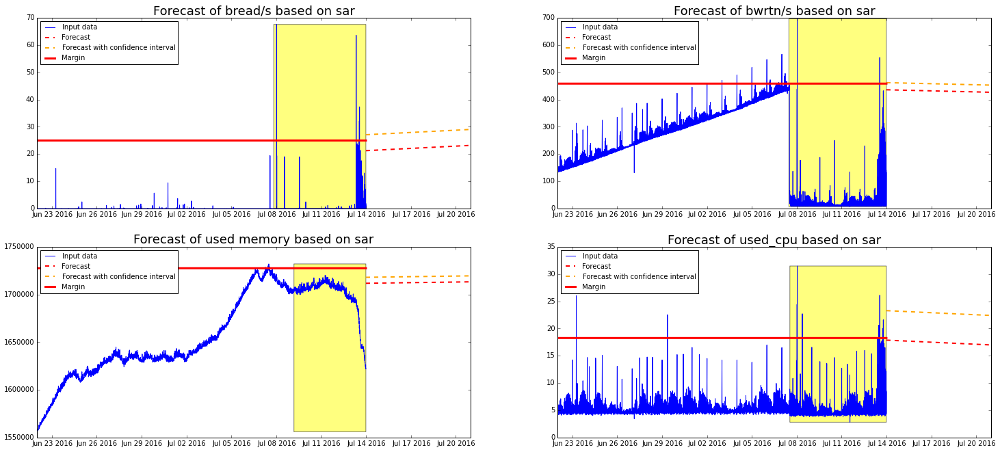

db102.sl.prod.ed1


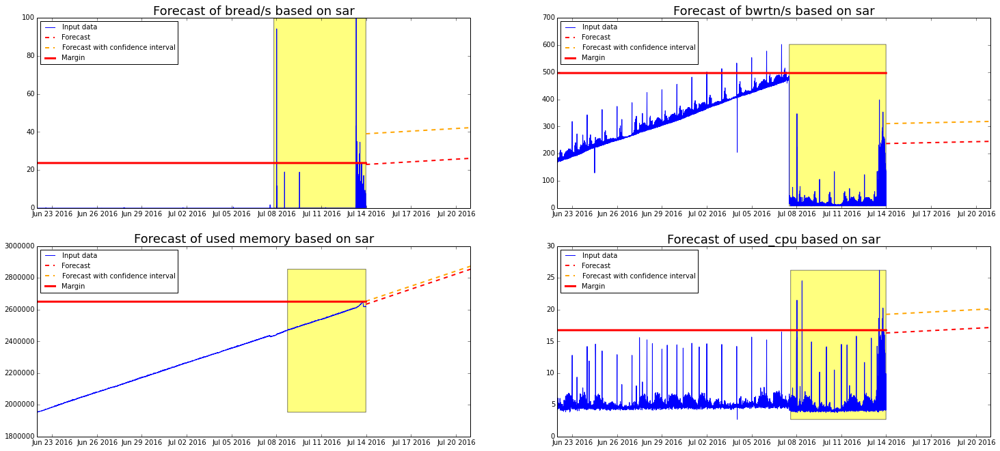

db101.sl.prod.ed2


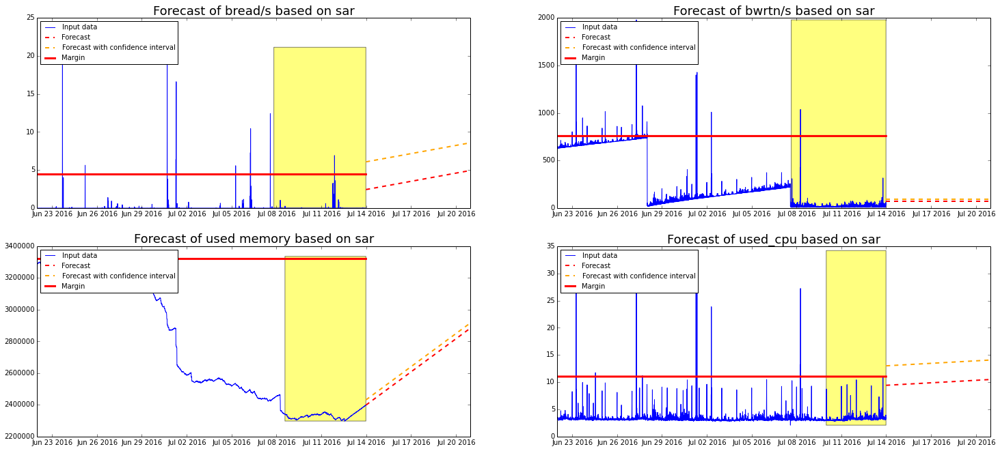

db102.sl.prod.ed2


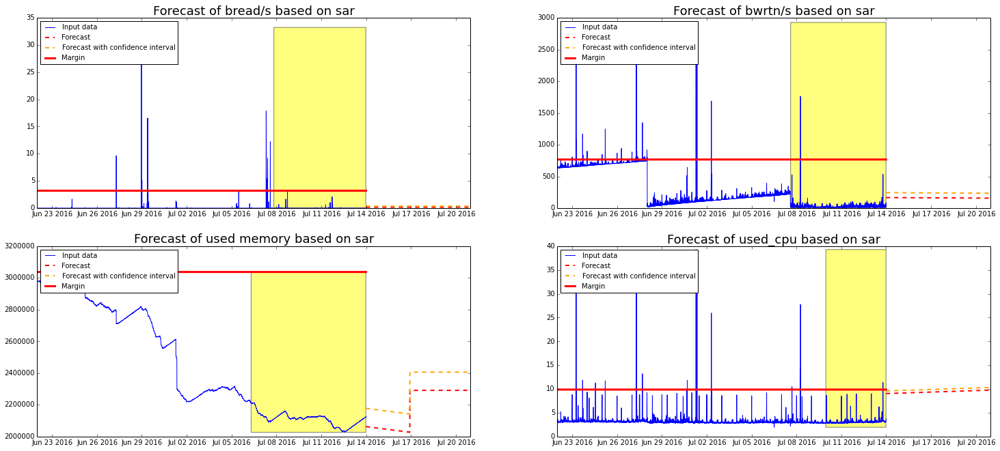

db101.sl.prod.ed5


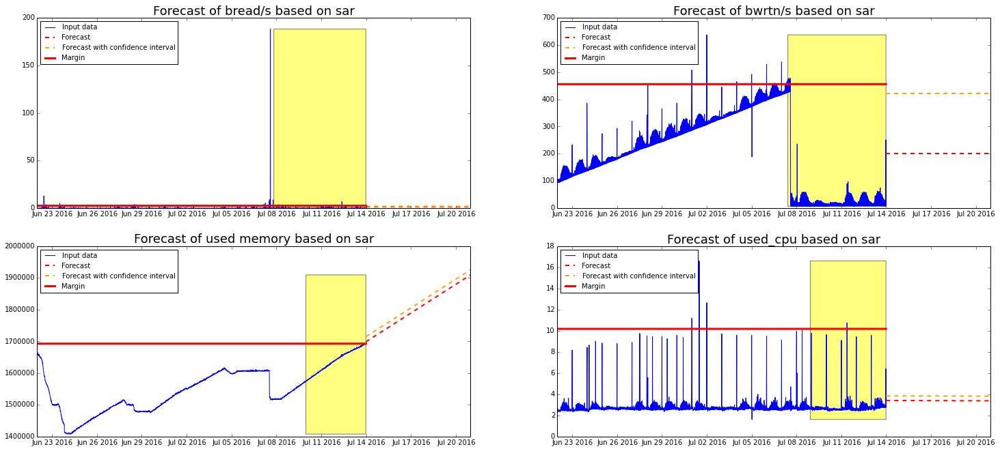

db102.sl.prod.ed5


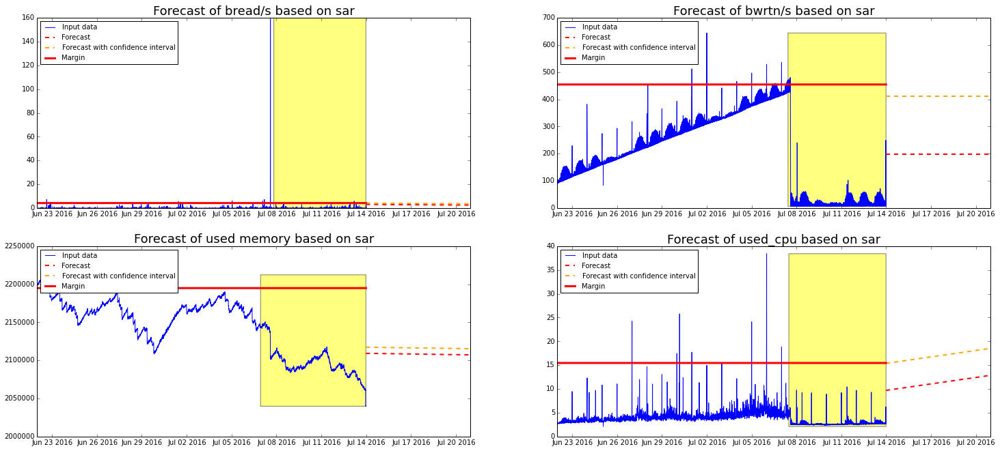

web001.api.prod.ed1


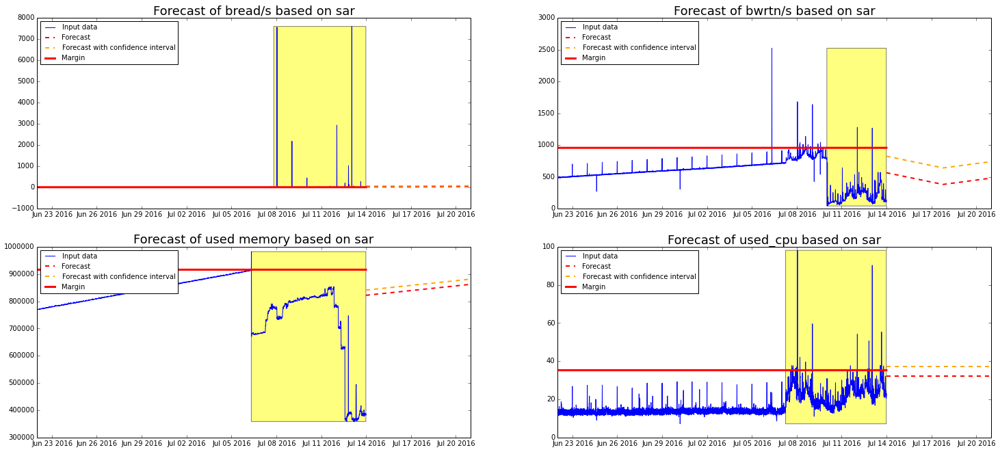

web002.api.prod.ed1


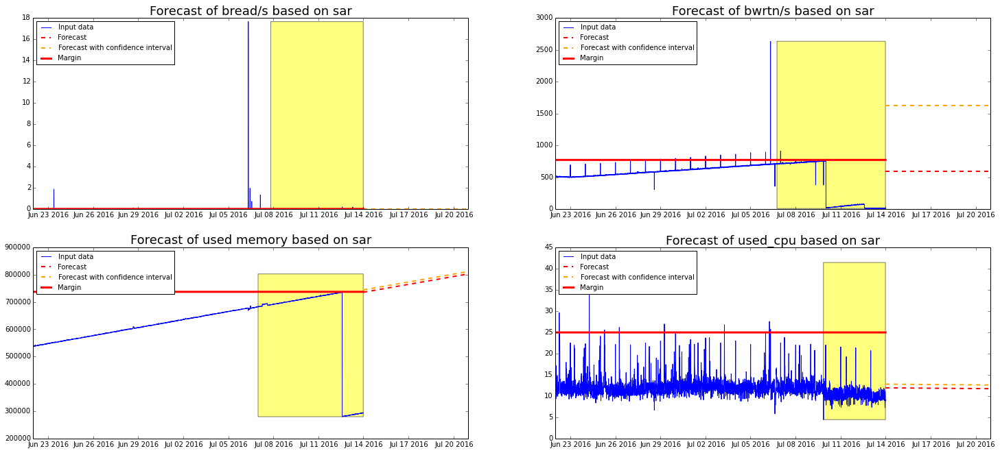

web003.api.prod.ed1


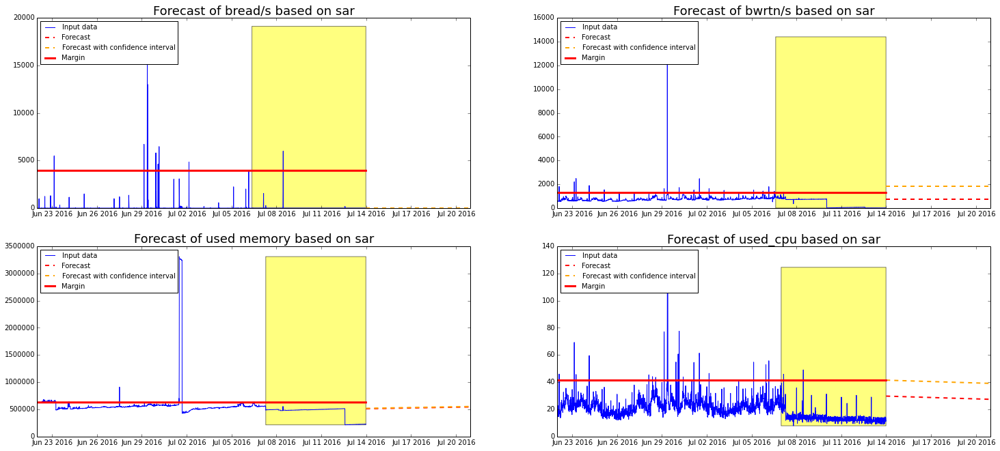

web004.api.prod.ed1


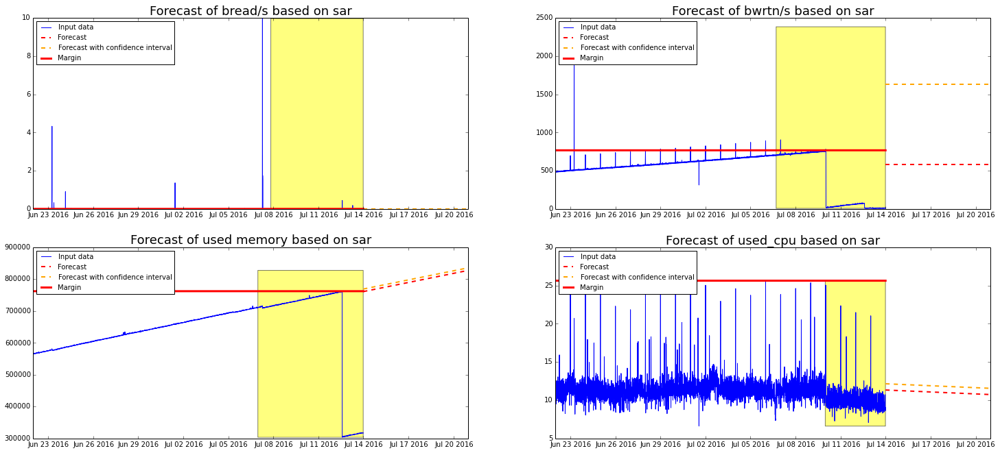

web101.api.prod.ed2
Len of unique data less than number of clusters


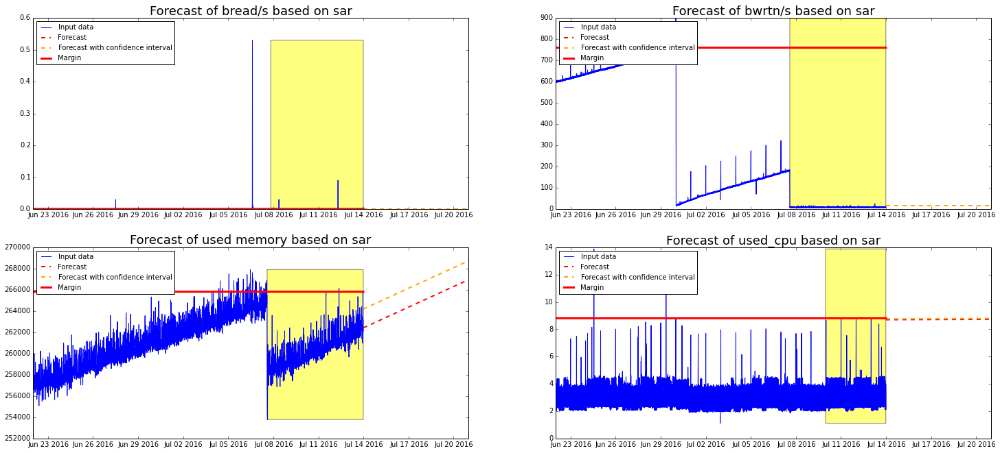

web102.api.prod.ed2
Len of unique data less than number of clusters


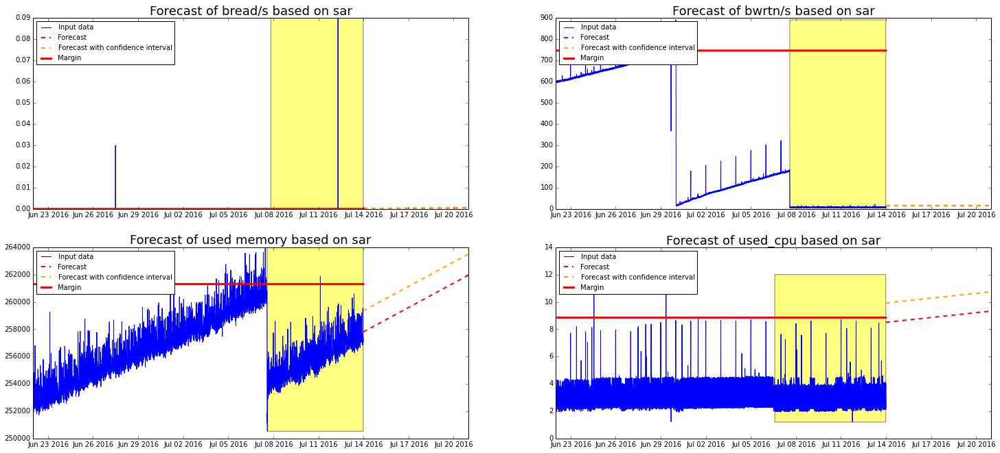

web101.api.prod.ed5


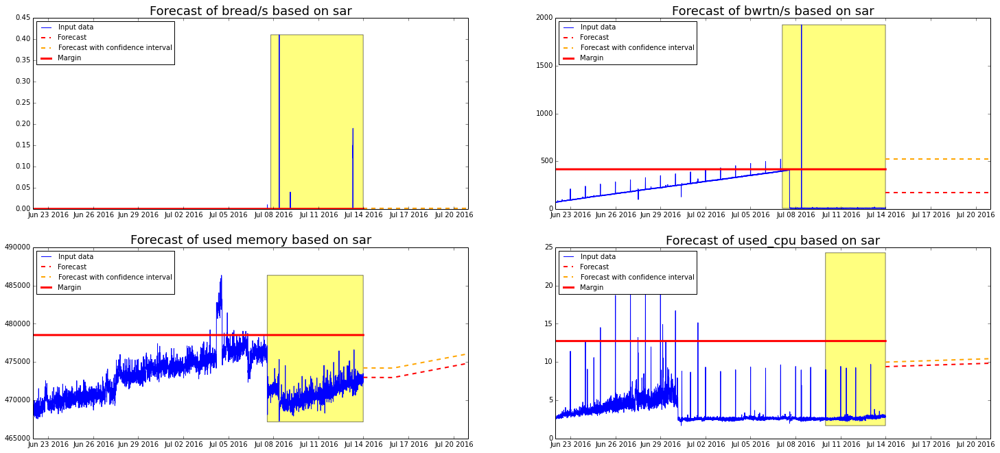

web102.api.prod.ed5


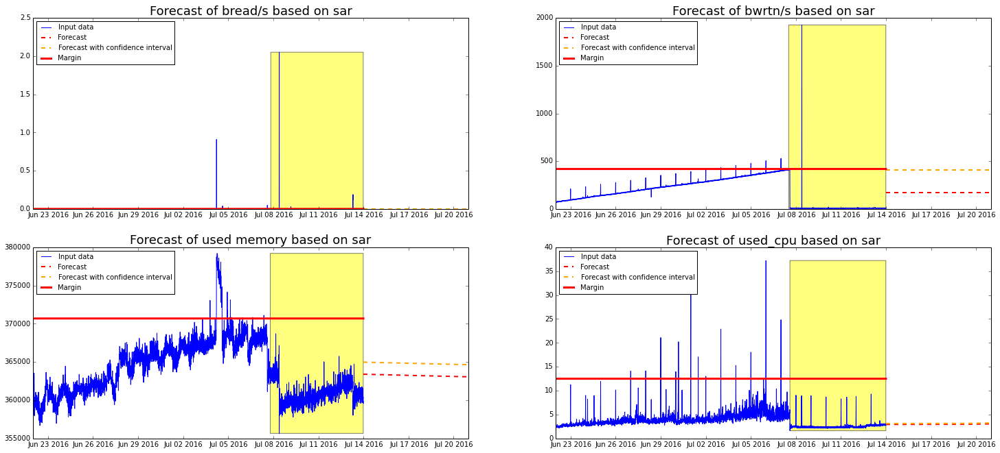

web103.api.prod.ed5


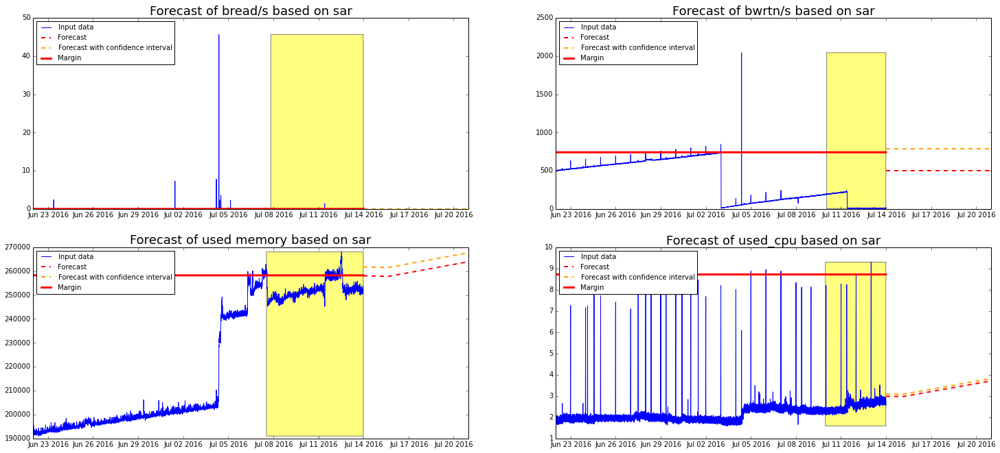

web104.api.prod.ed5


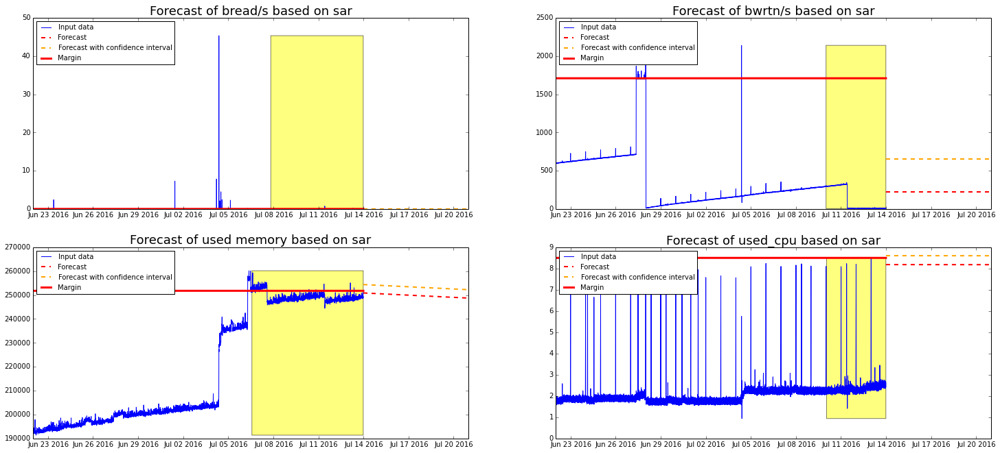

app101.eta.prod.ed1


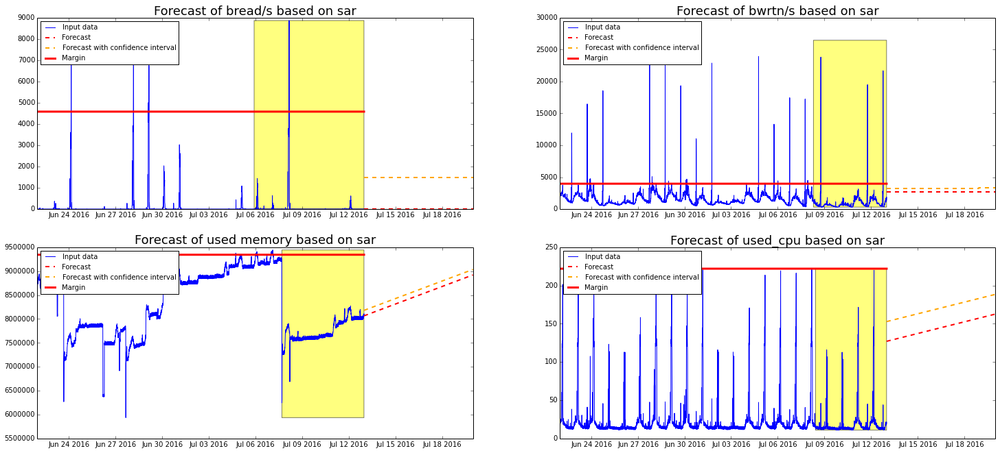

app102.eta.prod.ed1


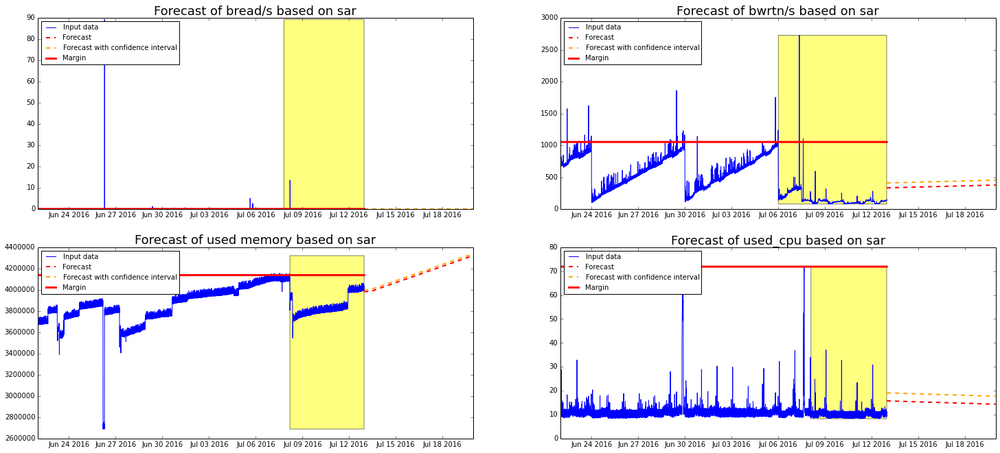

app103.eta.prod.ed1


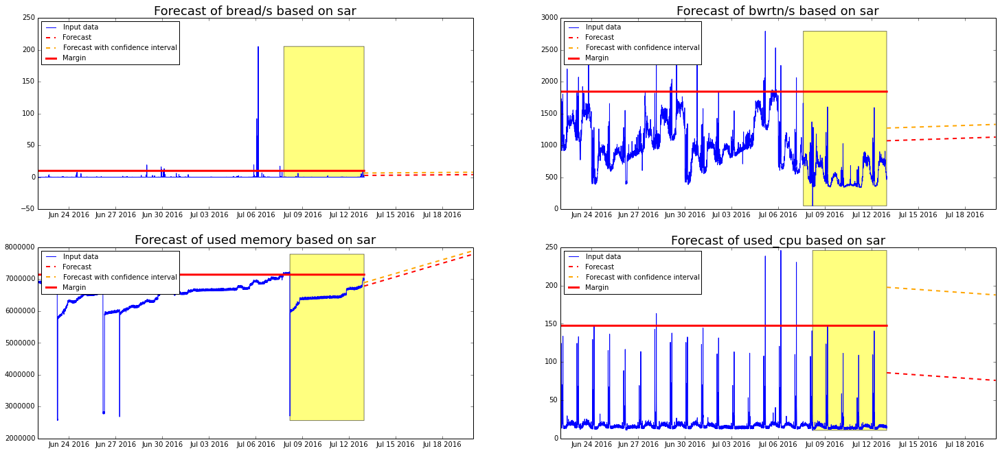

app104.eta.prod.ed1
Len of unique data less than number of clusters


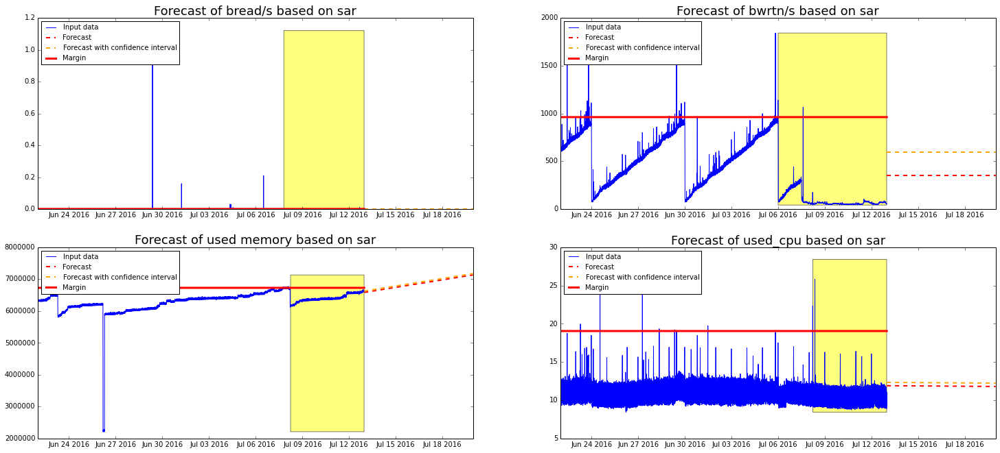

app105.eta.prod.ed1


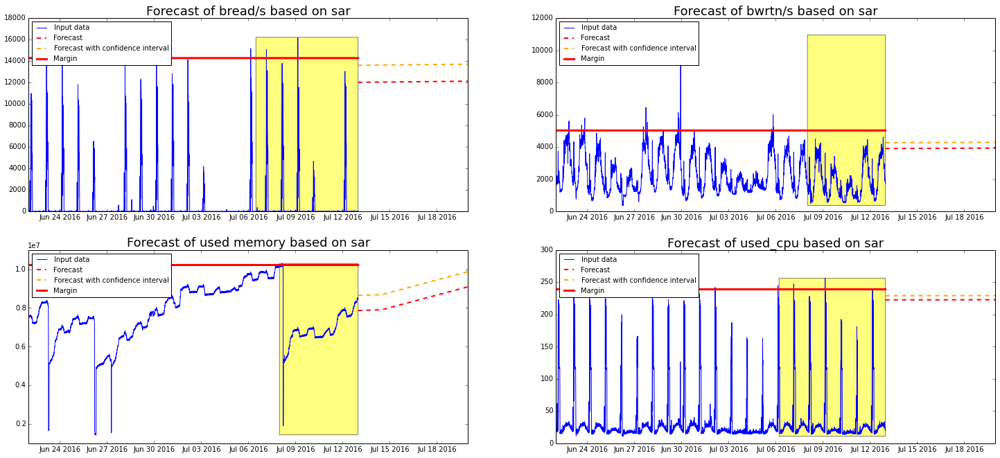

app106.eta.prod.ed1


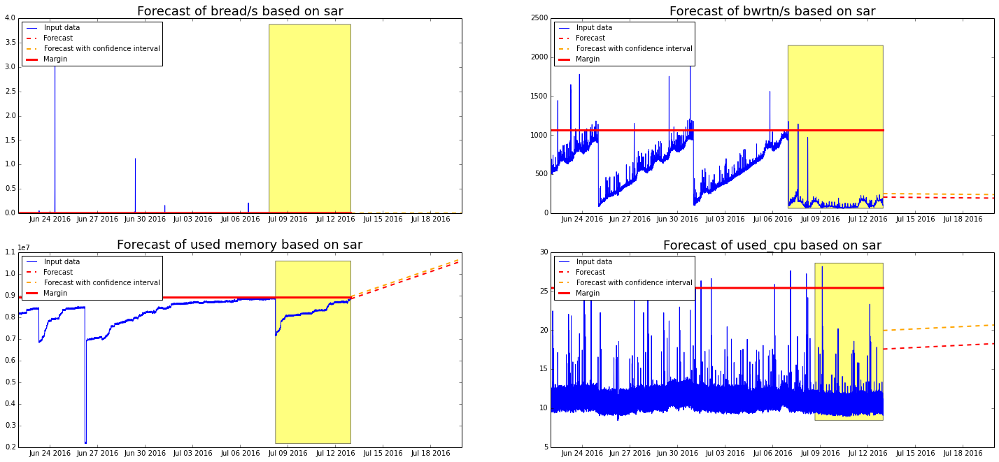

app107.eta.prod.ed1


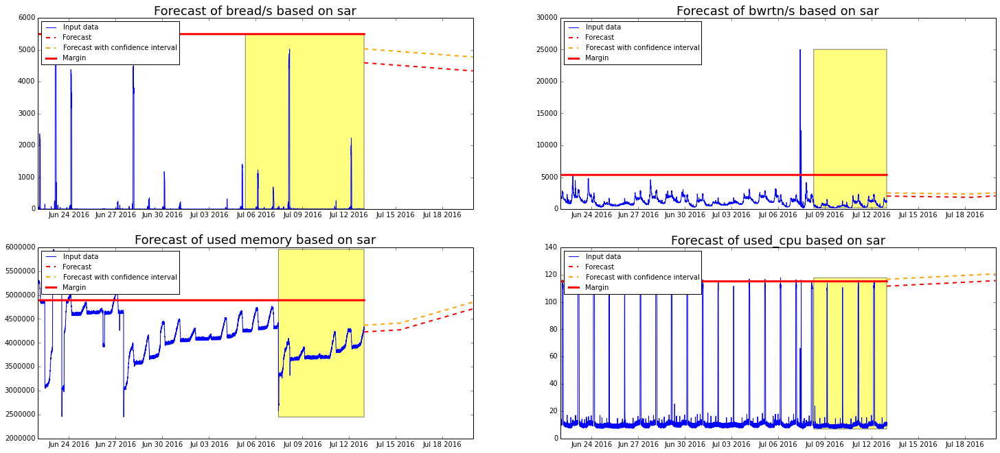

app108.eta.prod.ed1


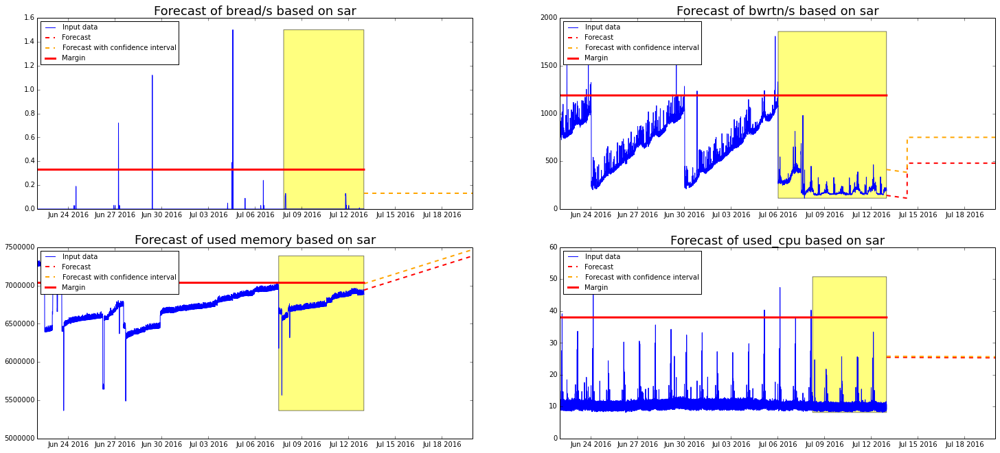

app109.eta.prod.ed1
Len of unique data less than number of clusters


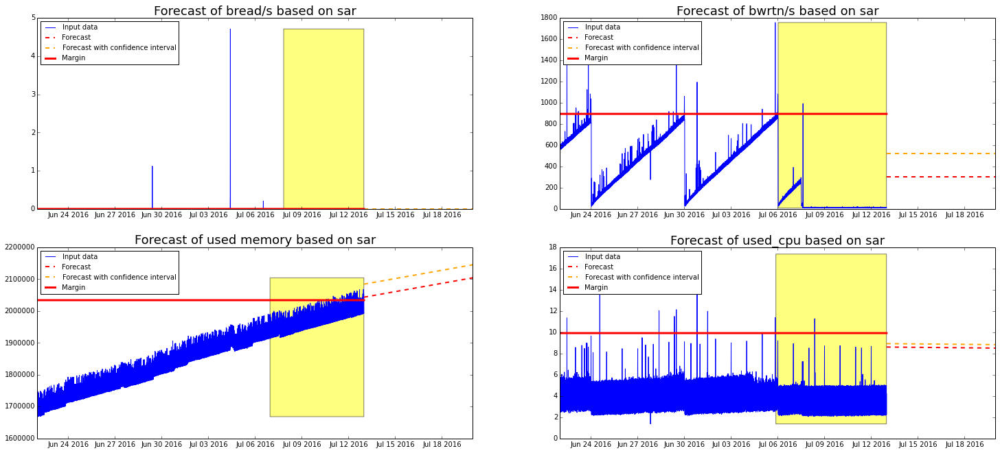

app110.eta.prod.ed1
Len of unique data less than number of clusters


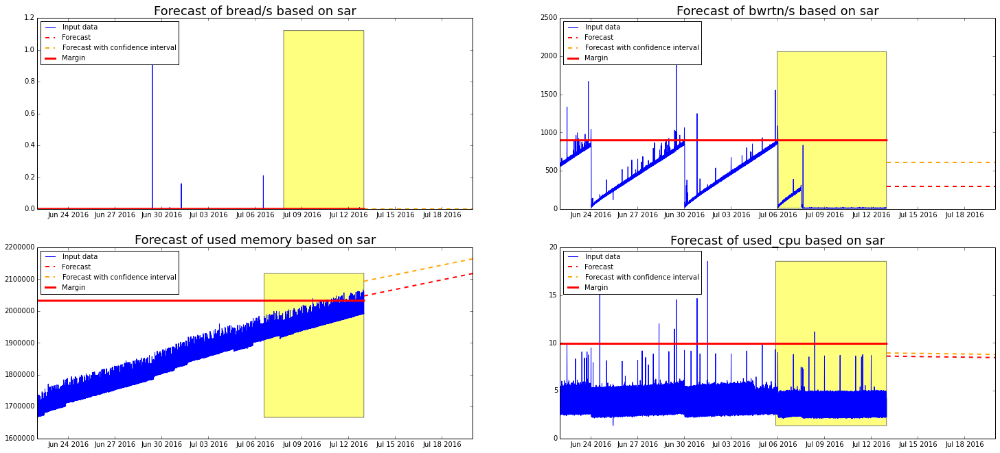

app111.eta.prod.ed1
Len of unique data less than number of clusters


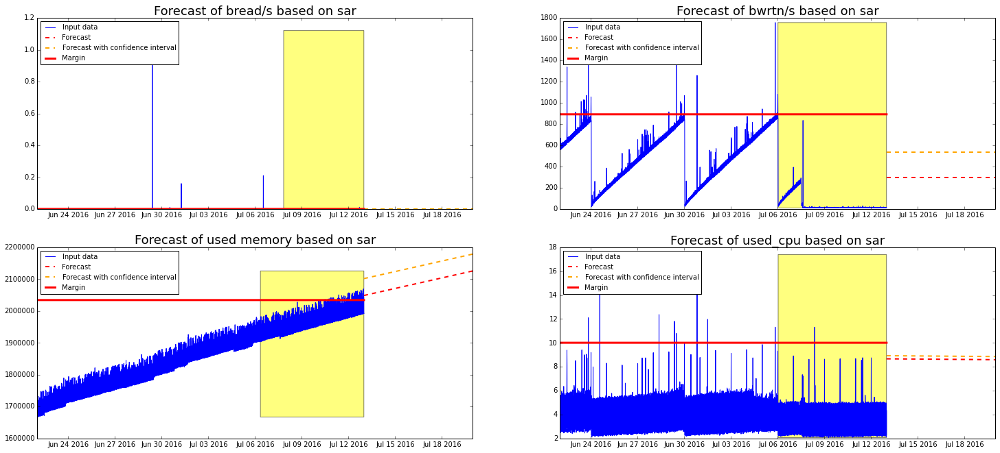

app112.eta.prod.ed1
Len of unique data less than number of clusters


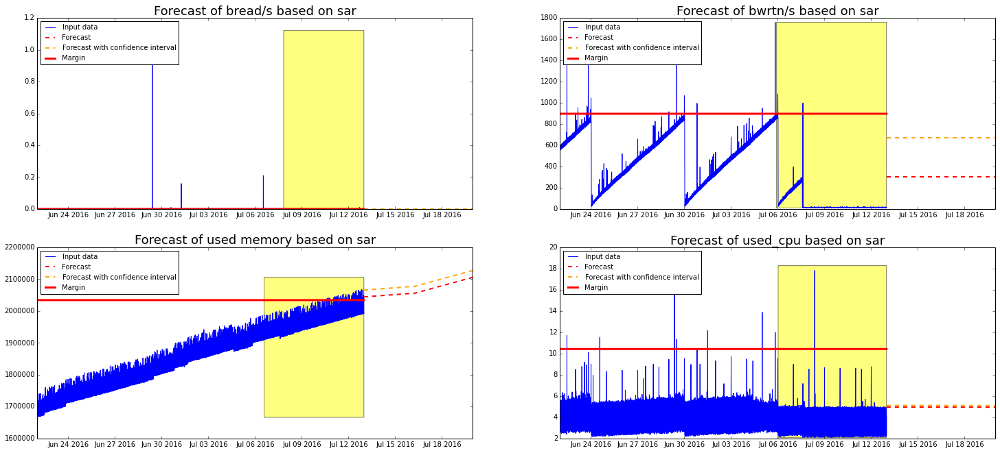

app101.eta.prod.ed5


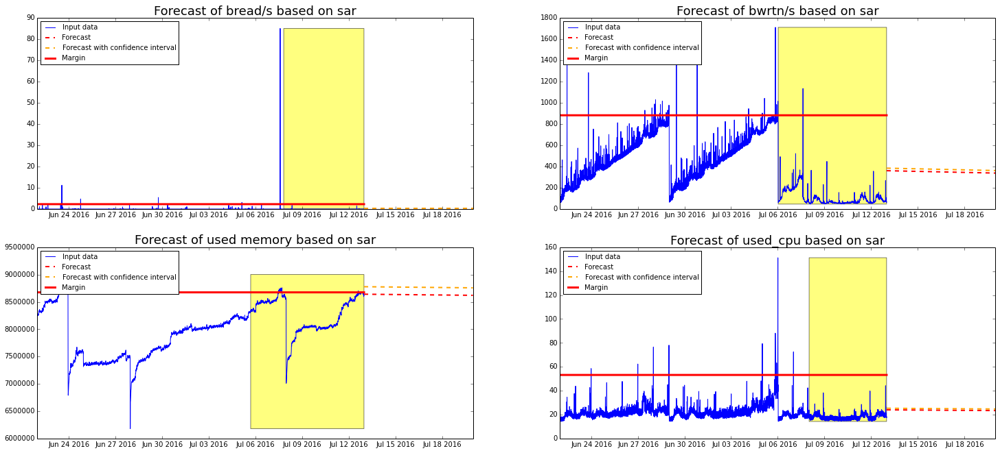

app102.eta.prod.ed5


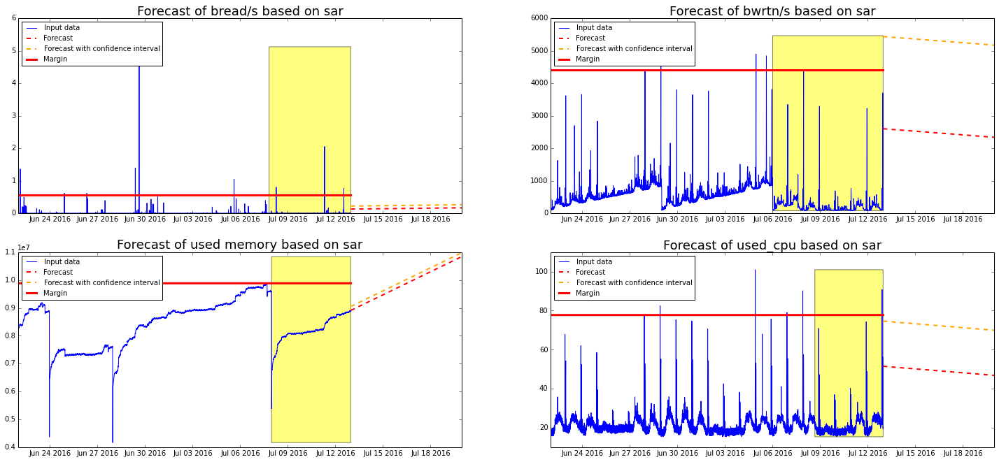

app103.eta.prod.ed5


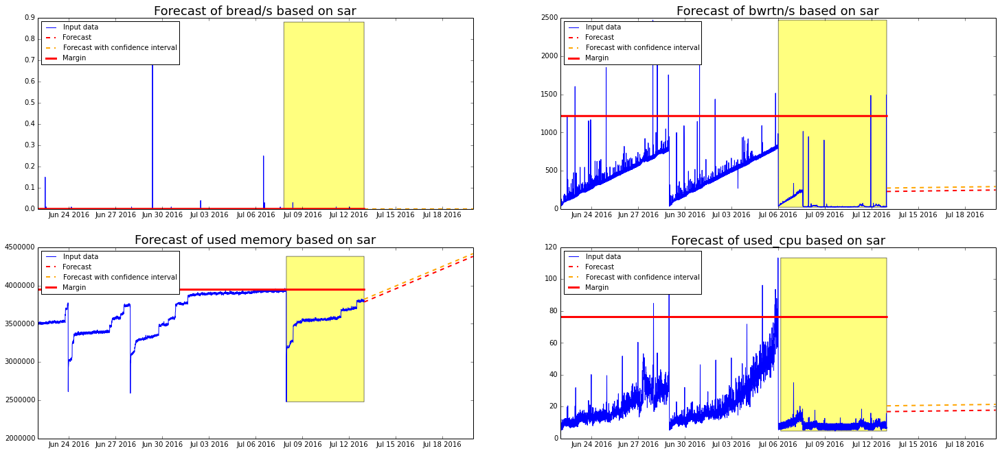

app104.eta.prod.ed5


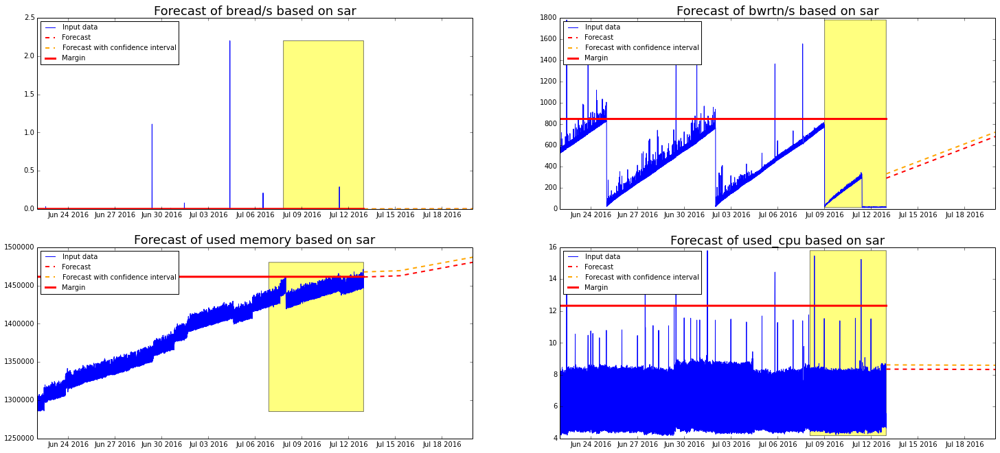

custom101.eta.prod.ed1


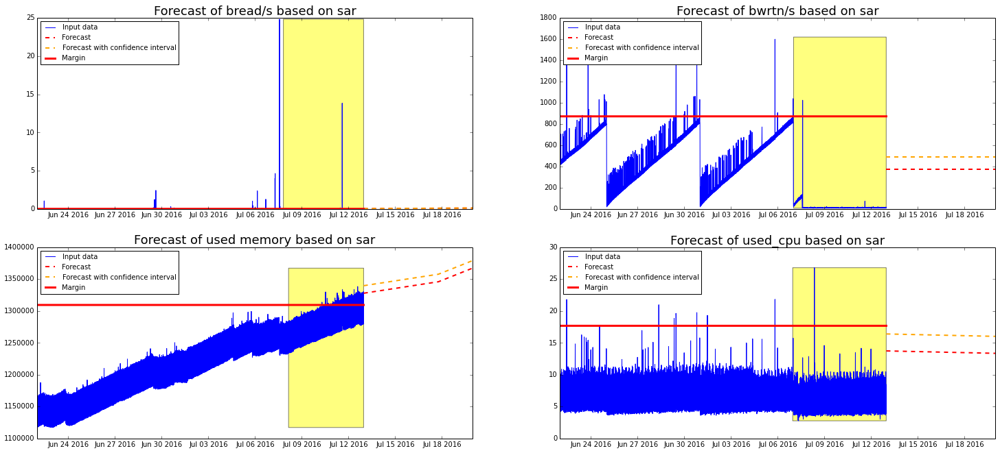

custom102.eta.prod.ed1


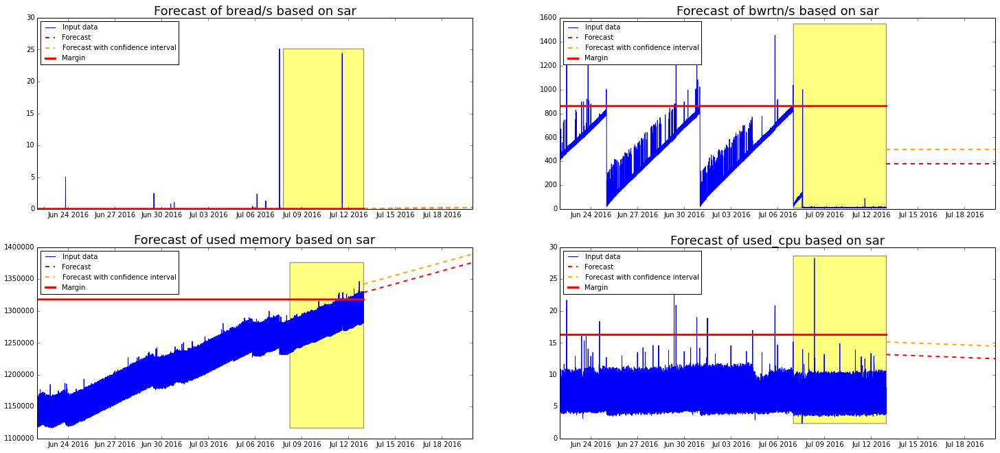

custom101.eta.prod.ed5
Len of unique data less than number of clusters


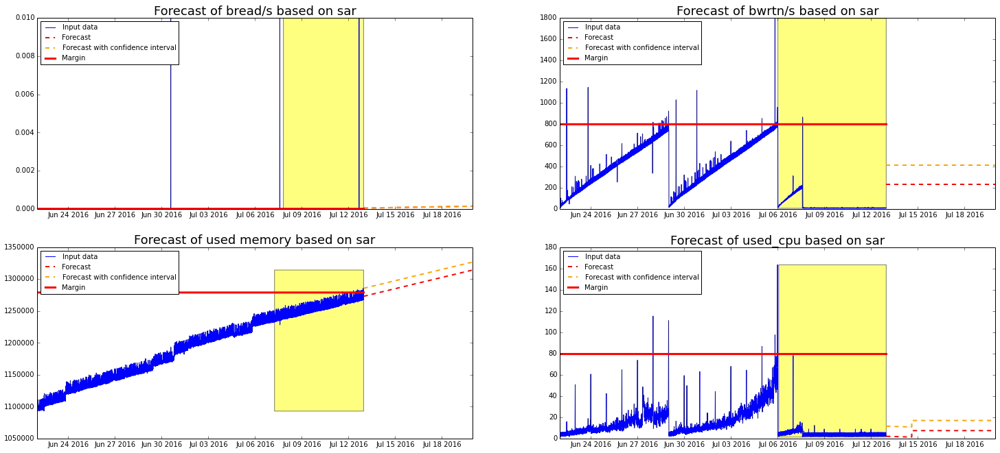

custom102.eta.prod.ed5
Len of unique data less than number of clusters


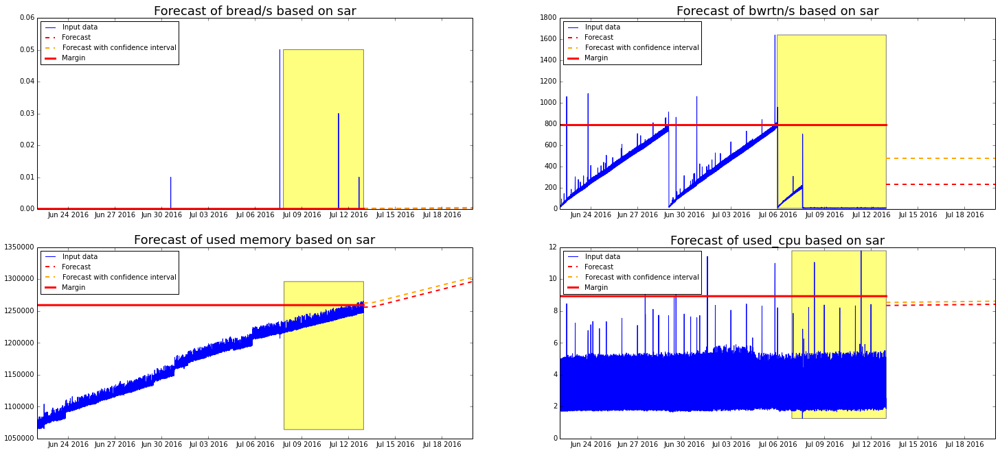

db101.eta.prod.ed1


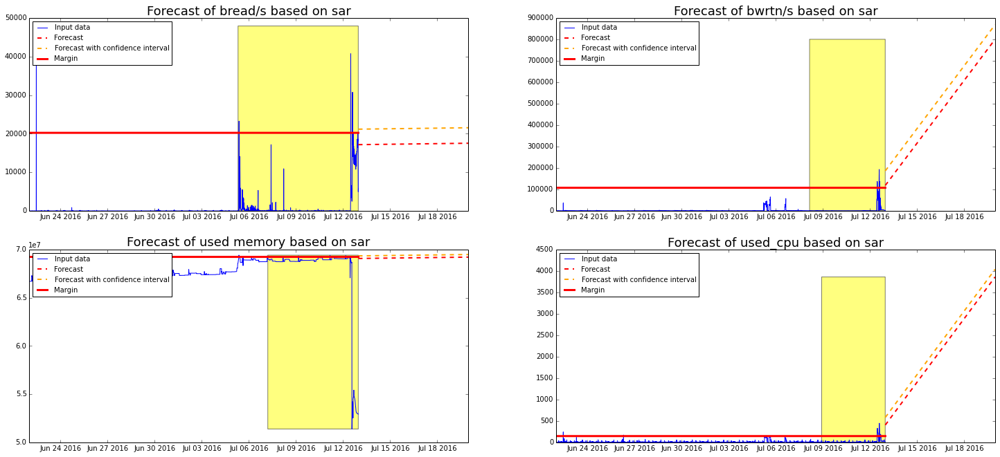

db102.eta.prod.ed1


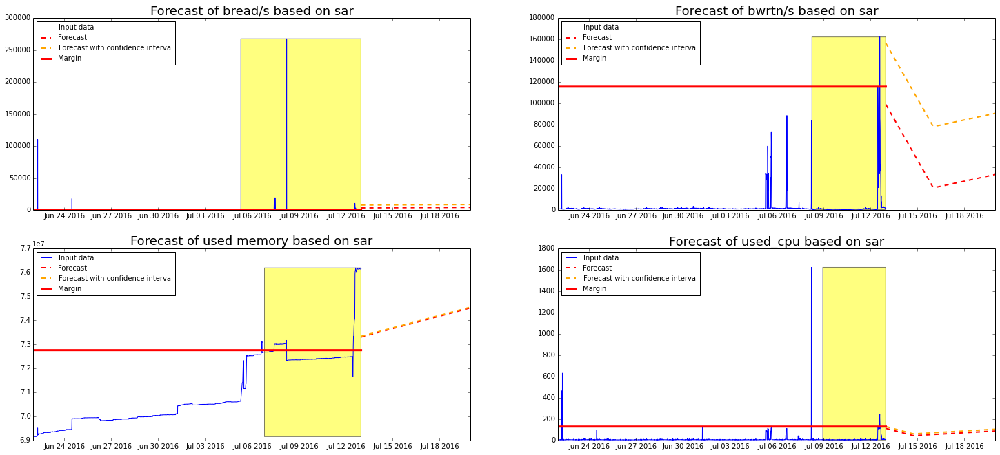

db101.eta.prod.ed5


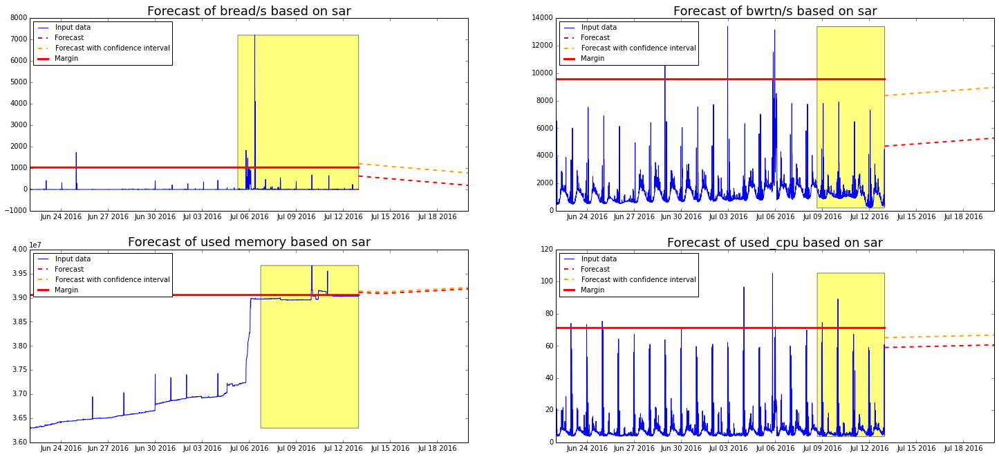

db102.eta.prod.ed5


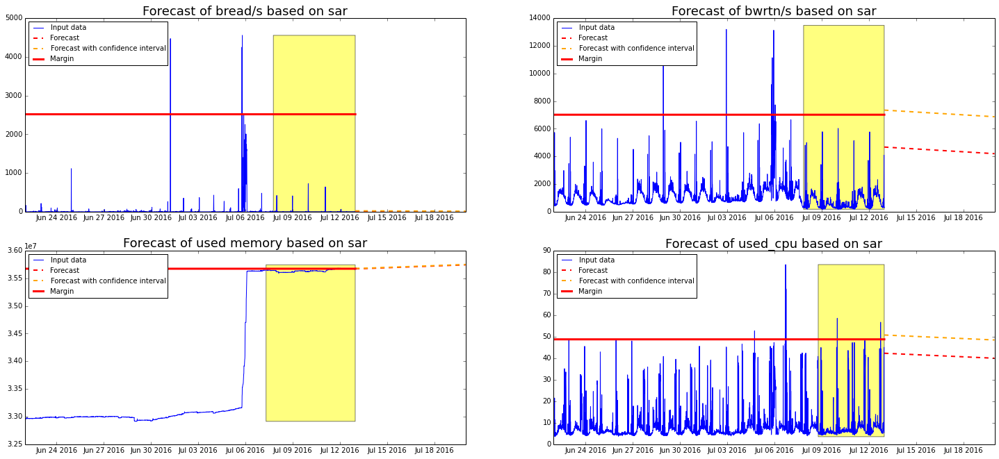

web101.eta.prod.ed1


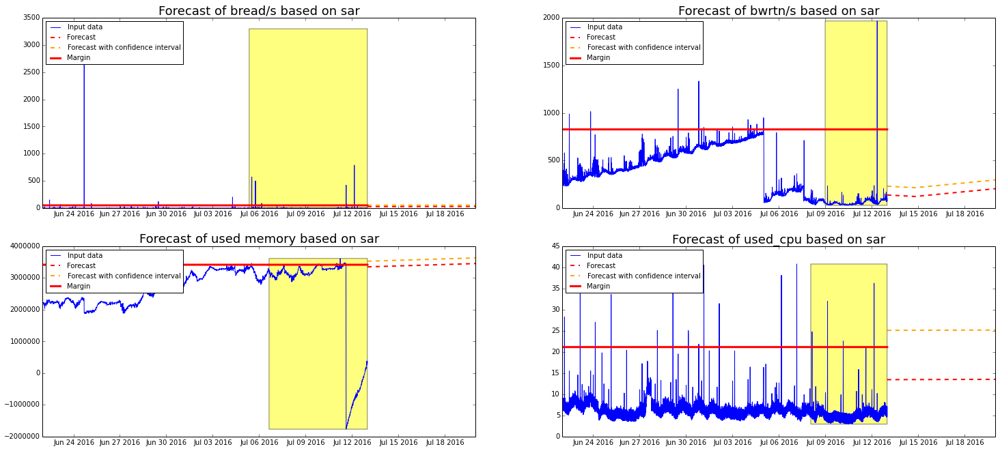

web102.eta.prod.ed1


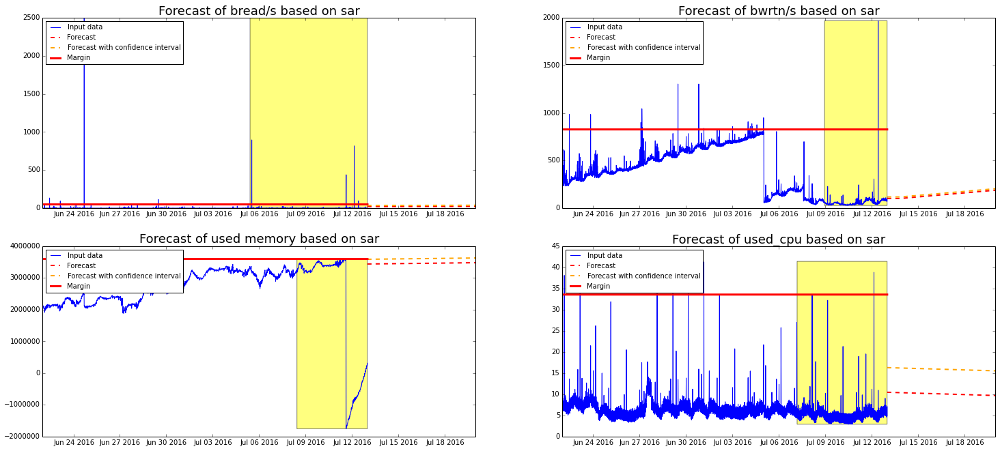

web103.eta.prod.ed1


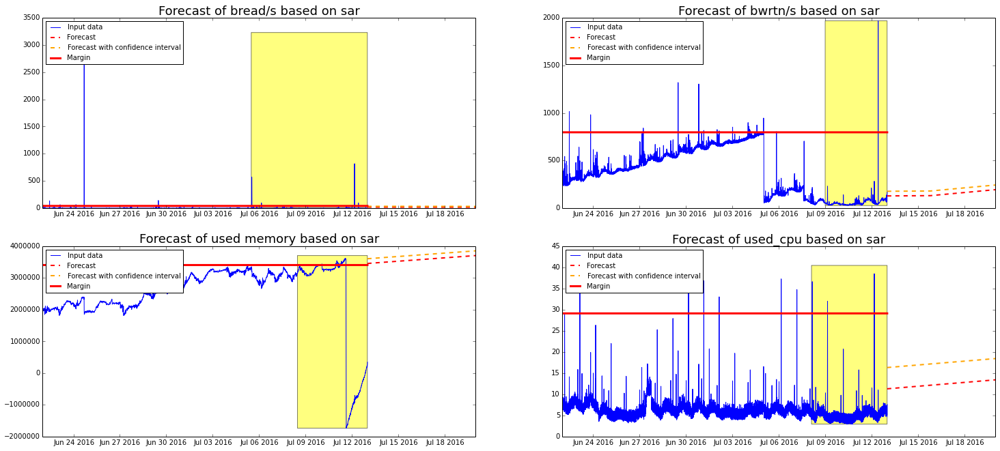

web104.eta.prod.ed1


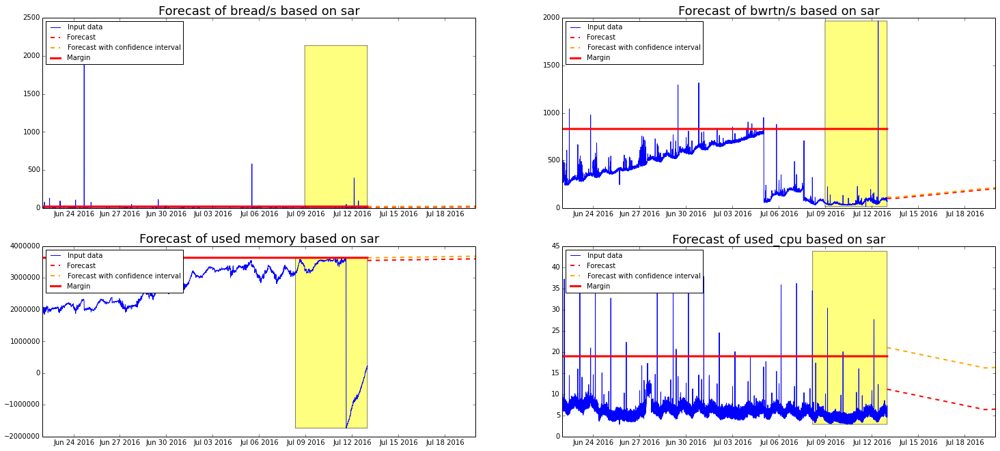

web105.eta.prod.ed1


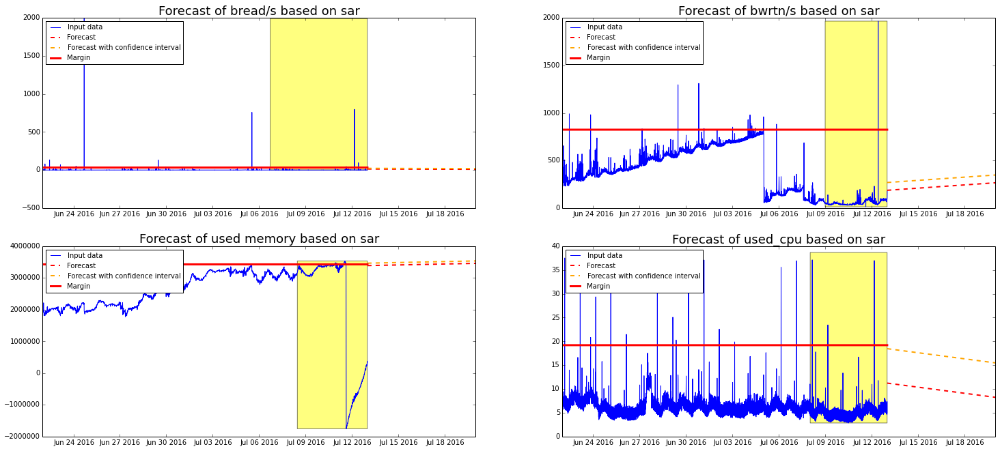

web106.eta.prod.ed1


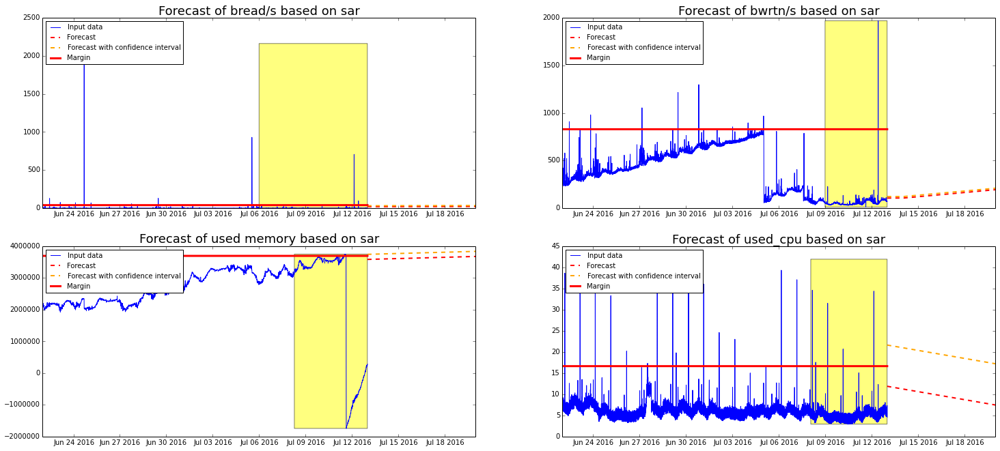

web107.eta.prod.ed1


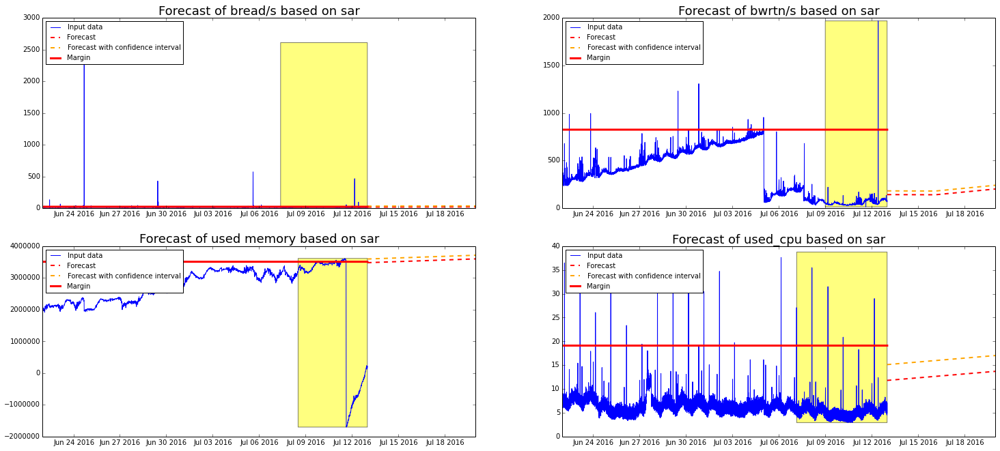

web108.eta.prod.ed1


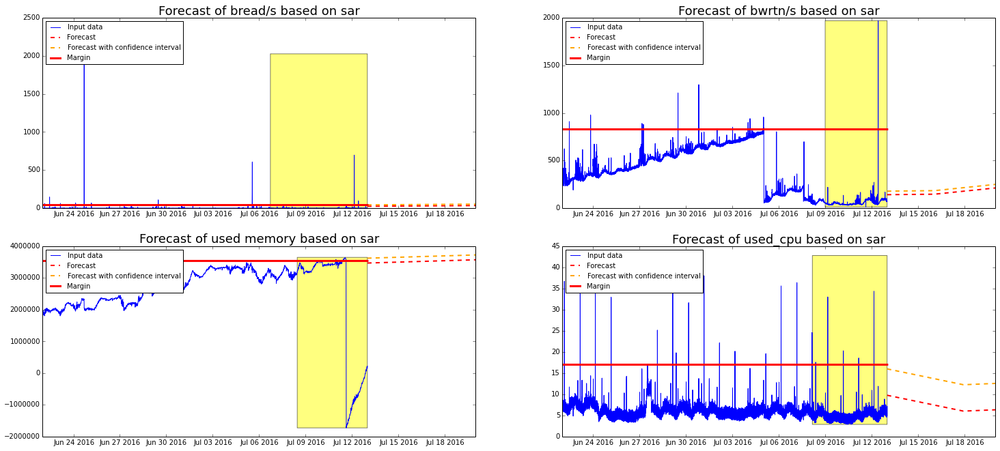

web109.eta.prod.ed1


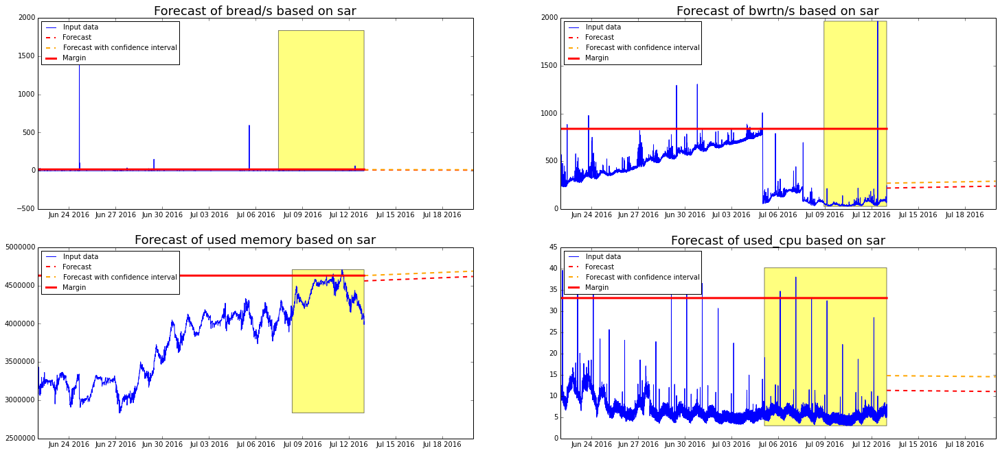

web110.eta.prod.ed1


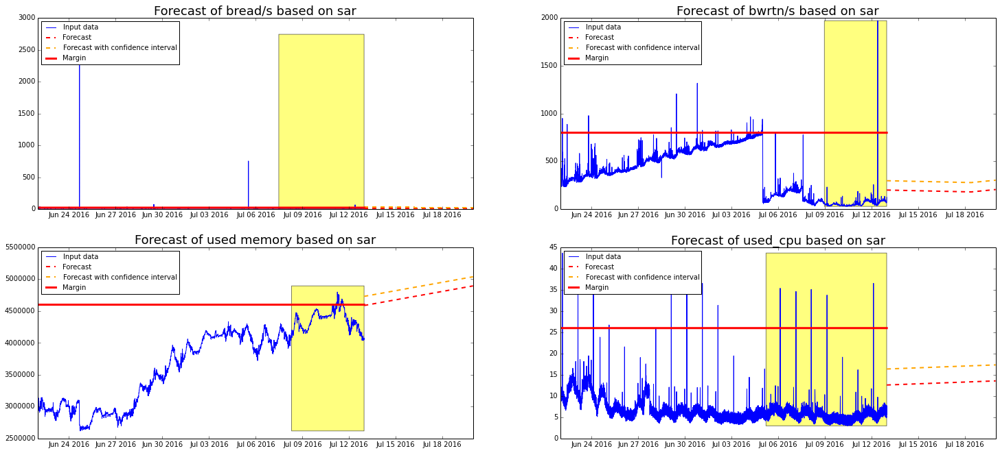

web111.eta.prod.ed1


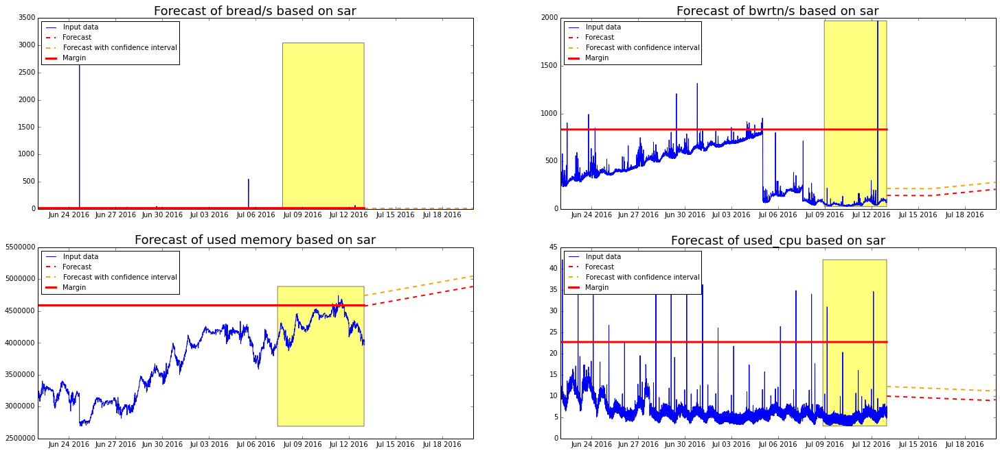

web112.eta.prod.ed1


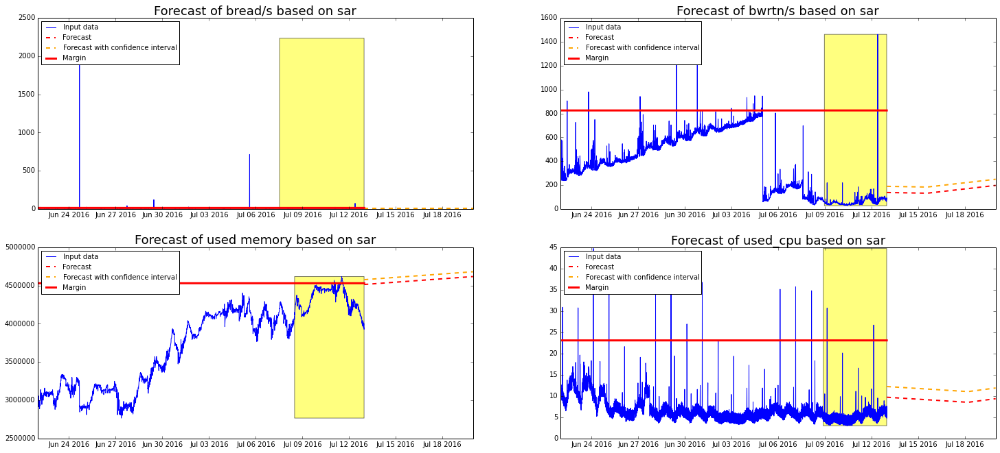

web113.eta.prod.ed1


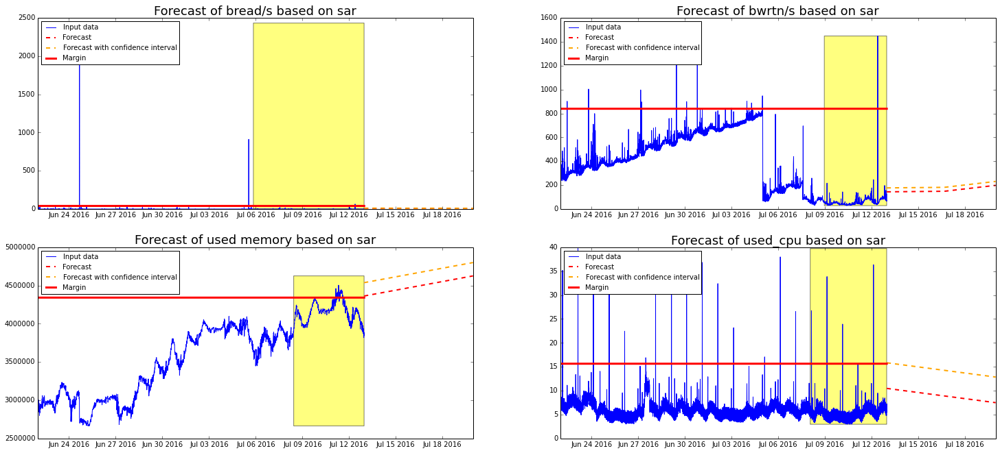

web114.eta.prod.ed1


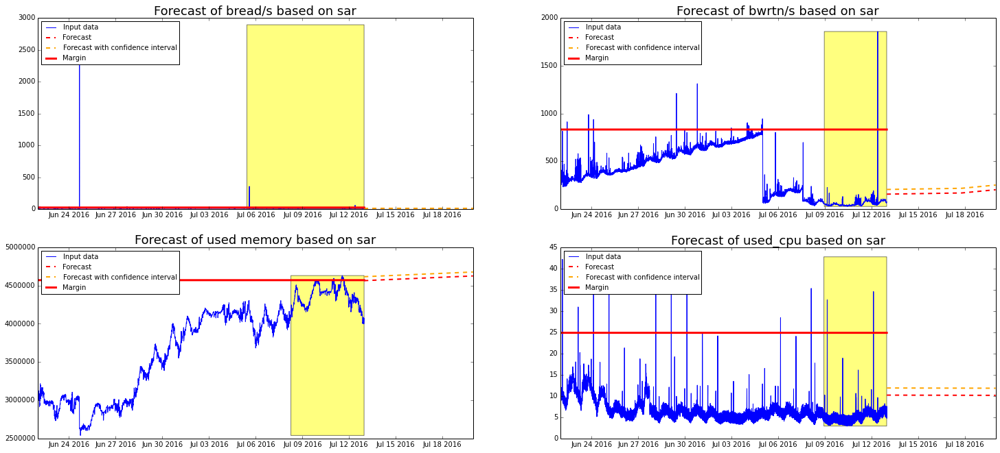

web115.eta.prod.ed1


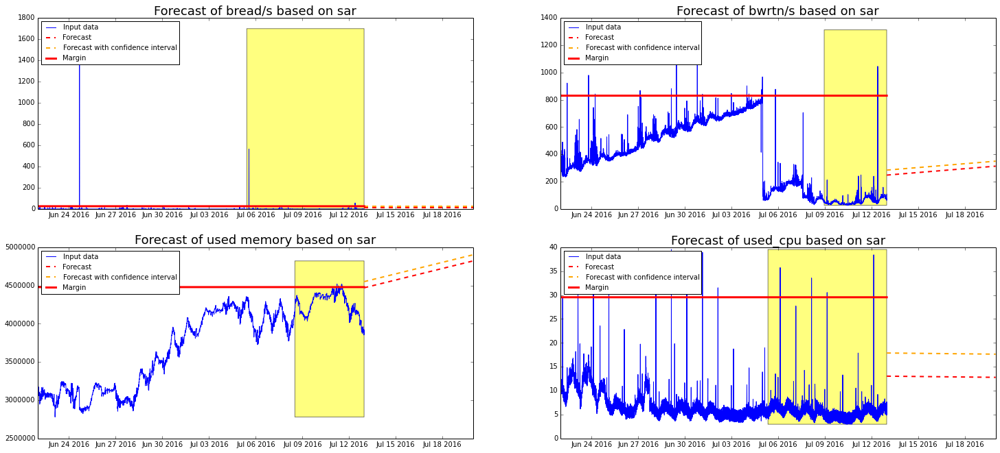

web116.eta.prod.ed1


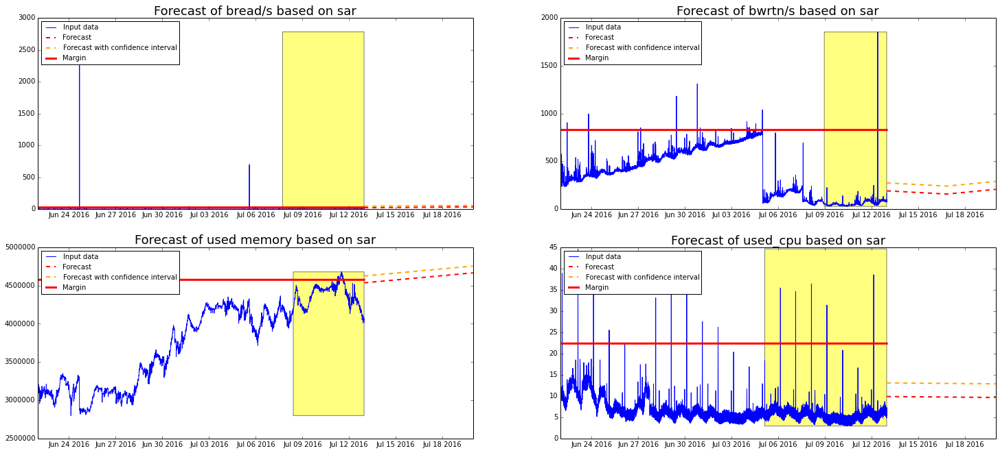

web117.eta.prod.ed1


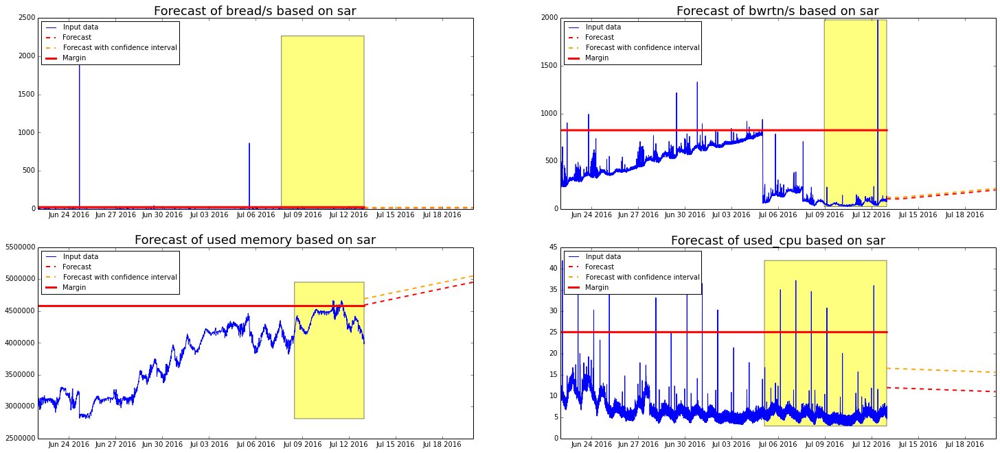

web118.eta.prod.ed1


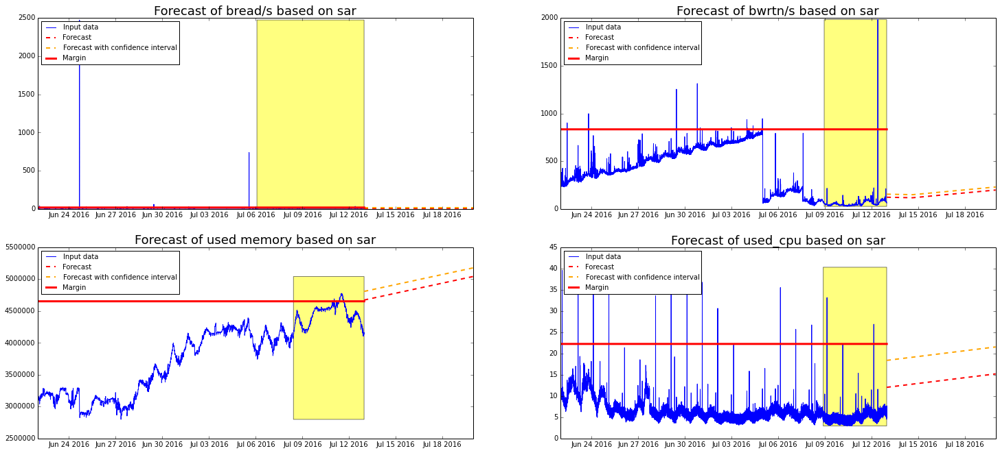

web119.eta.prod.ed1


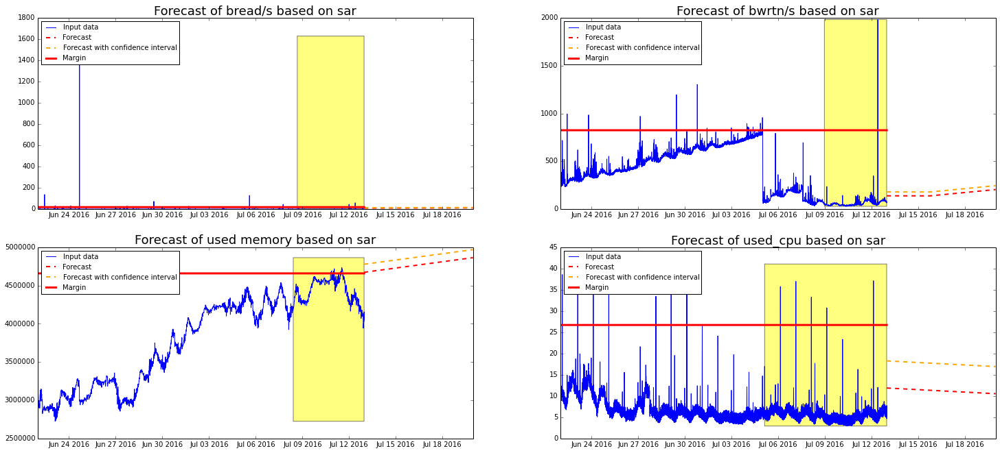

web101.eta.prod.ed5


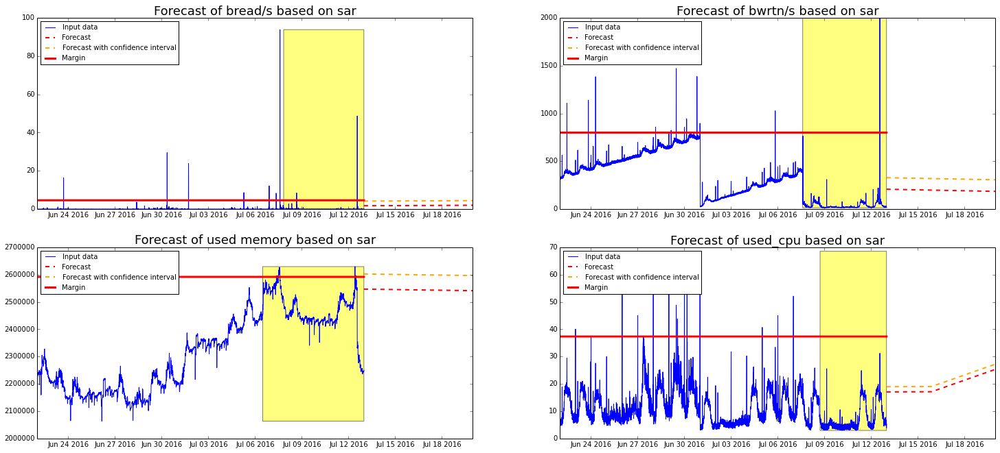

web102.eta.prod.ed5


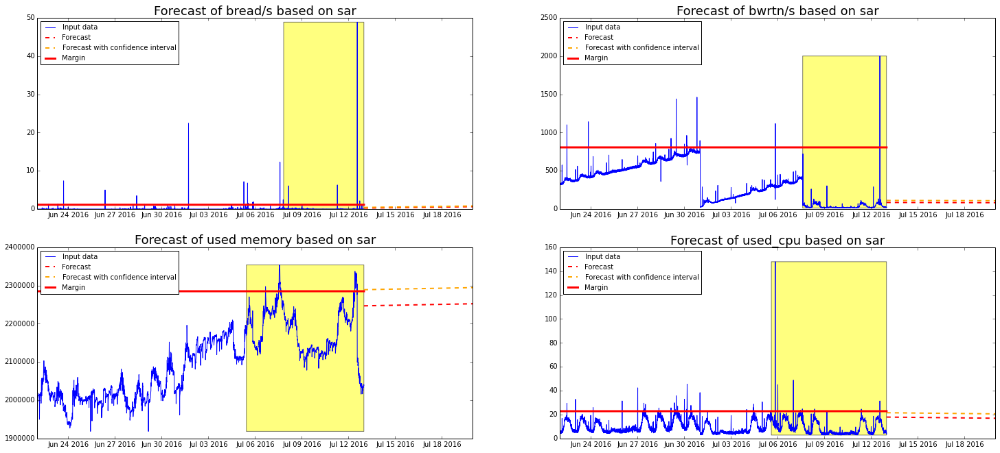

web103.eta.prod.ed5


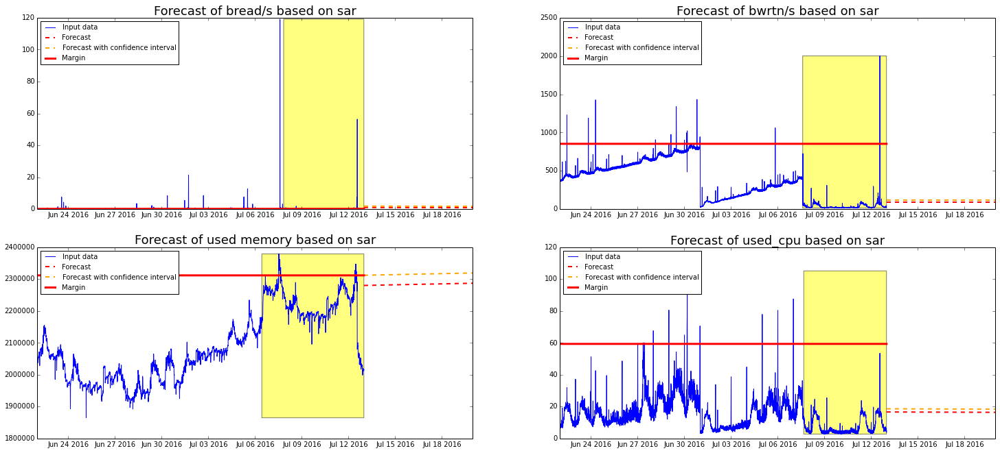

web104.eta.prod.ed5


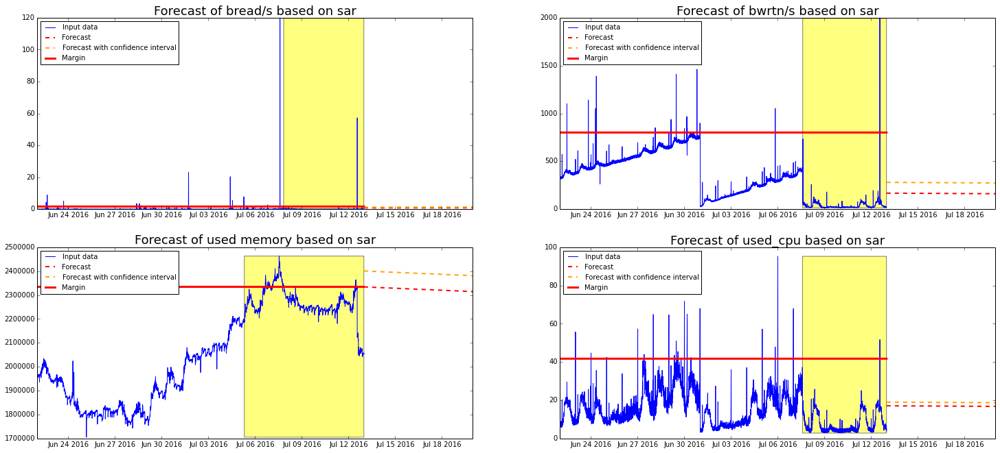

web105.eta.prod.ed5


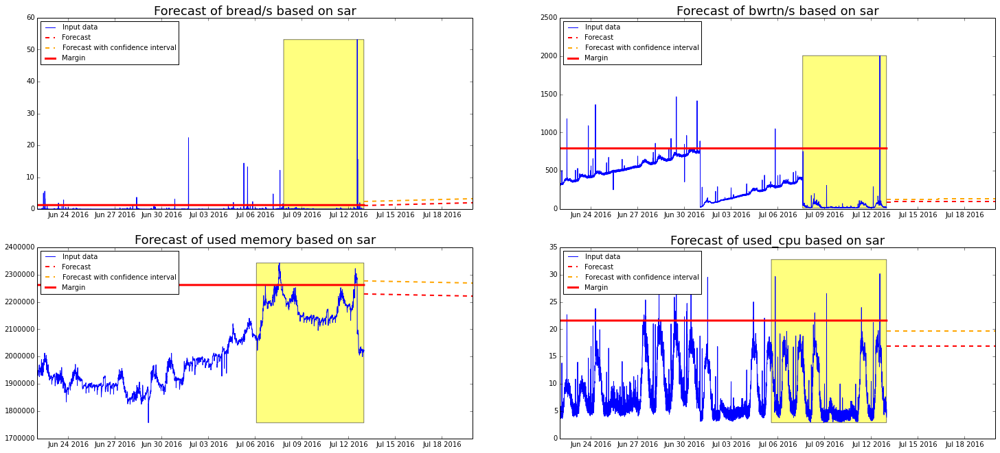

web106.eta.prod.ed5


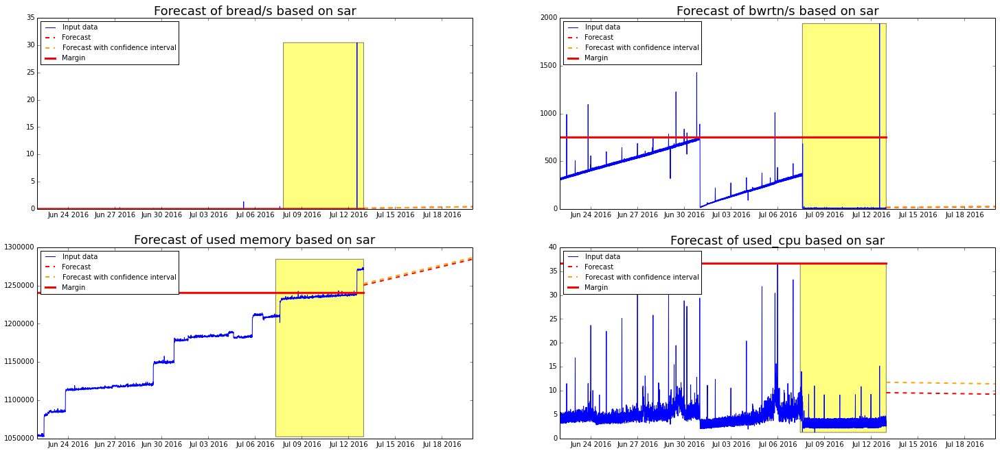

web107.eta.prod.ed5


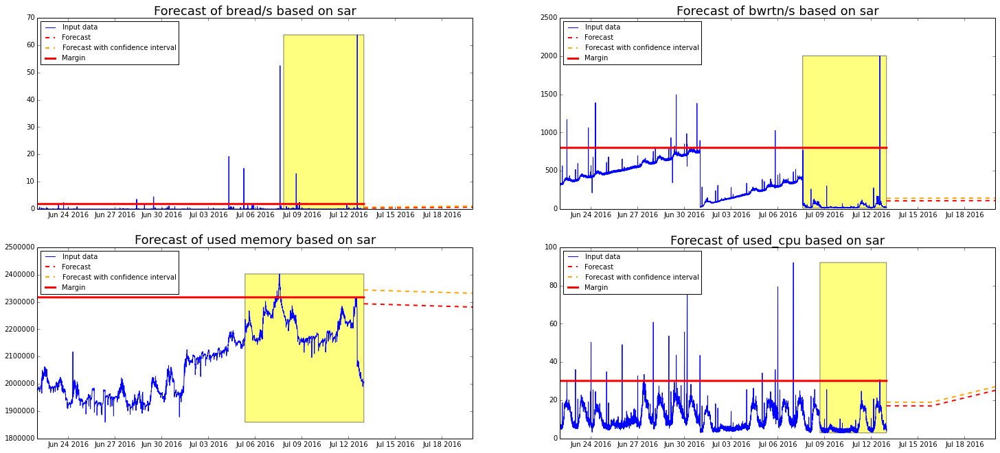

web108.eta.prod.ed5


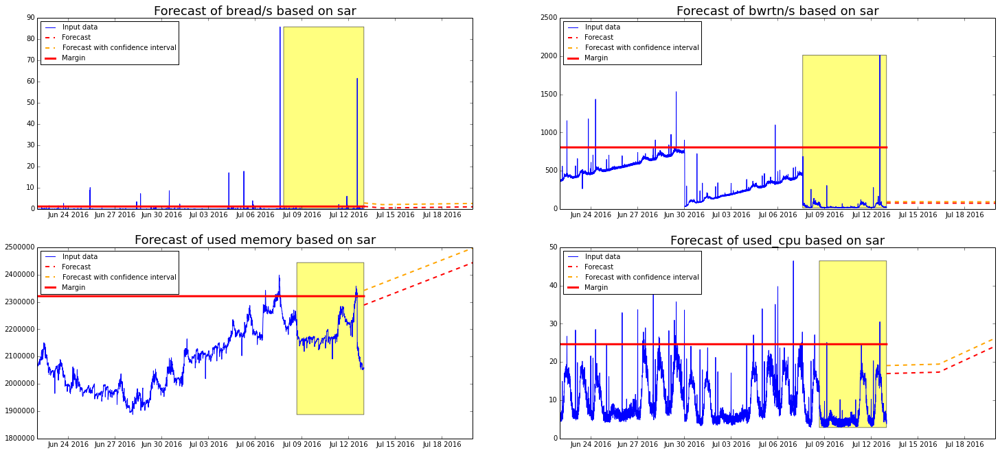

services101.eta.prod.ed1


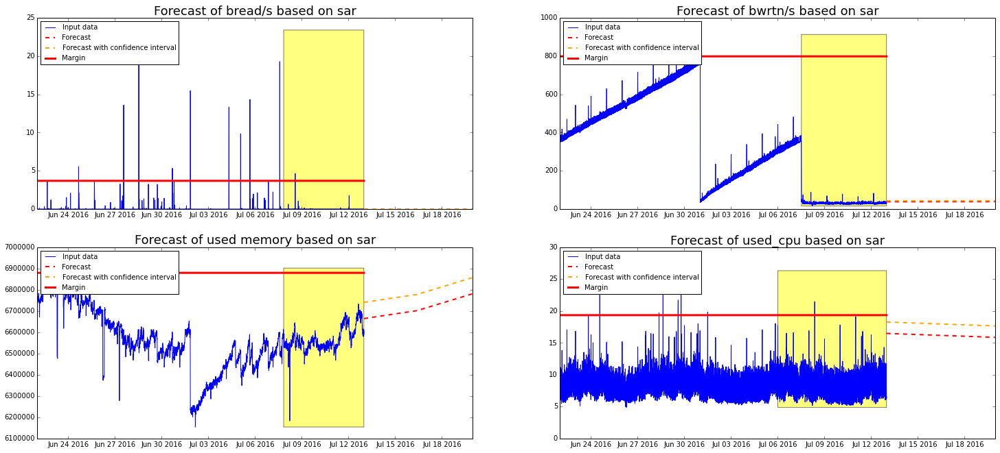

services102.eta.prod.ed1


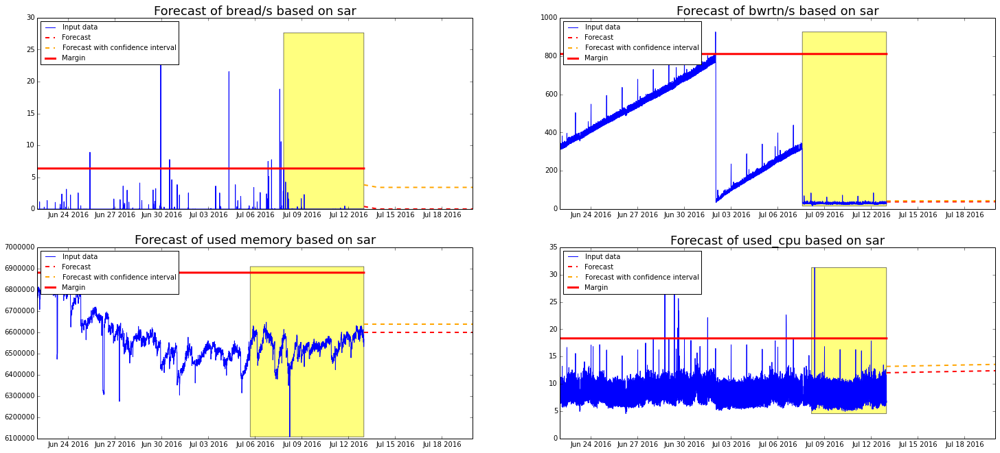

services103.eta.prod.ed1


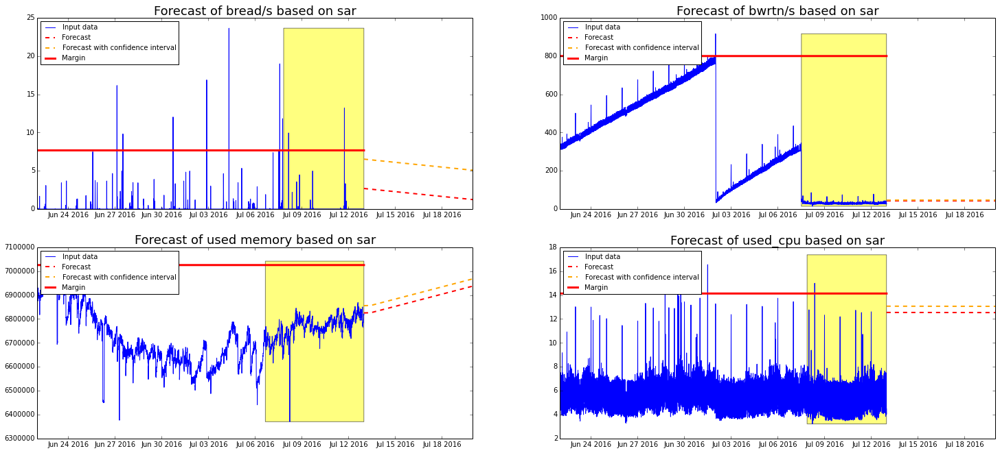

services104.eta.prod.ed1


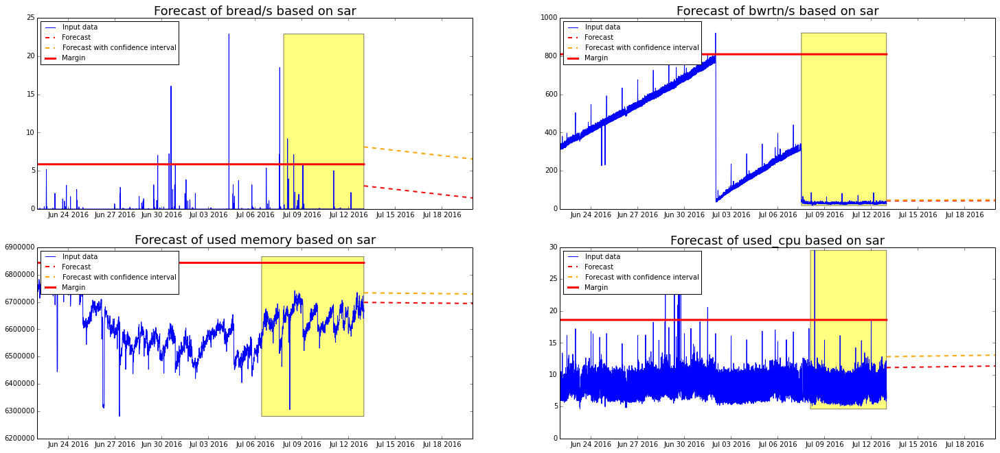

services105.eta.prod.ed1


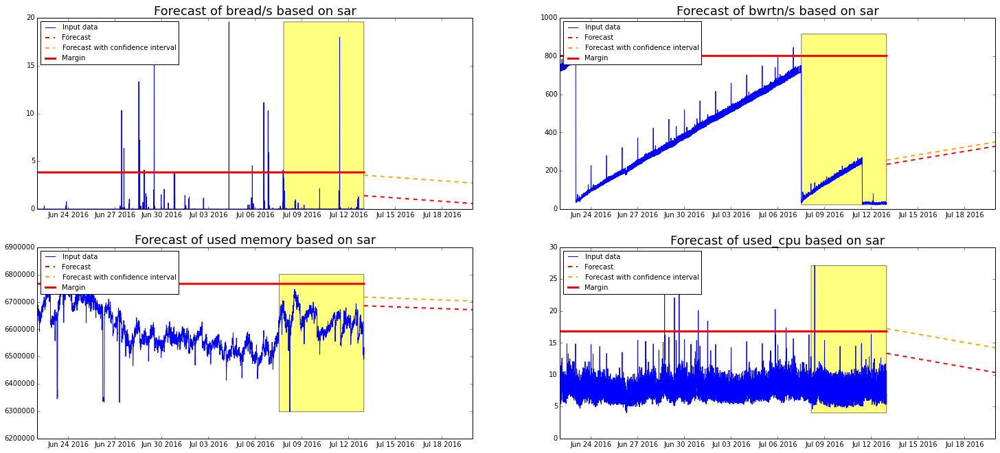

services101.eta.prod.ed5


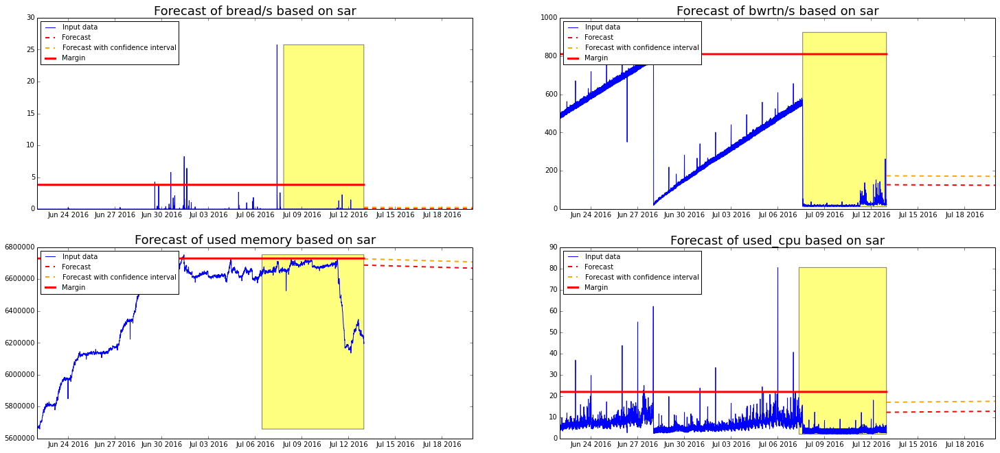

services102.eta.prod.ed5


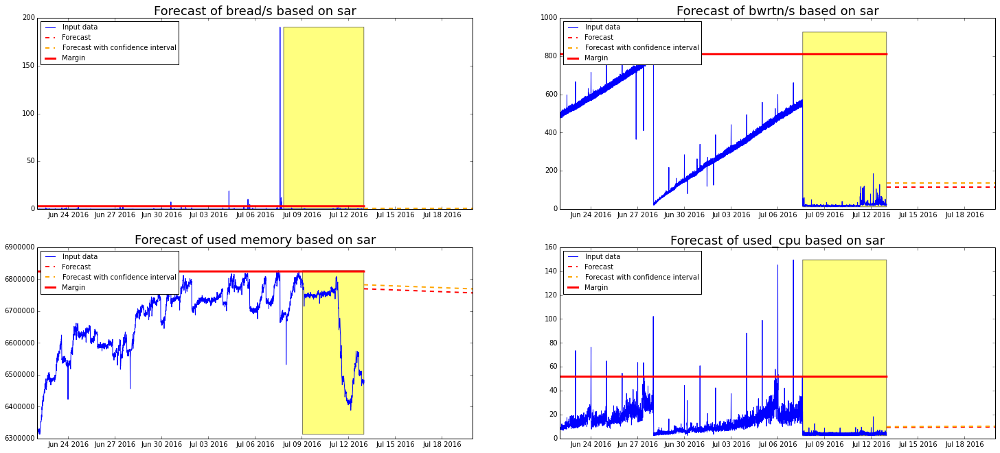

services103.eta.prod.ed5


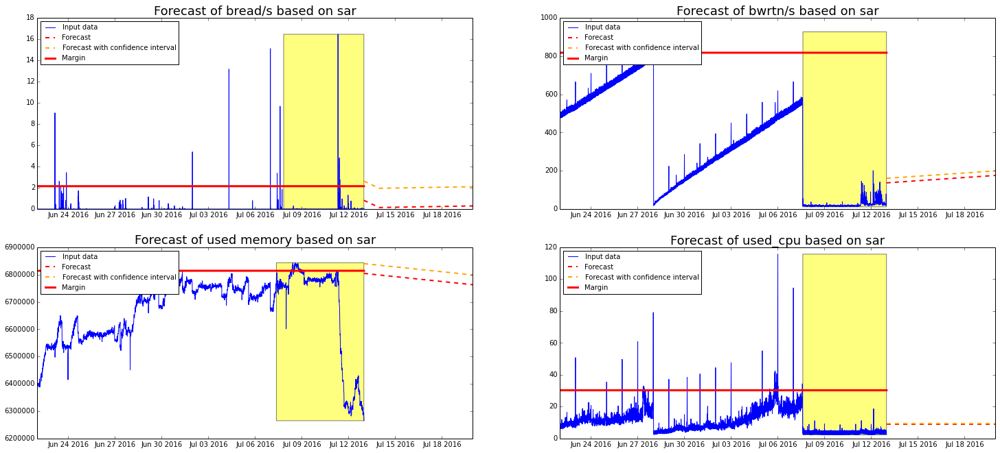

services104.eta.prod.ed5


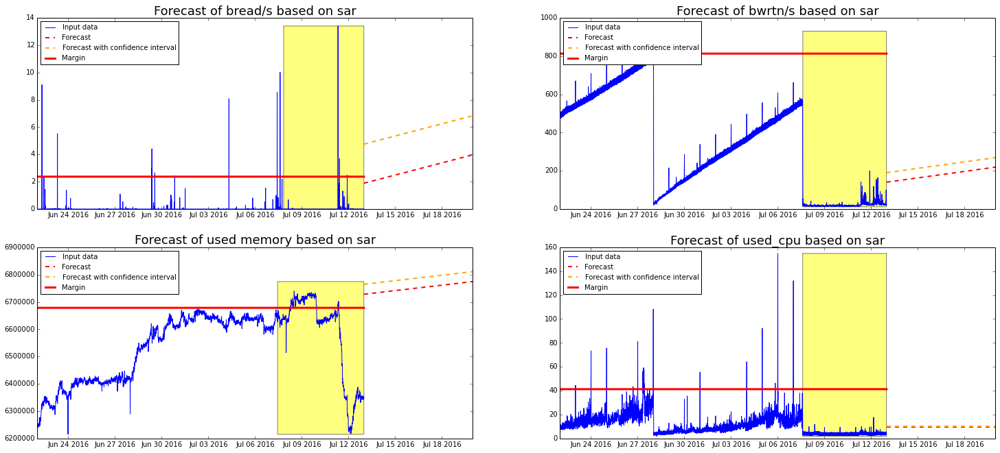

fs101.eta.prod.ed1


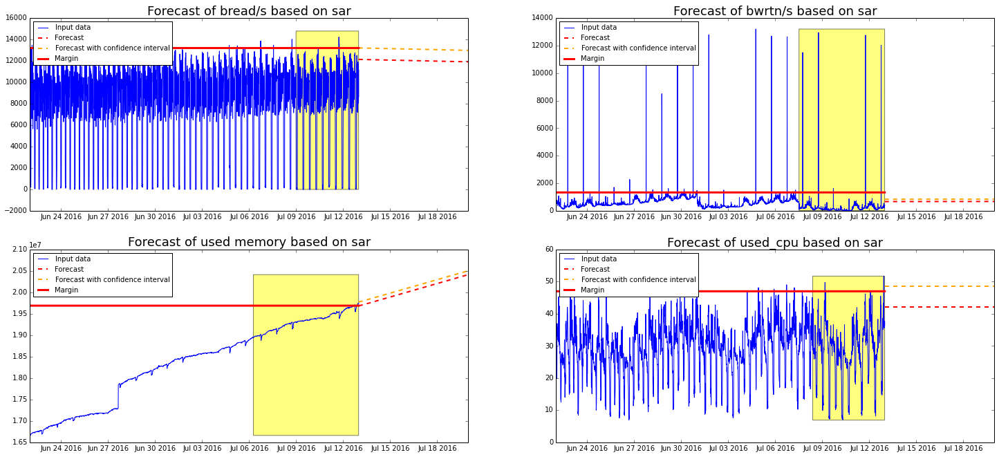

fs102.eta.prod.ed1


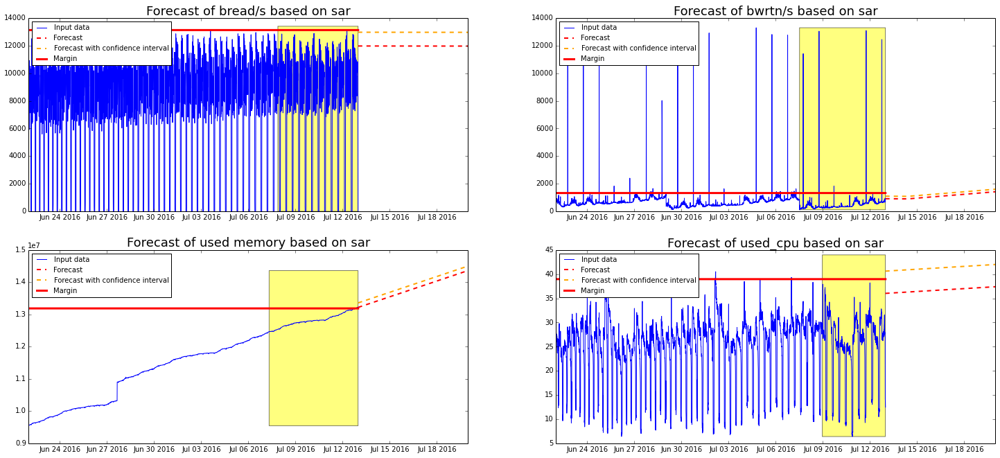

fs101.eta.prod.ed5


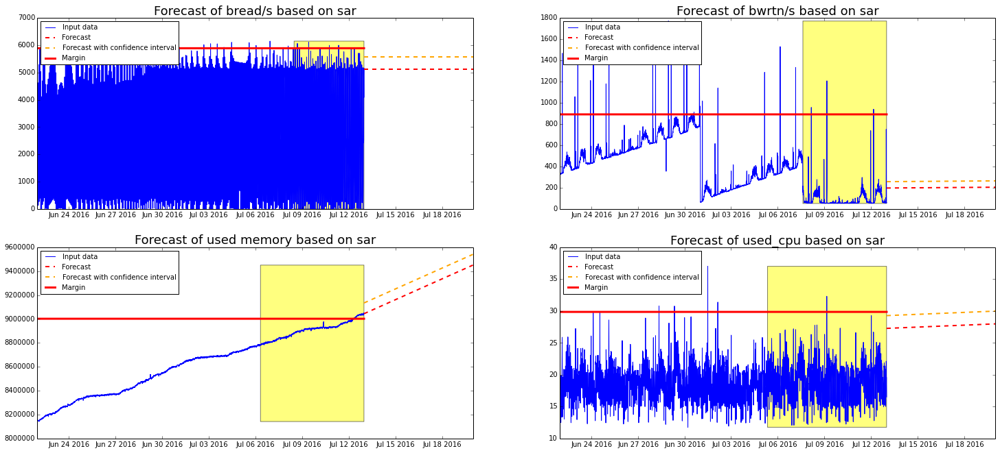

fs102.eta.prod.ed5


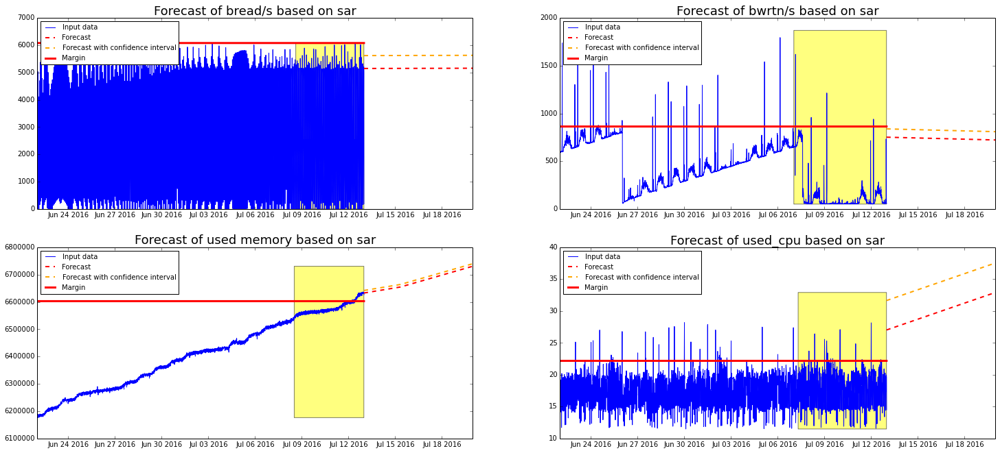

ha101.eta.prod.ed1


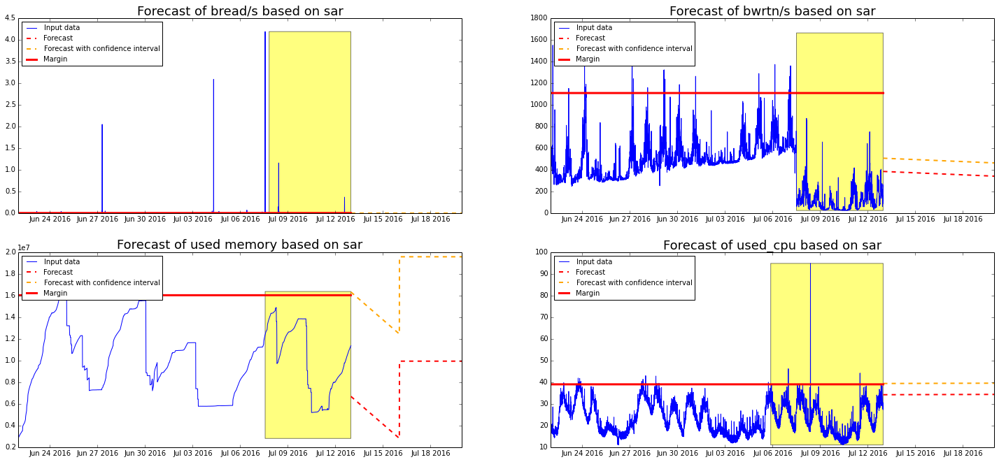

ha102.eta.prod.ed1


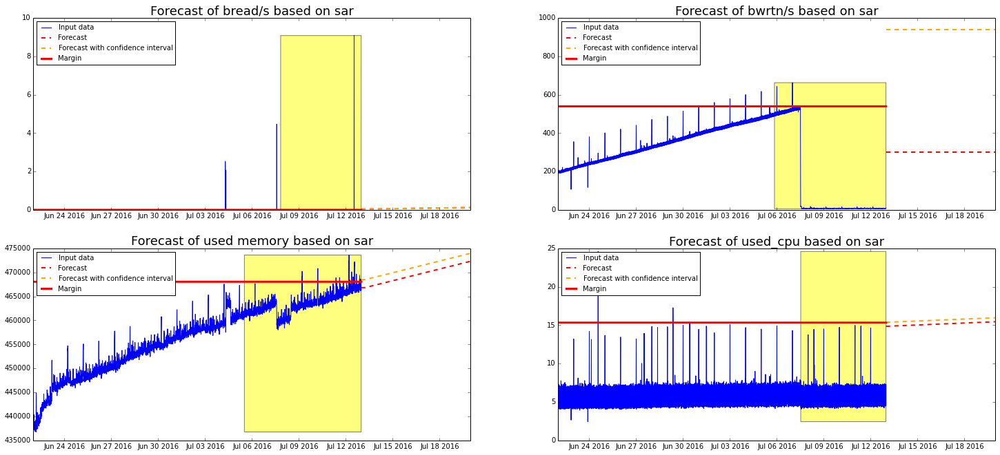

ha101.eta.prod.ed5


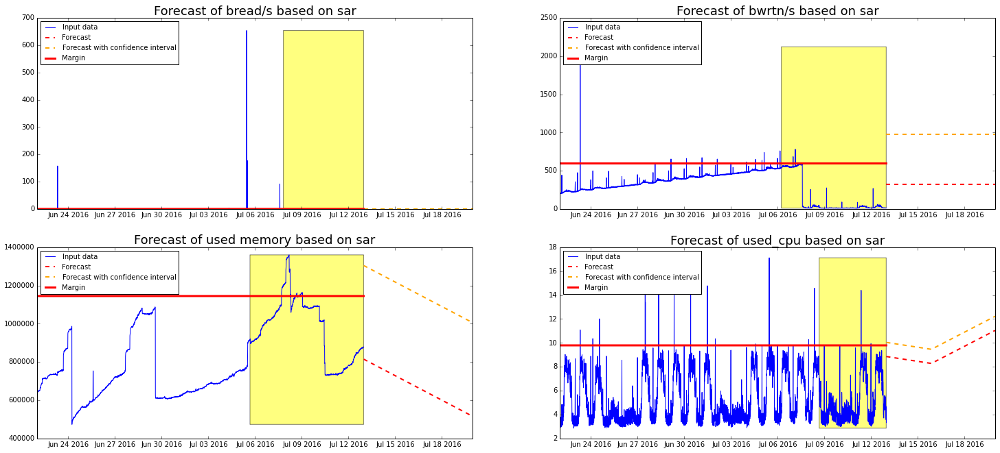

ha102.eta.prod.ed5
Len of unique data less than number of clusters


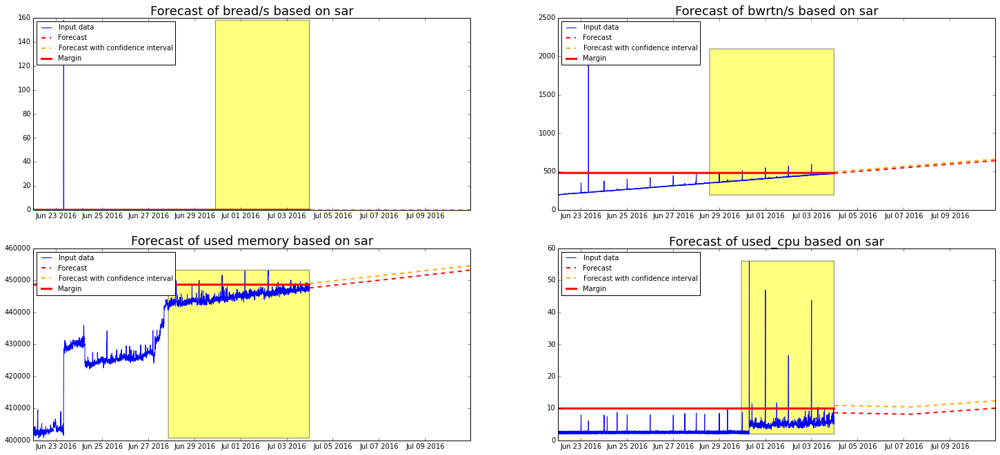

red101.eta.prod.ed1
Len of unique data less than number of clusters


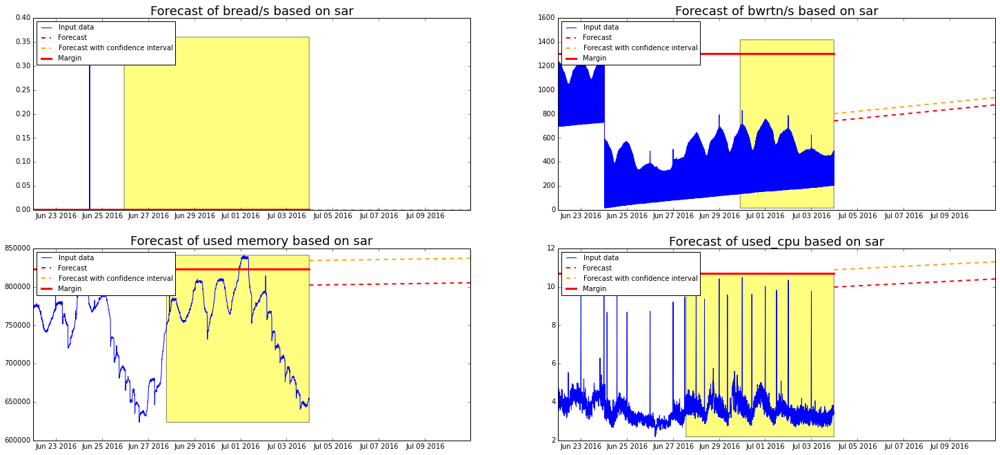

red102.eta.prod.ed1
Len of unique data less than number of clusters


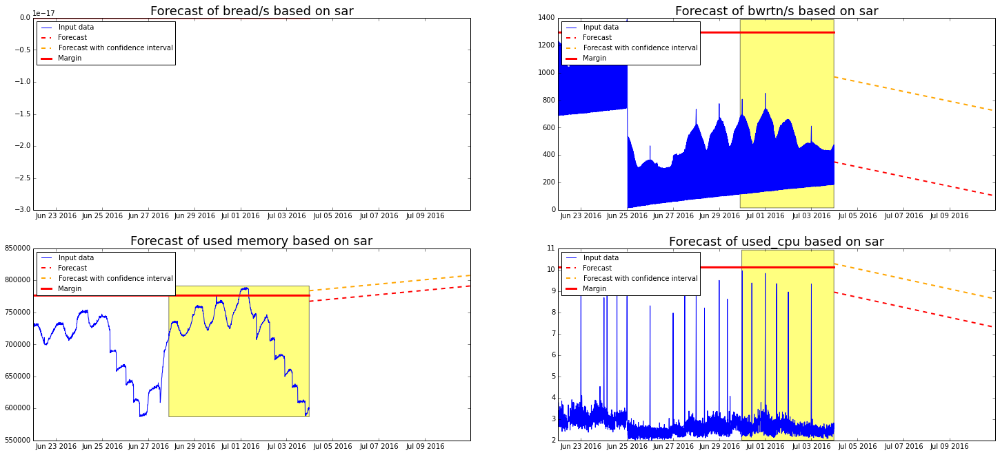

red103.eta.prod.ed1
Len of unique data less than number of clusters


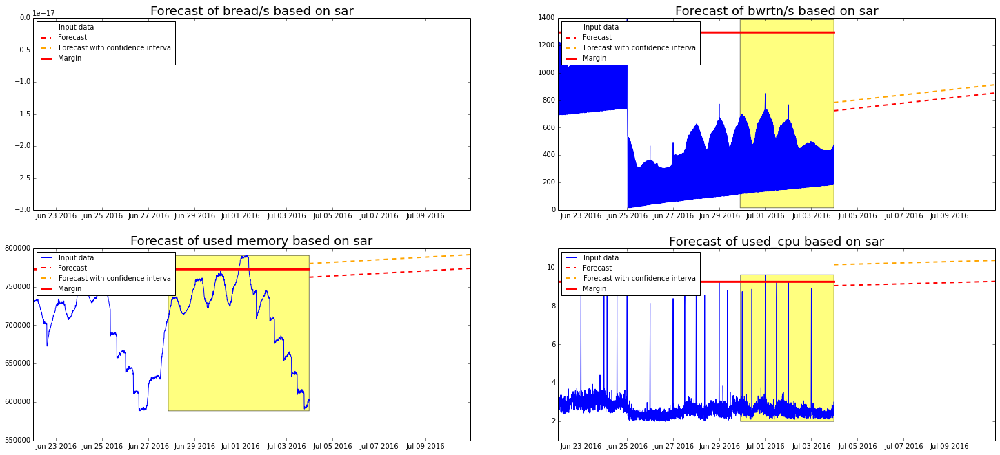

red101.eta.prod.ed5
Len of unique data less than number of clusters


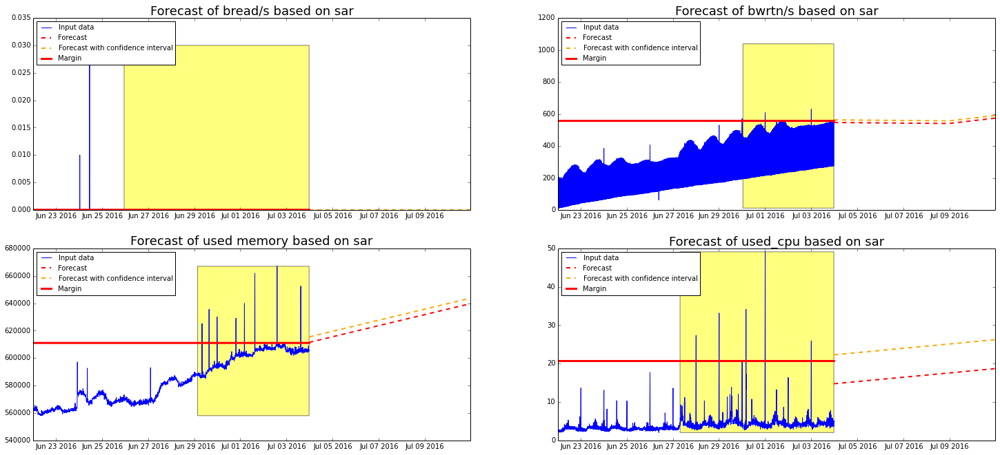

red102.eta.prod.ed5
Len of unique data less than number of clusters


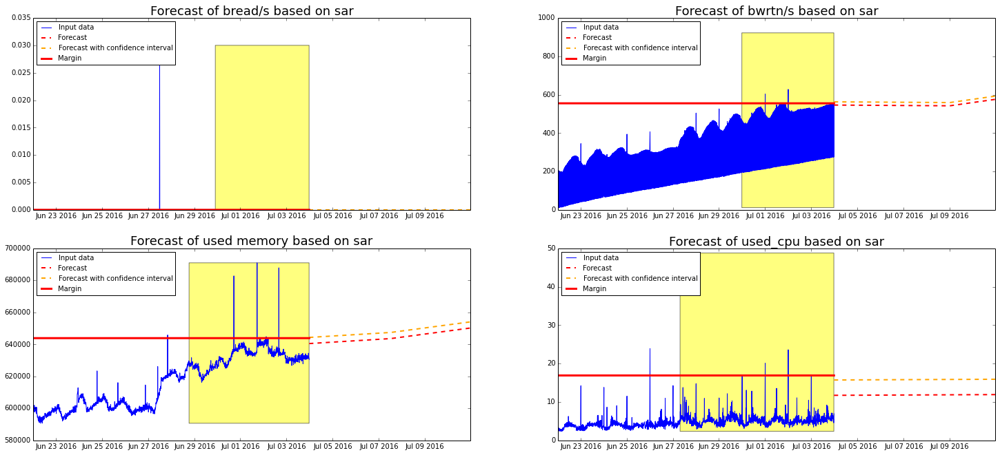

red103.eta.prod.ed5
Len of unique data less than number of clusters


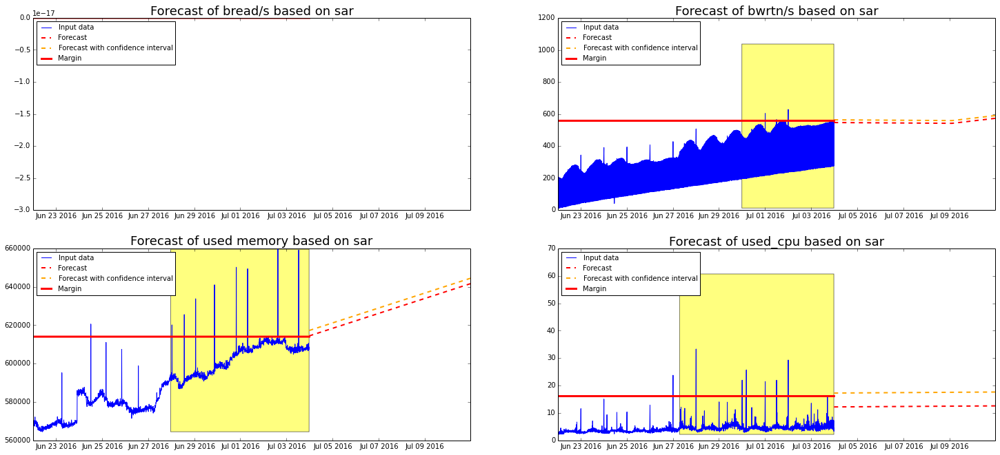

red104.eta.prod.ed1
Len of unique data less than number of clusters


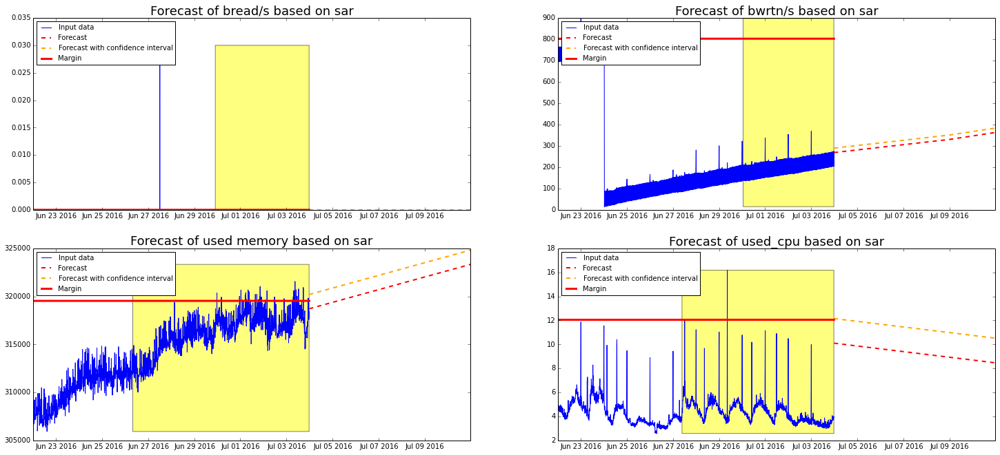

red105.eta.prod.ed1
Len of unique data less than number of clusters


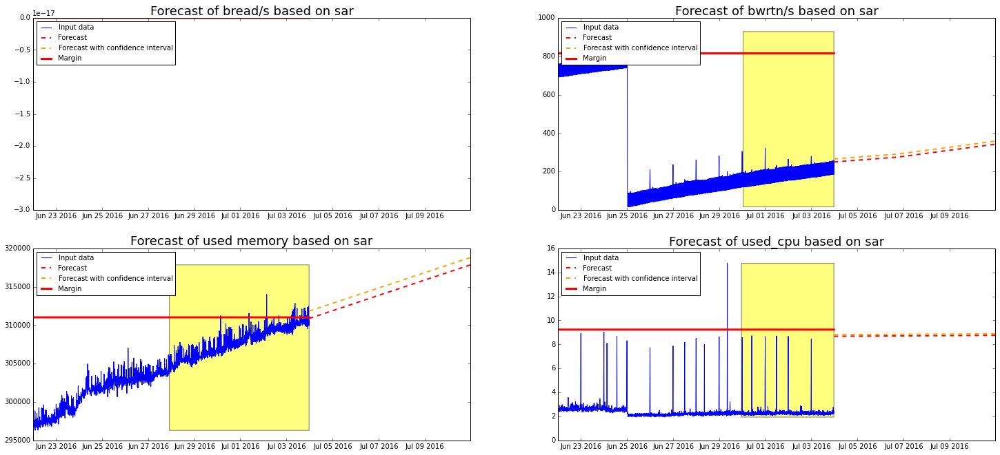

red106.eta.prod.ed1
Len of unique data less than number of clusters


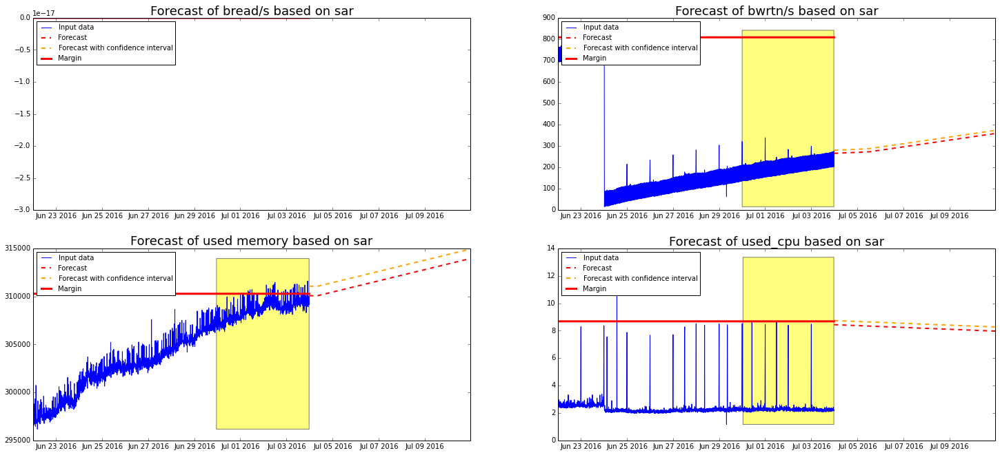

red104.eta.prod.ed5
Len of unique data less than number of clusters


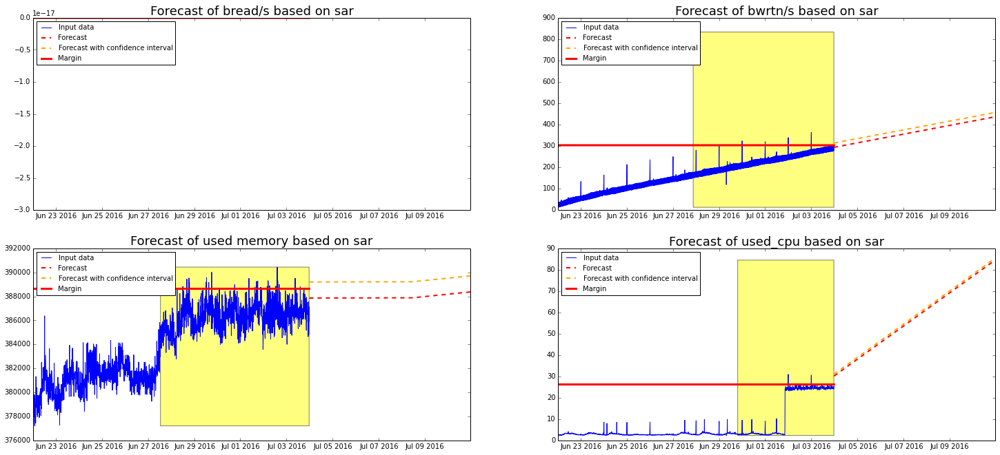

red105.eta.prod.ed5
Len of unique data less than number of clusters


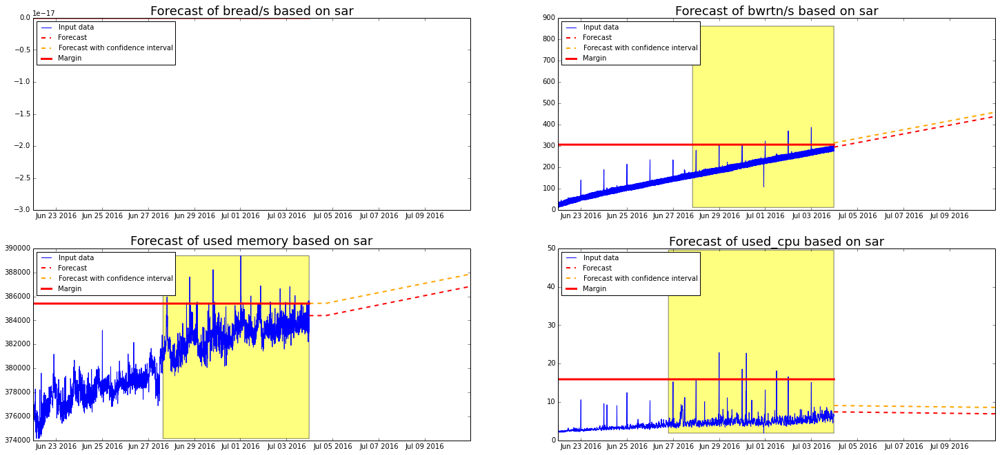

red106.eta.prod.ed5
Len of unique data less than number of clusters


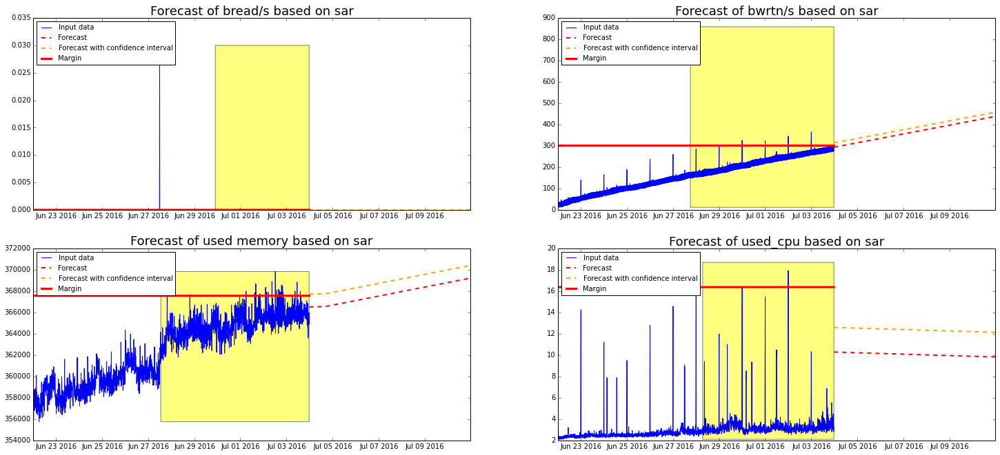

st101.eta.prod.ed1
Len of unique data less than number of clusters


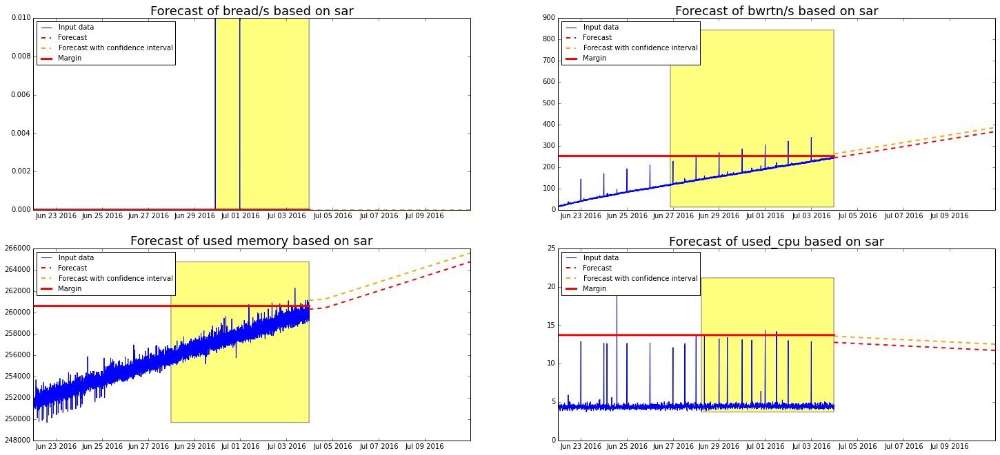

st102.eta.prod.ed1


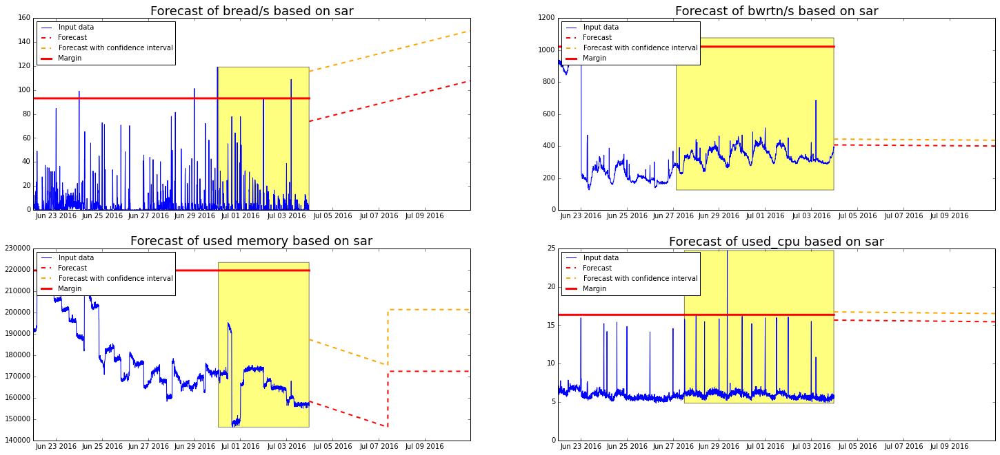

st101.eta.prod.ed5


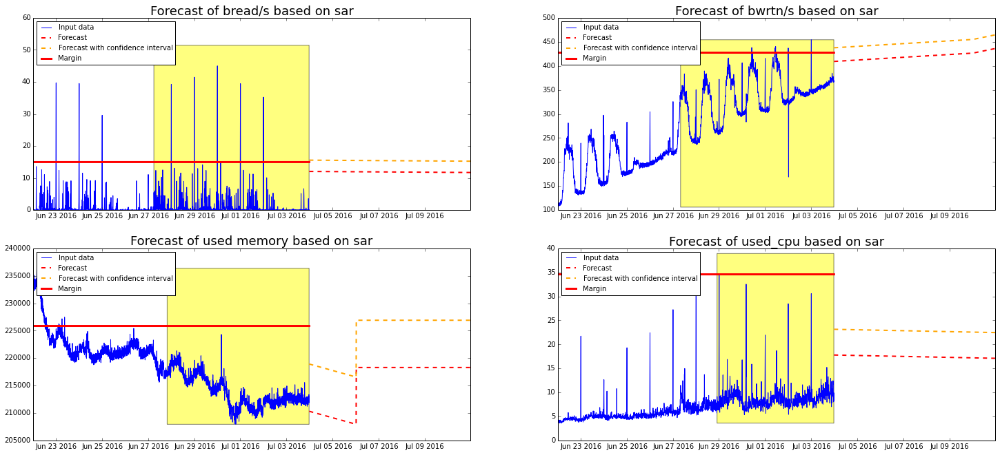

st102.eta.prod.ed5
Len of unique data less than number of clusters


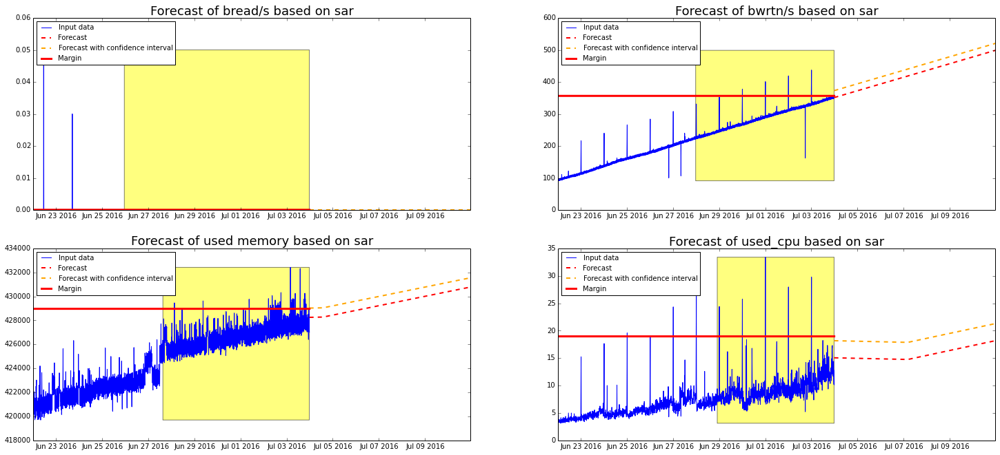

be101.etawf.prod.ed1
Len of unique data less than number of clusters


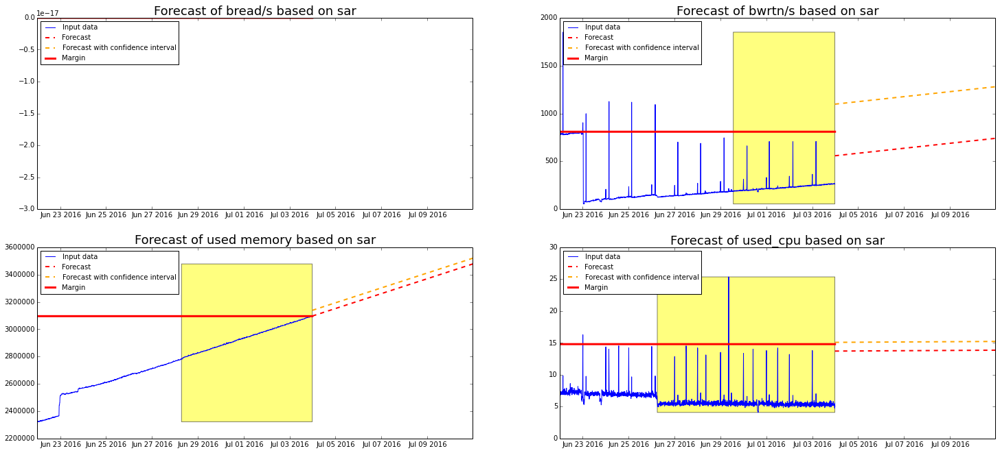

be102.etawf.prod.ed1
Len of unique data less than number of clusters


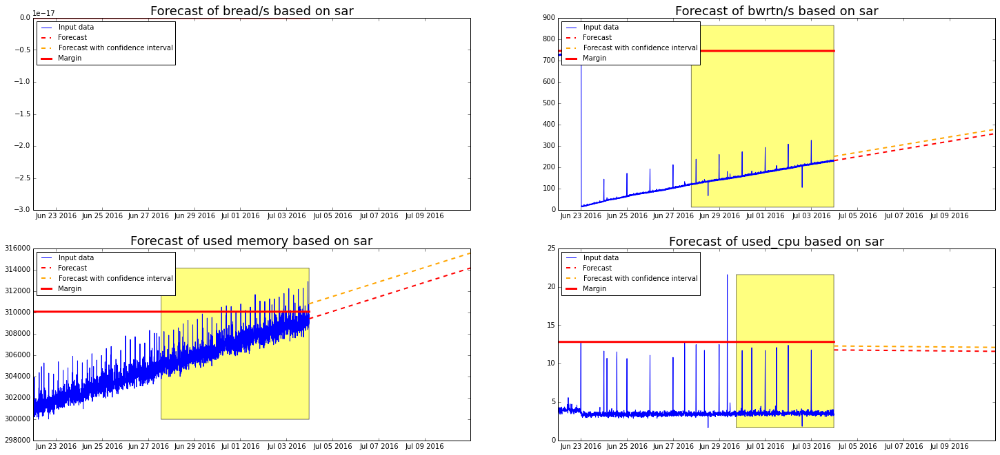

be101.etawf.prod.ed5


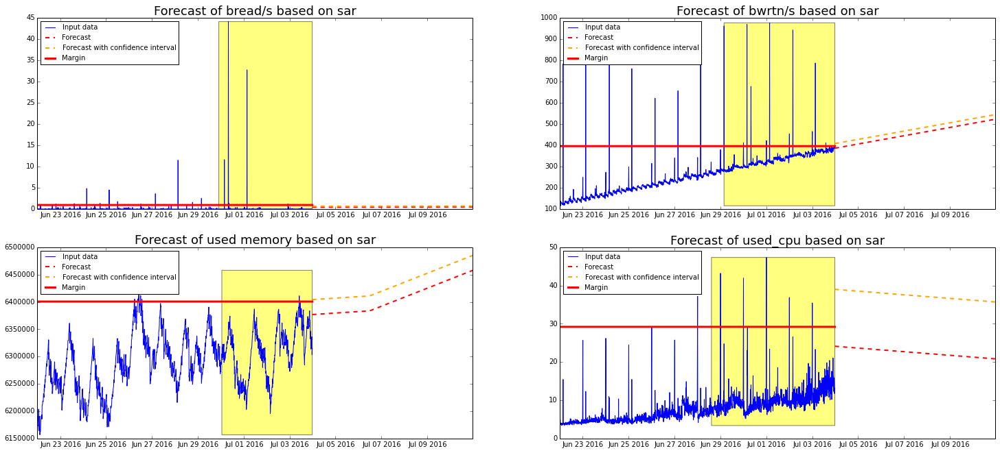

be102.etawf.prod.ed5
Len of unique data less than number of clusters


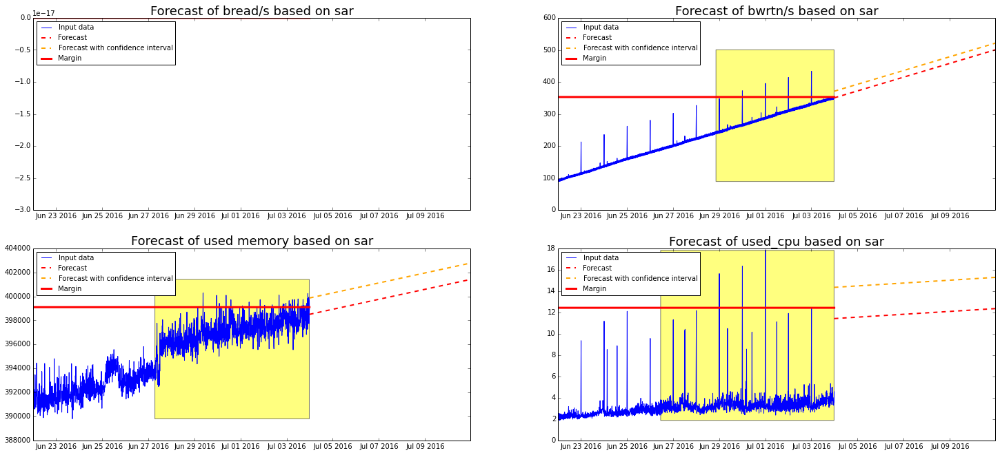

In [15]:
data=pd.read_csv(source_path+"SG5_hosts.csv")
data1=pd.read_csv(source_path+"POD16_2hosts.csv")
data.columns=['Group','server']
data1.columns=['Group','server']
data=data.append(data1)
data=data.reset_index()
data=data[['Group', 'server']]
gr=""
for i in data.index:
    if type(data['Group'].values[i])==float and np.isnan(data['Group'].values[i]):
        data['Group'][i]=gr
    else:
        gr=data['Group'][i]
data.columns=['group','server']

#Analyse data only for ETA
#data=data[data.group.str.startswith('ETA-')]
#data=data.reset_index()
#data=data[['group', 'server']]

minsize=""
DF=pd.DataFrame()
start_d="2016-06-22 00:00:00 AM"
for i in data.index:
    d=data.iloc[i]
    host=d['server']
    print(host)
    #loading host data
    #if host not in os.listdir('/home/annac/tmp/'):
    #    r=get_host_data (host, user, password)
    #    if r==0:
    #        continue
    #    get_resource_tables(path+host)
    if host  in os.listdir(path) and host!='red002.lp.prod.ed1' and len(os.listdir(path+host))>30:
        if start_d=="":
            D=forecast_on_sar(host, user, start="2016-06-16 00:00:00 AM", plot_clust=False)
        else:
            D=forecast_on_sar(host, user, start=start_d, plot_clust=False)
        DF=DF.append(D)

#DF.to_csv(path+"Used_resources.csv")


In [25]:
DF.to_csv(source_path+"Used_resources_POD_16_2.csv")
data.to_csv(source_path+"Groups_Servers.csv")

In [16]:
DF
data.columns=['Group','server']
DFR_CPU=pd.DataFrame()
DFR_RAM=pd.DataFrame()
for h in DF.index.unique():
    d=DF.loc[h]
    d=d[d['Param'].str.contains('real_used')]
    d=d[d.Used==max(d.Used)]
    DFR_RAM=DFR_RAM.append(d)
    d=DF.loc[h]
    d=d[d['Param']=='used_cpu']
    DFR_CPU=DFR_CPU.append(d)
DFR_RAM['server']=DFR_RAM.index.values
DFR_CPU['server']=DFR_CPU.index.values
DFR_RAM['Available']=[np.round(np.float16(DFR_RAM.loc[i]['Capacity'])-np.float16(DFR_RAM.loc[i]['Used']),2) \
                      for i in DFR_RAM.index]
DFR_CPU['Available']=[np.round(np.float16(DFR_CPU.loc[i]['Capacity'])*100-np.float16(DFR_CPU.loc[i]['Used'].replace(' %', '')),2) \
                      for i in DFR_CPU.index]
DFR_CPU=pd.merge(DFR_CPU, data)
DFR_RAM=pd.merge(DFR_RAM, data)
print(DFR_RAM.head())
print(DFR_CPU.head())

   Capacity         Details      Param  Resource Used             server  \
0         8  All data in GB  real_used  mem_data    1  be101.pc.prod.ed1   
1         8  All data in GB  real_used  mem_data    1  be102.pc.prod.ed1   
2         8  All data in GB  real_used  mem_data    2  db101.pc.prod.ed1   
3         8  All data in GB  real_used  mem_data    1  db102.pc.prod.ed1   
4         4  All data in GB  real_used  mem_data    1  fe101.pc.prod.ed1   

   Available               Group  
0          7  PC-BE-PROD-ED1-101  
1          7  PC-BE-PROD-ED1-101  
2          6  PC-DB-PROD-ED1-101  
3          7  PC-DB-PROD-ED1-101  
4          3  PC-FE-PROD-ED1-101  

[5 rows x 8 columns]
   Capacity                          Details     Param  Resource     Used  \
0         4  Used in %. All data ncores*100%  used_cpu  cpu_data   9.98 %   
1         4  Used in %. All data ncores*100%  used_cpu  cpu_data   9.56 %   
2         4  Used in %. All data ncores*100%  used_cpu  cpu_data  10.28 %   
3  

# Store of stats data!! Be sure you change the filename if you analyse new data
## Current is
## MIA_users=15256
## MIA_cusomers=82
## MAD_users=2071
## MAD_customers=28
## OFSC - version 16.2

In [17]:
MIA_users=15256
MIA_cusomers=82
MAD_users=2071
MAD_customers=28

Users=[MIA_users if "ed1" in x else MAD_users for x in DFR_RAM.server.values]
Customers=[MIA_cusomers if "ed1" in x else MAD_customers for x in DFR_RAM.server.values]
DFR_RAM['Users']=Users
DFR_RAM['Customers']=Customers
Users=[MIA_users if "ed1" in x else MAD_users for x in DFR_CPU.server.values]
Customers=[MIA_cusomers if "ed1" in x else MAD_customers for x in DFR_CPU.server.values]
DFR_CPU['Users']=Users
DFR_CPU['Customers']=Customers

DFR_RAM.to_csv(source_path+"RAM_stats_data_OFSC16.2.csv")
DFR_CPU.to_csv(source_path+"CPU_stats_data_OFSC16.2.csv")

ETA-HA.ETA-HA-PROD-ED1-101


/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:33: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETA-HA.ETA-HA-PROD-ED1-101,2,Memory,64,17.0000
1,ETA-HA.ETA-HA-PROD-ED1-101,2,CPU,800,54.3125


Summary CPU 
Used 6.7890625 %
Summary RAM 
Used 26.5625 %
ETA-HA.ETA-HA-PROD-ED5-101


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETA-HA.ETA-HA-PROD-ED5-101,2,Memory,64,3.000000
1,ETA-HA.ETA-HA-PROD-ED5-101,2,CPU,800,19.765625


Summary CPU 
Used 2.470703125 %
Summary RAM 
Used 4.6875 %


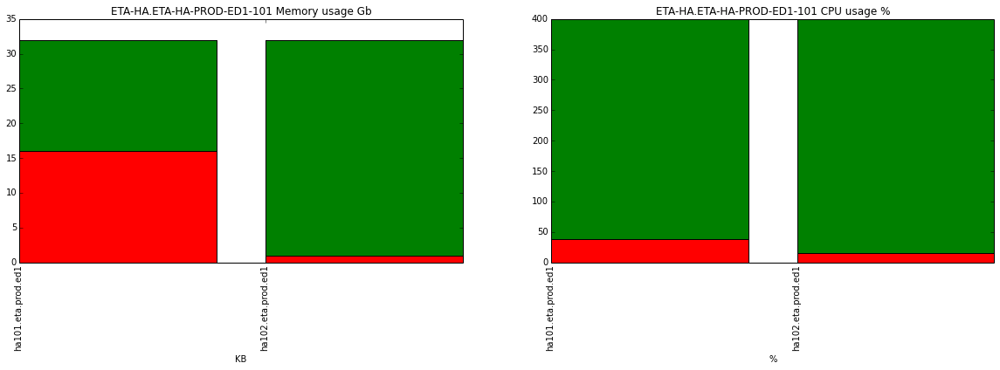

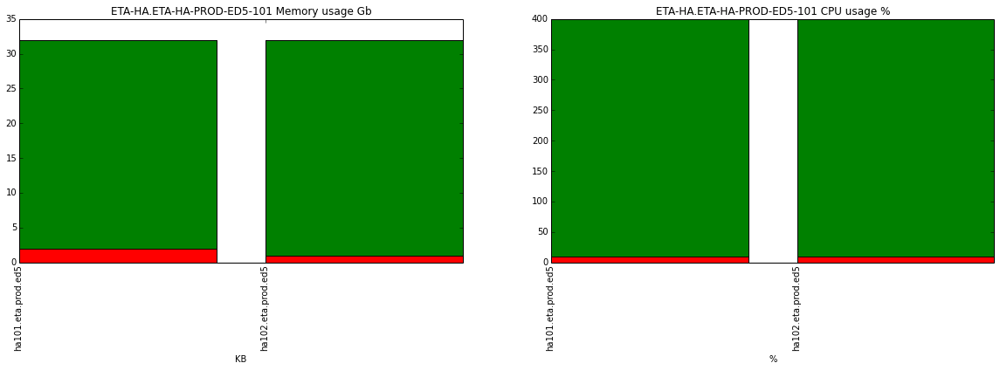

In [18]:
D=get_resource_data('ETA-HA-PROD')
D.to_csv(path+"ETA-HA-PROD_stats.csv")

#### ETA-BE-APP-PROD group of hosts

ETA-BE-APP.ETA-BE-APP-PROD-ED1-101


/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:33: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETA-BE-APP.ETA-BE-APP-PROD-ED1-101,12,Memory,576,66
1,ETA-BE-APP.ETA-BE-APP-PROD-ED1-101,12,CPU,9600,918


Summary CPU 
Used 9.5625 %
Summary RAM 
Used 11.4562988281 %
ETA-BE-APP.ETA-BE-APP-PROD-ED5-101


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETA-BE-APP.ETA-BE-APP-PROD-ED5-101,4,Memory,192,25.0
1,ETA-BE-APP.ETA-BE-APP-PROD-ED5-101,4,CPU,3200,219.5


Summary CPU 
Used 6.859375 %
Summary RAM 
Used 13.0249023438 %


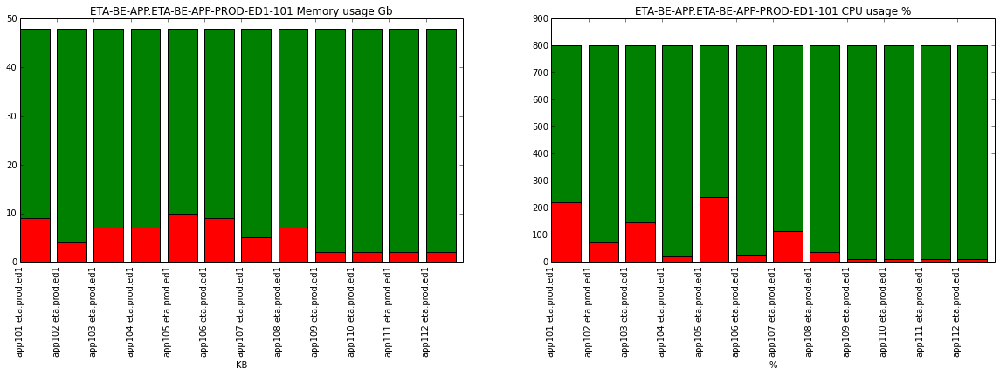

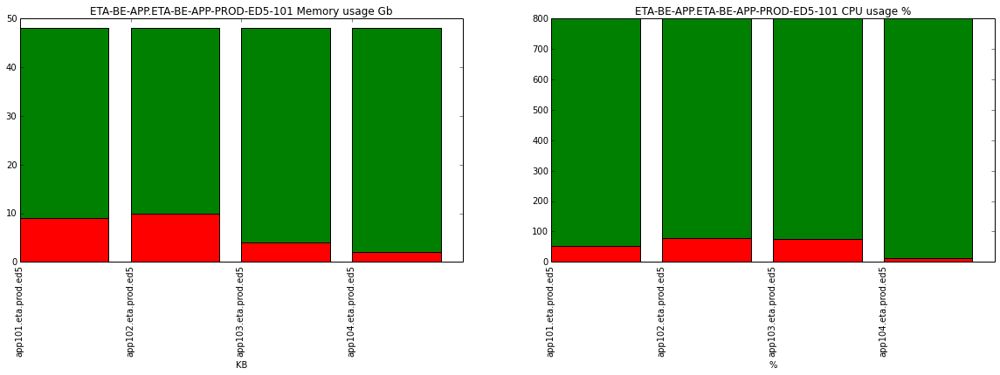

In [19]:
D=get_resource_data('ETA-BE-APP-PROD')
D.to_csv(path+"ETA-BE-APP-PROD_stats.csv")

### ETA-BE-CUSTOM group of hosts

ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD-ED1-101


/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:33: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD-ED1-101,2,Memory,32,4.00000
1,ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD-ED1-101,2,CPU,800,33.96875


Summary CPU 
Used 4.24609375 %
Summary RAM 
Used 12.5 %
ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD-ED5-101


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD-ED5-101,2,Memory,32,4.0000
1,ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD-ED5-101,2,CPU,800,88.4375


Summary CPU 
Used 11.0546875 %
Summary RAM 
Used 12.5 %


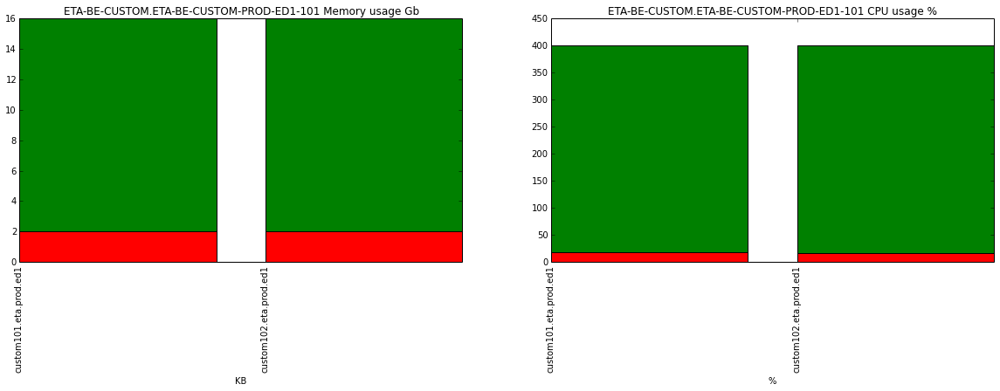

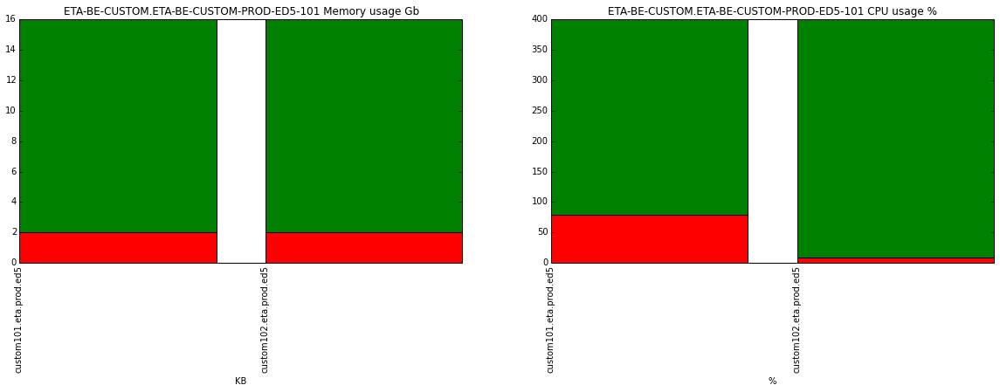

In [20]:
D=get_resource_data('ETA-BE-CUSTOM')
D.to_csv(path+"ETA-BE-CUSTOM_stats.csv")

### ETA-FE-PROD group 

ETA-FE.ETA-FE-PROD-ED1-101


/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:33: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETA-FE.ETA-FE-PROD-ED1-101,19,Memory,136,87
1,ETA-FE.ETA-FE-PROD-ED1-101,19,CPU,7600,446


Summary CPU 
Used 5.86842105263 %
Summary RAM 
Used 63.96484375 %
ETA-FE.ETA-FE-PROD-ED5-101


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETA-FE.ETA-FE-PROD-ED5-101,8,Memory,64,23.00
1,ETA-FE.ETA-FE-PROD-ED5-101,8,CPU,3200,274.25


Summary CPU 
Used 8.5703125 %
Summary RAM 
Used 35.9375 %


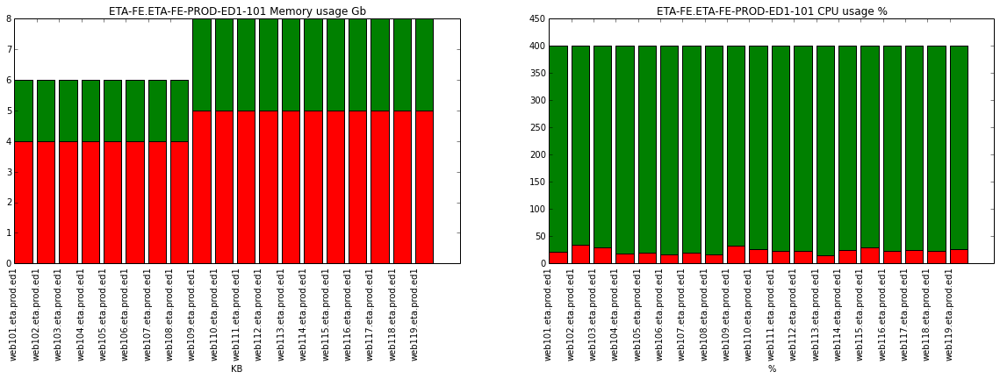

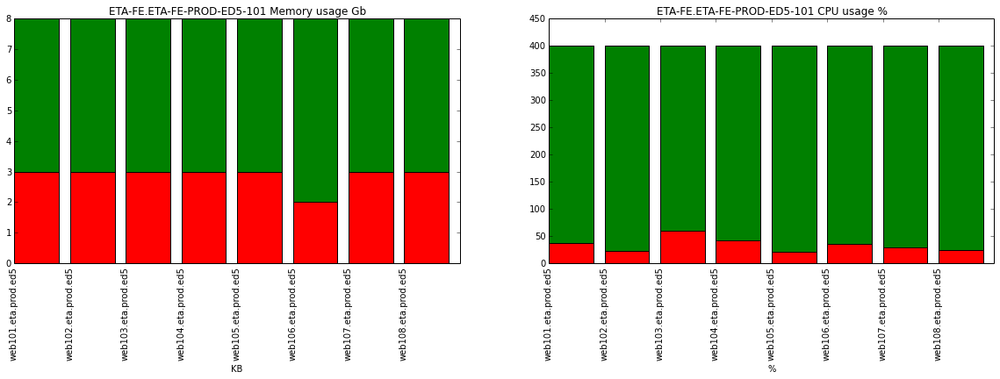

In [21]:
D=get_resource_data('ETA-FE-PROD')
D.to_csv(path+"ETA-FE-PROD_stats.csv")

ETA-FE-SERVICES.ETA-FE-SERVICES-PROD-ED1-101


/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:33: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETA-FE-SERVICES.ETA-FE-SERVICES-PROD-ED1-101,5,Memory,40,35.0000
1,ETA-FE-SERVICES.ETA-FE-SERVICES-PROD-ED1-101,5,CPU,2000,87.1875


Summary CPU 
Used 4.359375 %
Summary RAM 
Used 87.5 %
ETA-FE-SERVICES.ETA-FE-SERVICES-PROD-ED5-101


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETA-FE-SERVICES.ETA-FE-SERVICES-PROD-ED5-101,4,Memory,32,28.00
1,ETA-FE-SERVICES.ETA-FE-SERVICES-PROD-ED5-101,4,CPU,1600,145.25


Summary CPU 
Used 9.078125 %
Summary RAM 
Used 87.5 %


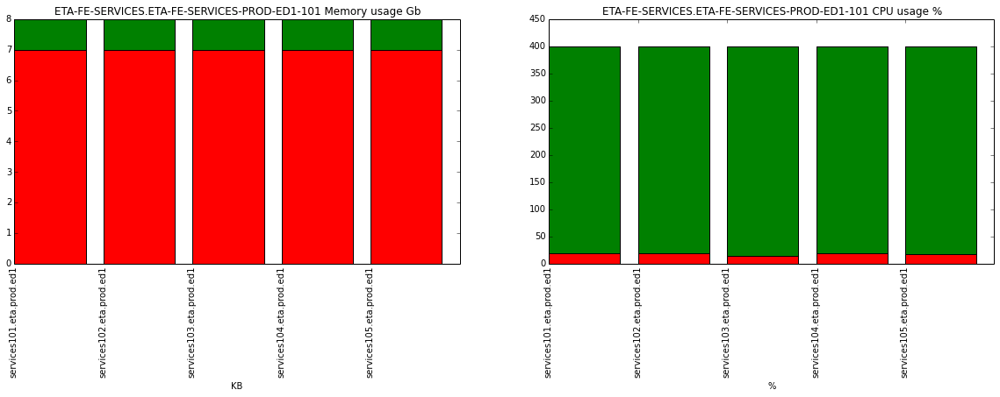

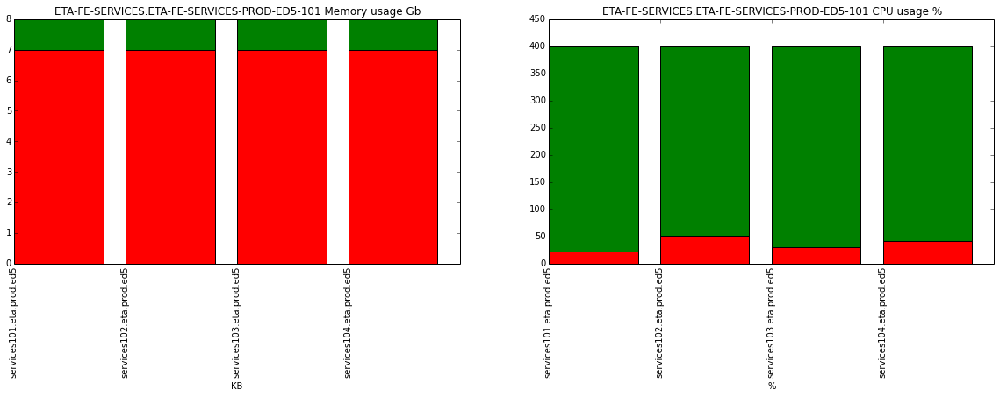

In [22]:
D=get_resource_data('ETA-FE-SERVICES')
D.to_csv(path+"ETA-FE-SERVICES.csv")

ETA-DB.ETA-DB-PROD-ED1-101


/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:33: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETA-DB.ETA-DB-PROD-ED1-101,2,Memory,504,137.0
1,ETA-DB.ETA-DB-PROD-ED1-101,2,CPU,9600,275.5


Summary CPU 
Used 2.86979166667 %
Summary RAM 
Used 27.1728515625 %
ETA-DB.ETA-DB-PROD-ED5-101


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETA-DB.ETA-DB-PROD-ED5-101,2,Memory,504,73.0000
1,ETA-DB.ETA-DB-PROD-ED5-101,2,CPU,9600,119.9375


Summary CPU 
Used 1.24934895833 %
Summary RAM 
Used 14.4897460938 %


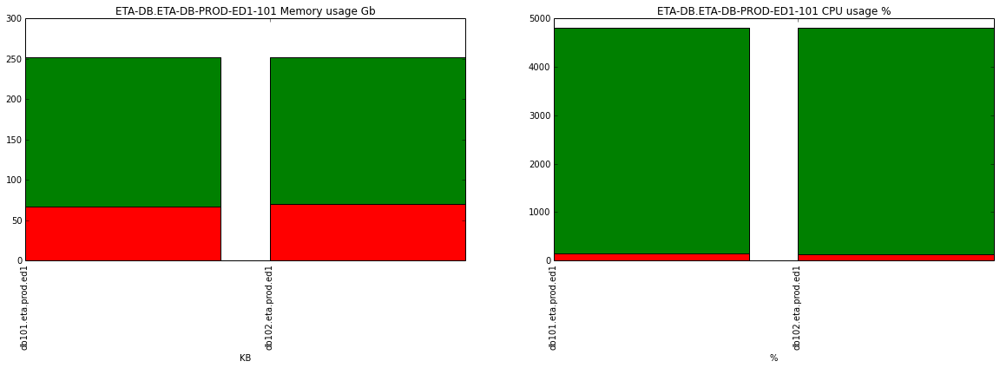

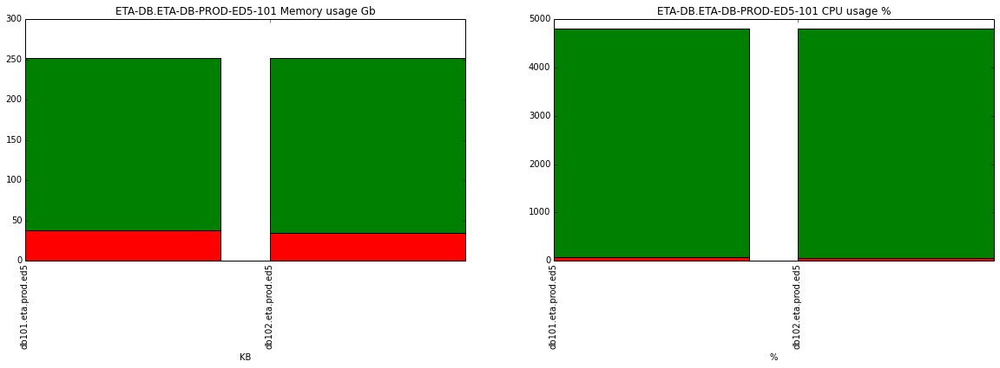

In [23]:
D=get_resource_data('ETA-DB-PROD')
D.to_csv(path+"ETA-DB-PROD.csv")


ETA-FS.ETA-FS-PROD-ED1-101


/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:33: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETA-FS.ETA-FS-PROD-ED1-101,2,Memory,504,32
1,ETA-FS.ETA-FS-PROD-ED1-101,2,CPU,9600,86


Summary CPU 
Used 0.895833333333 %
Summary RAM 
Used 6.34765625 %
ETA-FS.ETA-FS-PROD-ED5-101


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETA-FS.ETA-FS-PROD-ED5-101,2,Memory,504,16.0000
1,ETA-FS.ETA-FS-PROD-ED5-101,2,CPU,9600,52.0625


Summary CPU 
Used 0.542317708333 %
Summary RAM 
Used 3.173828125 %


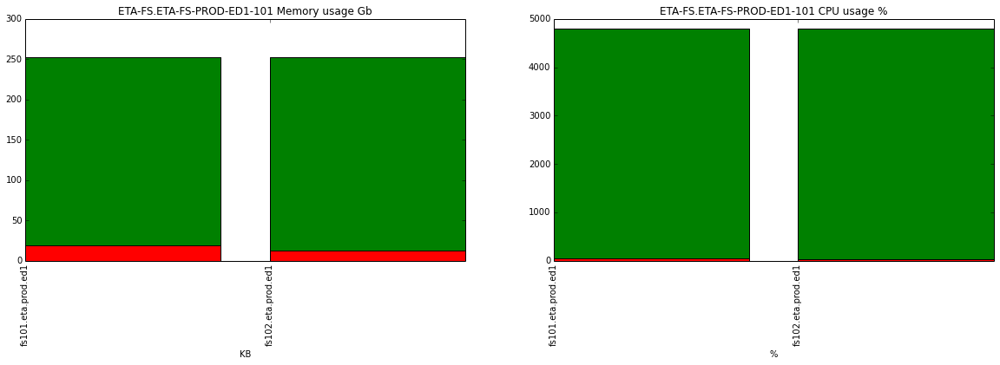

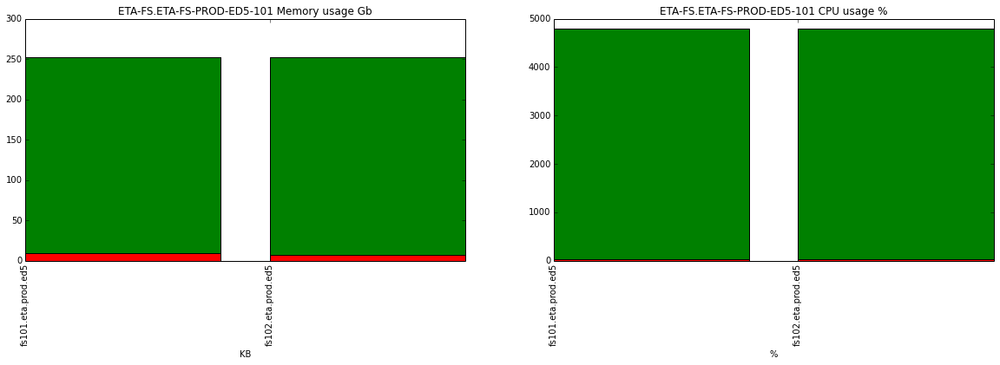

In [24]:
D=get_resource_data('ETA-FS-PROD')
D.to_csv(path+"ETA-FS-PROD.csv")

ETAWF-BE.ETAWF-BE-PROD-ED1-101


/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:33: SettingWithCopyWarning: A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index,col_indexer] = value instead


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETAWF-BE.ETAWF-BE-PROD-ED1-101,2,Memory,16,4.000
1,ETAWF-BE.ETAWF-BE-PROD-ED1-101,2,CPU,800,27.625


Summary CPU 
Used 3.453125 %
Summary RAM 
Used 25.0 %
ETAWF-BE.ETAWF-BE-PROD-ED5-101


,Group,Number,Resource,Sum_capacity,Sum_used
0,ETAWF-BE.ETAWF-BE-PROD-ED5-101,2,Memory,16,8.000
1,ETAWF-BE.ETAWF-BE-PROD-ED5-101,2,CPU,800,41.625


Summary CPU 
Used 5.203125 %
Summary RAM 
Used 50.0 %


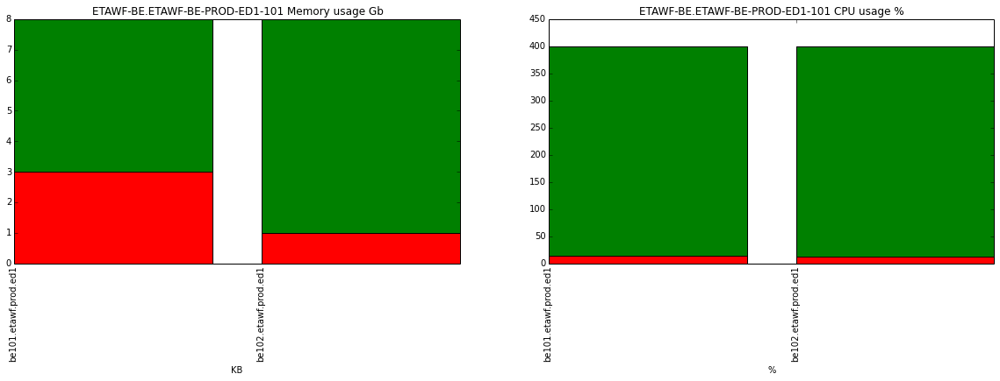

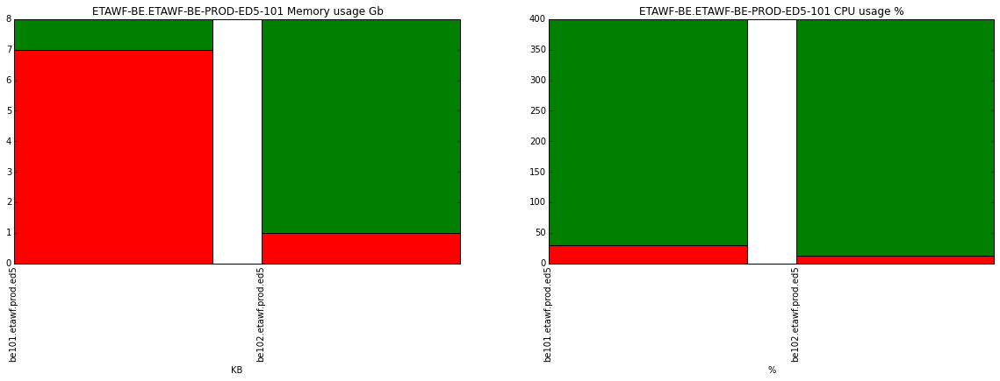

In [25]:
D=get_resource_data('ETAWF-BE-PROD')
D.to_csv(path+'ETAWF-BE-PROD')

In [26]:
DFR_CPU_d=DFR_CPU[['Capacity', 'Details', 'Resource','Used', 'server', 'Available']]
DFR_CPU_d.columns=['Capacity_cpu', 'Details_cpu', 'Resource','Used_cpu', 'server', 'Available_cpu']
DFR_RAM_d=DFR_RAM[['Capacity', 'Details', 'Resource','Used', 'server', 'Available', 'Group']]
DFR_RAM_d.columns=['Capacity_mem', 'Details_mem', 'Resource','Used_mem', 'server', 'Available_mem', 'Group']
D=DFR_CPU_d.merge(DFR_RAM_d, on='server')
RES=pd.DataFrame()
for G in D.Group.unique():
    d=D[D.Group==G]
    d['util_mem']=100*d['Used_mem']/d['Capacity_mem']
    d['util_cpu']=[np.float16(x.replace(' %','')) for x in d['Used_cpu']]
    
    min_util_mem=min(d['util_mem'])
    max_util_mem=max(d['util_mem'])
    avg_util_mem=100*(sum(d['Used_mem'])/sum(d['Capacity_mem']))
    sum_utilized_mem=sum(d['Used_mem'])
    s=d['Capacity_mem'].unique()
    mem_per_fost=','.join(str(x) for x in s )
    
    min_util_cpu=min(d['util_cpu'])
    max_util_cpu=max(d['util_cpu'])
    avg_util_cpu=100*(sum(d['util_cpu'])/sum(100*d['Capacity_cpu']))
    sum_utilized_cpu=sum(d['util_cpu'])
    s1=d['Capacity_cpu'].unique()
    cpu_per_fost=','.join(str(x) for x in s1 )
    RES=RES.append({'Server_class':G, 'Number_of_hosts':d.shape[0],'Mem_min_utilized':min_util_mem, \
                    'Mem_max_utilized':max_util_mem, 'Mem_avg_clust':avg_util_mem, 'Config_mem':mem_per_fost,\
                    'Mem_Sum_utilized': sum_utilized_mem,\
                   'CPU_min_utilized':min_util_cpu, \
                    'CPU_max_utilized':max_util_cpu, 'CPU_avg_clust':avg_util_cpu, 'Config_cpu':cpu_per_fost,\
                    'CPU_Sum_utilized': sum_utilized_cpu},ignore_index=True)
RES=RES[~RES.Server_class.str.contains('ETAWF')]
#RES.head()
#RES.to_csv(source_path+'Result for ETA classes.csv')

In [28]:
RES.head()

,CPU_Sum_utilized,CPU_avg_clust,CPU_max_utilized,CPU_min_utilized,Config_cpu,Config_mem,Mem_Sum_utilized,Mem_avg_clust,Mem_max_utilized,Mem_min_utilized,Number_of_hosts,Server_class
0,19.539062,2.442383,9.976562,9.562500,4.0,8.0,2,12.50,12.5,12.5,2,PC-BE-PROD-ED1-101
1,19.968750,2.496094,10.281250,9.687500,4.0,8.0,3,18.75,25.0,12.5,2,PC-DB-PROD-ED1-101
2,18.718750,4.679688,9.437500,9.281250,2.0,4.0,2,25.00,25.0,25.0,2,PC-FE-PROD-ED1-101
3,157.140625,9.821289,48.500000,29.765625,4.0,8.0,8,25.00,37.5,12.5,4,LP-RED-AUTH-PROD-ED1-01
4,266.000000,13.300000,65.625000,28.875000,4.0,8.0,16,40.00,50.0,25.0,5,LP-FE-PROD-ED1-101


In [30]:
import plotly
import plotly.graph_objs
import pandas as pd
import plotly.graph_objs as go
import plotly.plotly as py
import six
import numpy
from plotly.tools import FigureFactory as FF
from plotly.offline import download_plotlyjs, init_notebook_mode,  plot
from plotly.graph_objs import *
from matplotlib import colors
from datetime import datetime
from operator import itemgetter
from scipy import stats
from numpy import *

table=RES#pd.read_csv('/home/nataliai/Downloads/temp/2016-07-19/Result for ETA classes.csv', ",")

def trace_Box(x_data, y_data, color_, name, text):
    track=go.Bar(
        x=x_data,
        y=y_data,
        name=name,
        text=text,
        marker=dict(
            color=color_,
            line=dict(
                color=color_,
                width=1.5,
            )
        ),
        opacity=0.6,
    )
    return track;

x_range=[table['Server_class'][i].split(".")[1]  for i in range(len(table['Server_class'])) if "." in table['Server_class'][i]]

tr=Scatter({
        'x': x_range,
        'y': table['Mem_avg_clust'],
        'name': 'Total Cluster load', 
        'mode': 'markers',
        'line': {
            'color': "red",
            'width': 1,
        },
        'marker': {
            'color': "red",
            'symbol': 24,
            'size' : 30,
        },
    })


min_trace=trace_Box(x_range, table['Mem_min_utilized'], "green", "min server load", table['Mem_min_utilized'])

max_trace_diff=[table['Mem_max_utilized'][i]-table['Mem_min_utilized'][i] for i in range(len(table['Server_class']))]
max_trace=trace_Box(x_range, max_trace_diff, "blue", "max server load", table['Mem_max_utilized'])

trace_100_per=[100-table['Mem_max_utilized'][i] for i in range(len(table['Server_class']))]
trace_100=trace_Box(x_range, trace_100_per, "gray", "Free capacity", trace_100_per)

data=[min_trace, max_trace, trace_100, tr]

layout = {
    'barmode': 'stack',
    'xaxis': {
        'showgrid': True,
        'title' : 'Server_class',
    },
    'yaxis': {
        'showgrid': True,
        'title' : '% of Utilized',
    }
    }

fig = {
    'data': data,
    'layout': layout,
}

plot(fig, filename="1.html")
x=["A.d", "H.z", "Y.f"]

In [31]:
MIA_users=15256
MIA_cusomers=82
MAD_users=2071
MAD_customers=28

Users=[MIA_users if "ED1" in x else MAD_users for x in RES.Server_class.values]
Customers=[MIA_cusomers if "ED1" in x else MAD_customers for x in RES.Server_class.values]
RES['Users']=Users
RES['Customers']=Customers


In [32]:
RES.head()

,CPU_Sum_utilized,CPU_avg_clust,CPU_max_utilized,CPU_min_utilized,Config_cpu,Config_mem,Mem_Sum_utilized,Mem_avg_clust,Mem_max_utilized,Mem_min_utilized,Number_of_hosts,Server_class,Users,Customers
0,19.539062,2.442383,9.976562,9.562500,4.0,8.0,2,12.50,12.5,12.5,2,PC-BE-PROD-ED1-101,15256,82
1,19.968750,2.496094,10.281250,9.687500,4.0,8.0,3,18.75,25.0,12.5,2,PC-DB-PROD-ED1-101,15256,82
2,18.718750,4.679688,9.437500,9.281250,2.0,4.0,2,25.00,25.0,25.0,2,PC-FE-PROD-ED1-101,15256,82
3,157.140625,9.821289,48.500000,29.765625,4.0,8.0,8,25.00,37.5,12.5,4,LP-RED-AUTH-PROD-ED1-01,15256,82
4,266.000000,13.300000,65.625000,28.875000,4.0,8.0,16,40.00,50.0,25.0,5,LP-FE-PROD-ED1-101,15256,82


In [43]:
classes=np.unique([x.split('-ED')[0] for x in RES.Server_class])
classes=filter(lambda x: 'ETAWF' not in x, classes)
Class_Models_Mem=pd.DataFrame()
Class_Models_CPU=pd.DataFrame()
for C in classes:
    #print(C)
    d=RES[RES.Server_class.str.contains(C)]
    d=d[['Mem_Sum_utilized','Config_mem', 'Users', 'Number_of_hosts']]
    #plt.plot(d['Users'], d['Mem_Sum_utilized'])
    lm=LinearRegression()
    lm.fit(d['Users'].reshape(len(d['Users']),1), d['Mem_Sum_utilized'])
    s=d.Config_mem.unique()
    s=(','.join(str(x) for x in s )).split(',')
    s=np.unique([np.float16(x) for x in s])
    s1=','.join(str(x) for x in s )
    Class_Models_Mem=Class_Models_Mem.append({'Class':C,'mem_a':lm.coef_[0],'mem_b':lm.intercept_, 'Analysed mem config':s1,'Planned mem config':max(s),'Min_number of hosts':min(d['Number_of_hosts'])}, ignore_index=True)
    
    d=RES[RES.Server_class.str.contains(C)]
    d=d[['CPU_Sum_utilized','Config_cpu', 'Users', 'Number_of_hosts']]
    #plt.plot(d['Users'], d['CPU_Sum_utilized'])
    lm=LinearRegression()
    lm.fit(d['Users'].reshape(len(d['Users']),1), d['CPU_Sum_utilized'])
    s=d.Config_cpu.unique()
    s=(','.join(str(x) for x in s )).split(',')
    s=np.unique([np.float16(x) for x in s])
    s=','.join(str(x) for x in s )
    Class_Models_CPU=Class_Models_CPU.append({'Class':C,'cpu_a':lm.coef_[0],'cpu_b':lm.intercept_, 'Analysed cpu config':s,'Min_number of hosts':min(d['Number_of_hosts'])}, ignore_index=True)
Class_Models=Class_Models_Mem.merge(Class_Models_CPU, left_on=['Class','Min_number of hosts'], right_on=['Class','Min_number of hosts'], how='inner')


In [44]:
Class_Models.to_csv(source_path+"Models_ETA_16.2_n.csv")

In [45]:
ETA_Capacity_Plan=Class_Models[['Class','Min_number of hosts','Planned mem config','mem_a','mem_b','cpu_a','cpu_b','Analysed cpu config']]
Users=30000
MEM=np.ceil(2*(Users*ETA_Capacity_Plan['mem_a']+ETA_Capacity_Plan['mem_b'])/ETA_Capacity_Plan['Planned mem config'])
CPU=np.ceil((2*(Users*ETA_Capacity_Plan['cpu_a']+ETA_Capacity_Plan['cpu_b'])/ETA_Capacity_Plan['Planned mem config'])/100)
Required_hosts=map(lambda x,y,z:max(x,y,z), ETA_Capacity_Plan['Min_number of hosts'].values, MEM.values, CPU.values)
ETA_Capacity_Plan['Users']=[Users]*ETA_Capacity_Plan.shape[0]
ETA_Capacity_Plan['Required_hosts']=Required_hosts
ETA_Capacity_Plan=ETA_Capacity_Plan[['Class','Users','Min_number of hosts','Planned mem config','Analysed cpu config','Required_hosts']]
ETA_Capacity_Plan.columns=['Class','Users','Min_number of hosts','Planned mem config','Planned cpu config','Required_hosts']
display(ETA_Capacity_Plan)

,Class,Users,Min_number of hosts,Planned mem config,Planned cpu config,Required_hosts
0,API-FE-PROD,30000,2,8,4.0,2
1,ETA-BE-APP.ETA-BE-APP-PROD,30000,4,48,8.0,5
2,ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD,30000,2,16,4.0,2
3,ETA-DB.ETA-DB-PROD,30000,2,252,48.0,2
4,ETA-FE-SERVICES.ETA-FE-SERVICES-PROD,30000,4,8,4.0,11
5,ETA-FE.ETA-FE-PROD,30000,8,8,4.0,40
6,ETA-FS.ETA-FS-PROD,30000,2,252,48.0,2
7,ETA-HA.ETA-HA-PROD,30000,2,32,4.0,3
8,ETA-RED-HISTORY.ETA-RED-HISTORY-PROD,30000,3,24,4.0,3
9,ETA-RED-SESSION.ETA-RED-SESSION-PROD,30000,3,8,4.0,3


In [46]:
ETA_Capacity_Plan=Class_Models[['Class','Min_number of hosts','Planned mem config','mem_a','mem_b','cpu_a','cpu_b']]
Users=60000
MEM=np.ceil(2*(Users*ETA_Capacity_Plan['mem_a']+ETA_Capacity_Plan['mem_b'])/ETA_Capacity_Plan['Planned mem config'])
CPU=np.ceil((2*(Users*ETA_Capacity_Plan['cpu_a']+ETA_Capacity_Plan['cpu_b'])/ETA_Capacity_Plan['Planned mem config'])/100)
Required_hosts=map(lambda x,y,z:max(x,y,z), ETA_Capacity_Plan['Min_number of hosts'].values, MEM.values, CPU.values)
ETA_Capacity_Plan['Users']=[Users]*ETA_Capacity_Plan.shape[0]
ETA_Capacity_Plan['Required_hosts']=Required_hosts
display(ETA_Capacity_Plan[['Class','Users','Min_number of hosts','Planned mem config','Required_hosts']])

,Class,Users,Min_number of hosts,Planned mem config,Required_hosts
0,API-FE-PROD,60000,2,8,2
1,ETA-BE-APP.ETA-BE-APP-PROD,60000,4,48,9
2,ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD,60000,2,16,2
3,ETA-DB.ETA-DB-PROD,60000,2,252,3
4,ETA-FE-SERVICES.ETA-FE-SERVICES-PROD,60000,4,8,15
5,ETA-FE.ETA-FE-PROD,60000,8,8,77
6,ETA-FS.ETA-FS-PROD,60000,2,252,2
7,ETA-HA.ETA-HA-PROD,60000,2,32,5
8,ETA-RED-HISTORY.ETA-RED-HISTORY-PROD,60000,3,24,3
9,ETA-RED-SESSION.ETA-RED-SESSION-PROD,60000,3,8,3


In [47]:
ETA_Capacity_Plan=Class_Models[['Class','Min_number of hosts','Planned mem config','mem_a','mem_b','cpu_a','cpu_b']]
Users=90000
MEM=np.ceil(2*(Users*ETA_Capacity_Plan['mem_a']+ETA_Capacity_Plan['mem_b'])/ETA_Capacity_Plan['Planned mem config'])
CPU=np.ceil((2*(Users*ETA_Capacity_Plan['cpu_a']+ETA_Capacity_Plan['cpu_b'])/ETA_Capacity_Plan['Planned mem config'])/100)
Required_hosts=map(lambda x,y,z:max(x,y,z), ETA_Capacity_Plan['Min_number of hosts'].values, MEM.values, CPU.values)
ETA_Capacity_Plan['Users']=[Users]*ETA_Capacity_Plan.shape[0]
ETA_Capacity_Plan['Required_hosts']=Required_hosts
display(ETA_Capacity_Plan[['Class','Users','Min_number of hosts','Planned mem config','Required_hosts']])

,Class,Users,Min_number of hosts,Planned mem config,Required_hosts
0,API-FE-PROD,90000,2,8,3
1,ETA-BE-APP.ETA-BE-APP-PROD,90000,4,48,13
2,ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD,90000,2,16,2
3,ETA-DB.ETA-DB-PROD,90000,2,252,4
4,ETA-FE-SERVICES.ETA-FE-SERVICES-PROD,90000,4,8,19
5,ETA-FE.ETA-FE-PROD,90000,8,8,113
6,ETA-FS.ETA-FS-PROD,90000,2,252,2
7,ETA-HA.ETA-HA-PROD,90000,2,32,7
8,ETA-RED-HISTORY.ETA-RED-HISTORY-PROD,90000,3,24,3
9,ETA-RED-SESSION.ETA-RED-SESSION-PROD,90000,3,8,3


In [48]:
ETA_Capacity_Plan=Class_Models[['Class','Min_number of hosts','Planned mem config','mem_a','mem_b','cpu_a','cpu_b']]
Users=100000
MEM=np.ceil(2*(Users*ETA_Capacity_Plan['mem_a']+ETA_Capacity_Plan['mem_b'])/ETA_Capacity_Plan['Planned mem config'])
CPU=np.ceil((2*(Users*ETA_Capacity_Plan['cpu_a']+ETA_Capacity_Plan['cpu_b'])/ETA_Capacity_Plan['Planned mem config'])/100)
Required_hosts=map(lambda x,y,z:max(x,y,z), ETA_Capacity_Plan['Min_number of hosts'].values, MEM.values, CPU.values)
ETA_Capacity_Plan['Users']=[Users]*ETA_Capacity_Plan.shape[0]
ETA_Capacity_Plan['Required_hosts']=Required_hosts
display(ETA_Capacity_Plan[['Class','Users','Min_number of hosts','Planned mem config','Required_hosts']])

,Class,Users,Min_number of hosts,Planned mem config,Required_hosts
0,API-FE-PROD,100000,2,8,3
1,ETA-BE-APP.ETA-BE-APP-PROD,100000,4,48,14
2,ETA-BE-CUSTOM.ETA-BE-CUSTOM-PROD,100000,2,16,2
3,ETA-DB.ETA-DB-PROD,100000,2,252,5
4,ETA-FE-SERVICES.ETA-FE-SERVICES-PROD,100000,4,8,20
5,ETA-FE.ETA-FE-PROD,100000,8,8,125
6,ETA-FS.ETA-FS-PROD,100000,2,252,2
7,ETA-HA.ETA-HA-PROD,100000,2,32,7
8,ETA-RED-HISTORY.ETA-RED-HISTORY-PROD,100000,3,24,3
9,ETA-RED-SESSION.ETA-RED-SESSION-PROD,100000,3,8,3


In [117]:
ETA_Capacity_Plan.to_csv(source_path+"Models_ETA_16.2.csv")

In [95]:
RES.to_csv(source_path+"Sats_data_from_1wave16.2.csv")